# 1. Data Background and Problem Formulation

In this project, a dataset is given with 900+ data each corresponding to individual indicators of users' experience surveys revolving around proposed system designs -- and how would potential users react or perceive this notion. 

The goal is to provide a deep learning model with an acceptable rate of AUC (0.7 to 0.9) on test dataset in order to be able to predict certain words clearly.

To gain a better sense of the data, we first import the necessities to run the overall code.

---


In [1]:
# Configure output settings to prettify print display

from IPython.display import HTML, display

def set_css():
  display(HTML('''
  <style>
    pre {
        white-space: pre-wrap;
    }
  </style>
  '''))
get_ipython().events.register('pre_run_cell', set_css)

In [2]:
# Ignore warnings to prettify print

import warnings
warnings.filterwarnings("ignore")

In [3]:
!pip install scikit-multilearn
import pandas as pd
import tensorflow as tf
import numpy as np
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import imblearn

You should consider upgrading via the 'c:\users\chari\appdata\local\programs\python\python39\python.exe -m pip install --upgrade pip' command.


In [4]:
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  0


##1.1. Importing the data
We can then import the data via `pandas` package to see the overall nature of the data, the outputs, and the datatypes.

In [5]:
df = pd.read_excel('Sample.xlsx', sheet_name='PROMISE-Extended_Ivan33')
df.drop(columns=['ID', 'ProjectID', 'Class'], axis=1, inplace=True)
df.sample(n=10, random_state=1)

,Requirements,obstructive<==>supportive,complicated<==>easy,inefficient<==>efficient,confusing<==>clear,boring<==>exciting,not interesting<==>interesting,conventional<==>inventive,usual<==>leading edge
718,Secure data transfer over the Internet could b...,7,5,6,6,3,4,3,3
637,The system shall validate the amount is availa...,7,6,7,7,2,3,1,1
759,Sensitive data will be encrypted before being ...,7,6,7,7,4,4,2,3
366,PME Subsystem shall allow building product men...,5,4,6,5,3,4,4,4
543,The system shall be responsive. At the DePaul ...,6,6,7,7,5,6,3,4
41,The product shall synchronize with the office ...,5,5,5,5,5,4,4,5
120,Program Administrators and Nursing Staff Membe...,6,5,6,5,5,4,3,2
725,It must be able to download the most recent me...,6,7,6,7,3,4,3,3
795,Customer must logout of the site after purchas...,3,2,3,2,1,2,4,6
672,Changes made to the Manage My ID website can b...,4,3,4,3,3,4,4,5


In [6]:
data=df.copy()
df.columns

Index(['Requirements', 'obstructive<==>supportive', 'complicated<==>easy',
       'inefficient<==>efficient', ' confusing<==>clear', 'boring<==>exciting',
       'not interesting<==>interesting', 'conventional<==>inventive',
       'usual<==>leading edge'],
      dtype='object')

In [7]:
data['mix']=data['obstructive<==>supportive']+data['complicated<==>easy']+data['inefficient<==>efficient']+data[' confusing<==>clear']+data['boring<==>exciting']+data['not interesting<==>interesting']+data['conventional<==>inventive']+data['usual<==>leading edge']

In [8]:
data.head()

,Requirements,obstructive<==>supportive,complicated<==>easy,inefficient<==>efficient,confusing<==>clear,boring<==>exciting,not interesting<==>interesting,conventional<==>inventive,usual<==>leading edge,mix
0,The system shall refresh the display every 60 ...,3,4,3,3,4,3,6,6,32
1,The application shall match the color of the s...,7,2,5,5,3,3,6,6,37
2,If projected the data must be readable. On a...,7,4,7,7,5,5,5,4,44
3,The product shall be available during normal b...,7,2,7,5,5,5,5,6,42
4,If projected the data must be understandable....,7,2,7,7,5,7,3,3,41


## 1.2. Column Definitions
### 1.2.1. Features

Features are only represented in the first column, which is the `Requirements` column. This column represents the question and/or the funcionalities of the system itself.

### 1.2.2. Labels

Labels, on the other hand, comprised of 8 columns in total. They are:
* **obstructive<==>supportive**, measuring supportiveness.
* **complicated<==>easy**, measuring ease-of-use.
* **inefficient<==>efficient**, measuring efficiency.
* **confusing<==>clear**, measuring brevity and clarity.
* **boring<==>exciting**, measuring excitement.
* **not interesting<==>interesting**, measuring appeal.
* **conventional<==>inventive**, measuring innovation.
* **usual<==>leading edge**, measuring technology usage.

The scales on the labels vary from 1 to 7, in which values closer to 1 corresponds to a more negative connotation, while values closer to 7 is likely to be more positive.

For example, for column `boring<==>exciting`, if a user gives it a 3, whilst this may seem neutral at first glance, we can infer that the user does not regard this system design as easy-to-use -- otherwise they would give it a score of 5 or 6.

For this task, we'll run multiclass multilabel regression since we obtained a good AUC with multiclass regression on one column before with simple regression. **The trick here is to not use a single column.**

With this, we might want to approach the problem within the scope of [Multi-output Regression](https://machinelearningmastery.com/deep-learning-models-for-multi-output-regression/)

First, we separate the labels from the data.

In [9]:
features = df.iloc[:, 0].values # First column in the entire set
labels = df.iloc[:, np.r_[1:9]].values
print("Features is now of type:", type(features), "with shape", features.shape)
print("Labels is now of type:", type(labels), "with shape", labels.shape)

Features is now of type: <class 'numpy.ndarray'> with shape (969,)
Labels is now of type: <class 'numpy.ndarray'> with shape (969, 8)


We know from previous work that the dataset is very much imbalanced, so we would want to try oversampling across all columns and make them our new label. But first, we would want to convert features as word vectors first.

## 1.3. Quick EDA

We can visualize the most used words via `wordcloud` used in our dataset.

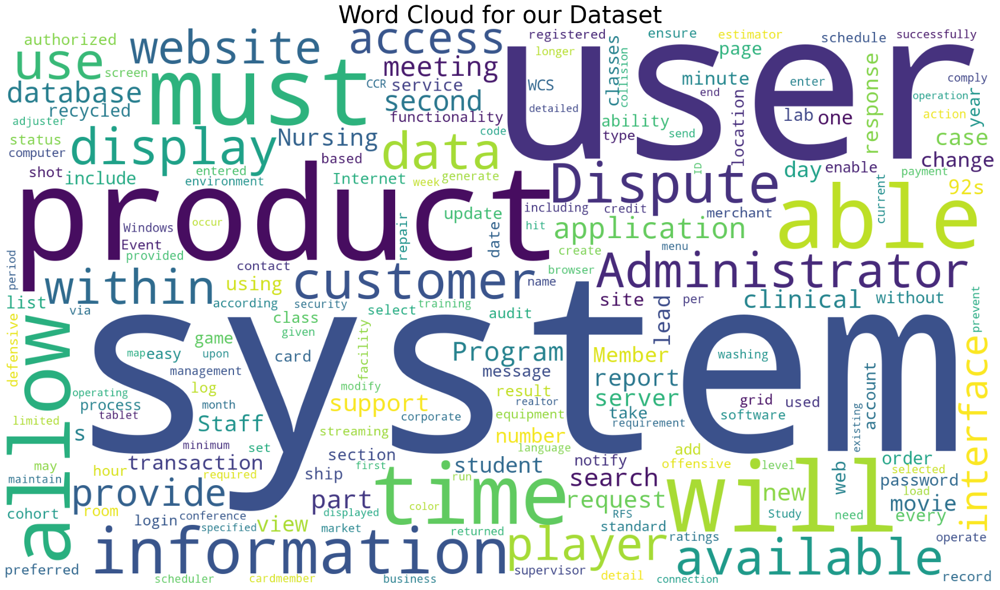

In [10]:
from matplotlib import pyplot as plt
from wordcloud import WordCloud,STOPWORDS
plt.figure(figsize=(30,20))
text =df['Requirements'].values
cloud = WordCloud(
                          stopwords=STOPWORDS,
                          background_color='white',
                          collocations=False,
                          width=1920,
                          height=1080
                         ).generate(" ".join(text))
plt.axis('off')
plt.title("Word Cloud for our Dataset",fontsize=40)
plt.imshow(cloud)

In [11]:
from collections import Counter
for i in range(8):
  print("Column:", df.columns[1:][i])
  print(Counter(labels[:,i]))

Column: obstructive<==>supportive
Counter({7: 418, 6: 281, 5: 152, 4: 63, 3: 37, 2: 16, 1: 2})
Column: complicated<==>easy
Counter({6: 278, 5: 254, 7: 210, 4: 144, 3: 57, 2: 24, 1: 2})
Column: inefficient<==>efficient
Counter({7: 406, 6: 306, 5: 128, 4: 71, 3: 36, 2: 18, 1: 4})
Column:  confusing<==>clear
Counter({7: 443, 6: 245, 5: 148, 4: 68, 3: 38, 2: 23, 1: 4})
Column: boring<==>exciting
Counter({3: 256, 4: 249, 5: 185, 2: 142, 6: 89, 7: 26, 1: 22})
Column: not interesting<==>interesting
Counter({4: 265, 3: 245, 5: 222, 2: 103, 6: 92, 7: 23, 1: 19})
Column: conventional<==>inventive
Counter({3: 273, 2: 267, 4: 164, 5: 102, 1: 101, 6: 55, 7: 7})
Column: usual<==>leading edge
Counter({3: 259, 2: 253, 4: 177, 5: 112, 1: 101, 6: 61, 7: 6})


# 2. Pre-processing
---

## 2.1. Tokenization

Tokenization means splitting each word and vectorizing a text corpus, by turning each text into either a sequence of integers (each integer being the index of a token in a dictionary). This process cleans up our text, lowercase, and remove punctuations. This step is basically the same from our previous work involving LSTMs.

This way, we can see which words appear the most in our training set.

In [12]:
tokenizer = Tokenizer(num_words = 2000, oov_token="<OOV>")
tokenizer.fit_on_texts(features)
word_index = tokenizer.word_index
dict(list(word_index.items())[:10])

{'<OOV>': 1,
 'the': 2,
 'shall': 3,
 'to': 4,
 'system': 5,
 'of': 6,
 'be': 7,
 'a': 8,
 'and': 9,
 'product': 10}

After tokenization, the next step is to turn those tokens into lists of sequence.

In [13]:

sequences = tokenizer.texts_to_sequences(features)
print(sequences[0]) # This corresponds to the first sentence in the training data.

[2, 5, 3, 674, 2, 32, 96, 675, 49]


## 2.2. Padding

When we train neural networks for NLP, we need sequences to be in the same size, that's why we use padding. Padding means that we convert all instances of the training data towards the same size. To do this, we need to specify a fixed length to transform all the instances on.

For the project, we can set the sequence by looking quickly at the average proportion of the training words.

In [14]:
import math
word_counts = []
for i in (features):
  word_counts.append(len(i.split(" ")))
print("Average word counts:" , sum(word_counts)/len(word_counts))

# Round max length of padding to the nearest tenth
max_length = math.ceil((sum(word_counts)/len(word_counts))/10) * 10
print("Padded onto length: ", max_length)

# Delete unused variable
del word_counts 

Average word counts: 18.223942208462333
Padded onto length:  20




We can then proceed to do the actual padding. This is done for all instances of the training example.

In [15]:
padded = pad_sequences(sequences, maxlen=max_length, padding='post', truncating='post')

for i in range(5):
  print("Sequence of length", len(sequences[i]), "was padded onto", len(padded[i]))

Sequence of length 9 was padded onto 20
Sequence of length 16 was padded onto 20
Sequence of length 29 was padded onto 20
Sequence of length 36 was padded onto 20
Sequence of length 35 was padded onto 20


In [16]:
padded

array([[  2,   5,   3, ...,   0,   0,   0],
       [  2,  45,   3, ...,   0,   0,   0],
       [ 69, 879,   2, ...,  17,   4, 451],
       ...,
       [  2,   1,  36, ...,  91, 309,  12],
       [  2,   5,   3, ...,   9, 102,   4],
       [  2,  36,  15, ..., 304,  15,   7]])

## 2.3. SMOTE Oversampling

Generally, oversampling makes fake data so that the minority labels are not squashed by the majority.

Constraint of using SMOTE within this dataset is that it's very fragile to classes with only one example. Since SMOTE works via k-nearest neighbors, at least two members of a class would be mandatory for it to work.

Synthetic samples generated with respect to the most amount of classes in all columns so that input shape (features and labels) are consistent against each other.

## REVISION: ROS Oversampling

ROS generates random data as opposed to the better, more superior SMOTE which generates "more credible" data. We can't use SMOTE on all sheets because of the `n_neighbors` and distance constraint.

We find the least common multiple of all class members amount, and oversample from there to get the matrix dimensions uniform.

In [17]:
import copy
from collections import defaultdict, Counter
from imblearn.over_sampling import SMOTE, RandomOverSampler
max_amount = np.lcm.reduce([1,2,3,4,5,6,7]) * 40
labels_processed = np.zeros((max_amount, 8))

for i in range(8):
  unique_classes = np.unique(df[df.columns[1:][i]])
  amount = [int(
      (max_amount/len(unique_classes)))
      ] * len(unique_classes)
  x = {k:v for (k,v) in zip(unique_classes, amount)}
  smt = RandomOverSampler(sampling_strategy=x)
  X, y = smt.fit_resample(padded, labels[:,i])
  labels_processed[:,i] = y
  print("Column", i, "done.")
  # We don't save nor use the X variable between each iteration, 
  # instead only using the last one.


print("Shape of input features is:", X.shape)
print("Shape of labels is:",labels_processed.shape)

Column 0 done.
Column 1 done.
Column 2 done.
Column 3 done.
Column 4 done.
Column 5 done.
Column 6 done.
Column 7 done.
Shape of input features is: (16800, 20)
Shape of labels is: (16800, 8)


In [18]:
# Sanity check time!
for i in range(8):
  print("For column", df.columns[1:][i])
  print(Counter(labels_processed[:,i]),"\n------")


print("First ten entries of the processed labels:\n", labels_processed[:10,:])
print("First ten entries of the processed features:\n", X[:10,:])

# Last and final assertion to catch matrix errors
try:
  assert(X.shape[0] == labels_processed.shape[0])
  print("Assertion completed!")
except AssertionError:
  print("Error!\nShape of X is", X.shape, "while labels is", labels_processed.shape)
  raise AssertionError

For column obstructive<==>supportive
Counter({3.0: 2400, 7.0: 2400, 5.0: 2400, 6.0: 2400, 2.0: 2400, 4.0: 2400, 1.0: 2400}) 
------
For column complicated<==>easy
Counter({4.0: 2400, 2.0: 2400, 3.0: 2400, 6.0: 2400, 1.0: 2400, 5.0: 2400, 7.0: 2400}) 
------
For column inefficient<==>efficient
Counter({3.0: 2400, 5.0: 2400, 7.0: 2400, 6.0: 2400, 2.0: 2400, 4.0: 2400, 1.0: 2400}) 
------
For column  confusing<==>clear
Counter({3.0: 2400, 5.0: 2400, 7.0: 2400, 6.0: 2400, 1.0: 2400, 4.0: 2400, 2.0: 2400}) 
------
For column boring<==>exciting
Counter({4.0: 2400, 3.0: 2400, 5.0: 2400, 2.0: 2400, 6.0: 2400, 7.0: 2400, 1.0: 2400}) 
------
For column not interesting<==>interesting
Counter({3.0: 2400, 5.0: 2400, 7.0: 2400, 4.0: 2400, 6.0: 2400, 2.0: 2400, 1.0: 2400}) 
------
For column conventional<==>inventive
Counter({6.0: 2400, 5.0: 2400, 3.0: 2400, 2.0: 2400, 4.0: 2400, 1.0: 2400, 7.0: 2400}) 
------
For column usual<==>leading edge
Counter({6.0: 2400, 4.0: 2400, 3.0: 2400, 2.0: 2400, 5.0: 

## 2.4. Train-test Splitting

Finally we get to this part. We can use sklearn's `train_test_split` to do the usual splitting for test set (validation set is specified within building the model in the next section).

Also, specifying `random_state` ensures reproducibility.

In [19]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, labels_processed, test_size=0.2, random_state=42)

# Sanity check again and again
print("Training examples:", X_train.shape)
print("Training labels:", y_train.shape)
print("Test examples:", X_test.shape)
print("Test labels:", y_test.shape)

Training examples: (13440, 20)
Training labels: (13440, 8)
Test examples: (3360, 20)
Test labels: (3360, 8)


In [165]:
def dadd(d1,d2):
    temp=list(map(add, d1, d2))
    return temp

In [21]:
data = {'metric':['Accuracy', 'Precision', 'Recall', 'F1 Score','RMSE','AUC score']}
metric_df=pd.DataFrame(data)

In [22]:
metric_df.set_index(['metric'])


""
metric
Accuracy
Precision
Recall
F1 Score
RMSE
AUC score


In [23]:
metric_df

,metric
0,Accuracy
1,Precision
2,Recall
3,F1 Score
4,RMSE
5,AUC score


# 3. Modelling

## 3.1. Building the Model

Since we're training on augmented data, we're going to approach this as conventional regression compared to the LSTM approach we're doing it before.

LSTM model in this manner would result in a pretty bad metric score (around 0.5 to 0.7 F1-score) whereas our fully-connected dense layers resulted in a pretty satisfying F1, which is around 0.8 to 1 for each column.

In [24]:
# Wrapper functions for result interpretation
from matplotlib import pyplot as plt
def plot_graphs(history, string):
  plt.plot(history.history[string])
  plt.plot(history.history['val_'+string])
  plt.xlabel("Epochs")
  plt.ylabel(string)
  plt.legend([string, 'val_'+string])
  plt.show()

def transform_results(estimates):
  res = []
  for x in estimates:
    if x > 7:
      x = 7
      res.append(x)
    else:
      res.append(x)
  return res

In [25]:
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report
initializer = tf.keras.initializers.RandomNormal(seed=1) # Reproducibility

model = Sequential(name="classifier_NN")
model.add(tf.keras.Input(shape=(X_train.shape[1],))) # Automatically detect features as input nodes
model.add(layers.Dense(256, activation='relu', kernel_initializer=initializer))
#model.add(layers.Dropout(0.1))
model.add(layers.Dense(256, activation='relu', kernel_initializer=initializer))
#model.add(layers.Dropout(0.1))
model.add(layers.Dense(256, activation='relu', kernel_initializer=initializer))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(256, activation='relu', kernel_initializer=initializer))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(128, activation='relu', kernel_initializer=initializer))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(128, activation='relu', kernel_initializer=initializer))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(128, activation='relu', kernel_initializer=initializer))
model.add(layers.Dropout(0.15))
model.add(layers.Dense(8)) # output layer
opt = tf.keras.optimizers.Adam(learning_rate = 0.0005)
model.compile(loss=tf.keras.losses.MeanSquaredError(), metrics=['mae'], optimizer = opt)
model.summary()

Model: "classifier_NN"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 256)               5376      
_________________________________________________________________
dense_1 (Dense)              (None, 256)               65792     
_________________________________________________________________
dense_2 (Dense)              (None, 256)               65792     
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 256)               65792     
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_4 (Dense)              (None, 128)             

Epoch 1/150
588/588 - 2s - loss: 4.2288 - mae: 1.5999 - val_loss: 2.6135 - val_mae: 1.2404
Epoch 2/150
588/588 - 2s - loss: 2.1287 - mae: 1.1545 - val_loss: 1.9491 - val_mae: 1.1377
Epoch 3/150
588/588 - 1s - loss: 1.5737 - mae: 0.9692 - val_loss: 1.5164 - val_mae: 0.9757
Epoch 4/150
588/588 - 1s - loss: 1.3423 - mae: 0.8760 - val_loss: 1.1013 - val_mae: 0.7540
Epoch 5/150
588/588 - 1s - loss: 1.2062 - mae: 0.8142 - val_loss: 0.9093 - val_mae: 0.6702
Epoch 6/150
588/588 - 1s - loss: 1.1200 - mae: 0.7689 - val_loss: 1.0655 - val_mae: 0.7735
Epoch 7/150
588/588 - 1s - loss: 1.0208 - mae: 0.7150 - val_loss: 0.9218 - val_mae: 0.6721
Epoch 8/150
588/588 - 1s - loss: 0.9547 - mae: 0.6888 - val_loss: 0.8060 - val_mae: 0.6055
Epoch 9/150
588/588 - 1s - loss: 0.9500 - mae: 0.6815 - val_loss: 0.8783 - val_mae: 0.6874
Epoch 10/150
588/588 - 1s - loss: 0.8995 - mae: 0.6554 - val_loss: 0.8532 - val_mae: 0.6297
Epoch 11/150
588/588 - 1s - loss: 0.8554 - mae: 0.6319 - val_loss: 0.8155 - val_mae: 0.61

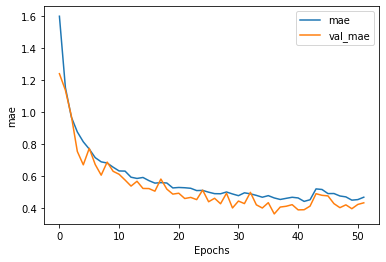

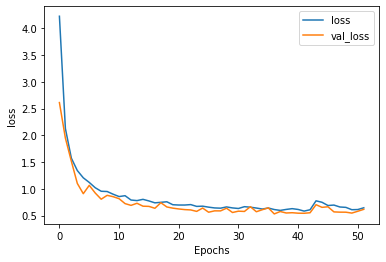

In [26]:
es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)
history = model.fit(X_train, y_train, epochs=150, batch_size = 16, validation_split=0.3, 
                    callbacks = [es], # Call checkpoint variable if neccessary
                    verbose=2)

plot_graphs(history, "mae")
plot_graphs(history, "loss")

## 3.2. Result Interpretation and Evaluation

Here we evaluate on `y_test`, which we made sure earlier comes from a similar distribution within the training set itself. 

Resulted on a pretty confident `mae` and `mse`, which I would say a good result considering the number of classes we have.

In [27]:
scores = model.evaluate(
    X_test, y_test, batch_size=1, verbose=1, sample_weight=None, steps=None,
    callbacks=None, max_queue_size=10, workers=4, use_multiprocessing=False,
    return_dict=False
)
print("------------------ EVALUATION FINISHED! ------------------".center(115))
for i in range(len(scores)):
    print("%s: %.2f%%" % (model.metrics_names[i], scores[i]*100))

3360/3360 [==============================] - 4s 1ms/step - loss: 0.6369 - mae: 0.4412
                             ------------------ EVALUATION FINISHED! ------------------                            
loss: 63.69%
mae: 44.12%


# 3.3. Prepare the Plotting Set

Due to the multi-dimensional nature of our results and test set, we need to reshape the predictions by using `numpy`'s `flatten()` attribute, which flattens the array column-wise if we specify the argument `order='F'` to flatten in Fortran-style order.

Keep in mind this will indeed aggregate the metrics like on the `classification_report()` below.

In [28]:
y_pred = model.predict(X_test)
y_pred_flattened = y_pred.flatten(order='F')
y_test_flattened = y_test.flatten(order='F')
y_classified = [round(float(x)) for x in y_pred_flattened]

print("First ten examples of the test set:")
print("Truth labels:", y_test_flattened[:10])
print("Predicted labels:",y_classified[:10])
print("Overall performance on all columns:\n", classification_report(y_test_flattened, y_classified))

First ten examples of the test set:
Truth labels: [2. 1. 2. 1. 4. 3. 4. 3. 3. 7.]
Predicted labels: [1, 1, 2, 1, 5, 4, 4, 3, 4, 1]
Overall performance on all columns:
               precision    recall  f1-score   support

         1.0       0.92      0.92      0.92      3691
         2.0       0.79      0.63      0.70      3921
         3.0       0.62      0.73      0.67      3952
         4.0       0.71      0.71      0.71      4161
         5.0       0.66      0.80      0.72      3786
         6.0       0.77      0.76      0.76      3748
         7.0       0.91      0.74      0.81      3621

    accuracy                           0.75     26880
   macro avg       0.77      0.75      0.76     26880
weighted avg       0.76      0.75      0.75     26880



In [153]:
# Wrapper function(s) from earlier notebook
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import roc_curve, auc,roc_auc_score
import seaborn as sns
import matplotlib.pyplot as plt

avgroc=dict()

def plot_multiclass_roc_avg(fpr,tpr,n_classes,figsize=(17, 6)):
  roc_auc = dict()
  target_names = [1,2,3,4,5,6,7]
  for i in range(n_classes):
      roc_auc[i] = auc(fpr[i], tpr[i])
  fig, ax = plt.subplots(figsize=figsize)
  ax.plot([0, 1], [0, 1], 'k--')
  ax.set_xlim([0.0, 1.0])
  ax.set_ylim([0.0, 1.05])
  ax.set_xlabel('False Positive Rate')
  ax.set_ylabel('True Positive Rate')
  ax.set_title('Receiver operating characteristic')
    
  for i in range(len(target_names)):
    ax.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f) for %s' % (roc_auc[i], target_names[i]))
  
  ax.legend(loc="best")
  ax.grid(alpha=.4)
  sns.despine()
  plt.show()


def plot_multiclass_roc(clf, X_test, y_test, n_classes, figsize=(17, 6)):
  """
  Modified function behavior, now predicts column-wise
  """
  y_score = clf.predict_proba(X_test)
  target_names = np.unique(y_test)
  # structures
  fpr = dict()
  tpr = dict()
  roc_auc = dict()

  # calculate dummies once
  y_test_dummies = pd.get_dummies(y_test, drop_first=False).values
  print(y_test_dummies.shape, y_score.shape)
  for i in range(n_classes):
      fpr[i], tpr[i], _ = roc_curve(y_test_dummies[:, i], y_score[:, i])
      roc_auc[i] = auc(fpr[i], tpr[i])
      
# roc for each class
  fig, ax = plt.subplots(figsize=figsize)
  ax.plot([0, 1], [0, 1], 'k--')
  ax.set_xlim([0.0, 1.0])
  ax.set_ylim([0.0, 1.05])
  ax.set_xlabel('False Positive Rate')
  ax.set_ylabel('True Positive Rate')
  ax.set_title('Receiver operating characteristic')
    
  for i in range(len(target_names)):
    ax.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f) for %s' % (roc_auc[i], target_names[i]))
  
  ax.legend(loc="best")
  ax.grid(alpha=.4)
  sns.despine()
  plt.show()

  return fpr,tpr

def plot_multiclass_roc_LSTM(X_test, y_test, n_classes, figsize=(17, 6), model=model):
  """
  Custom-made function to plot ROC curve.
  Sorry I can't run because I don't have the excel file used for this particular notebook.
  """
  y_score = to_categorical(y_test)
  target_names = ["obstructive vs supportive",
                  "complicated vs easy",
                  "inefficient vs efficient",
                  " confusing vs clear",
                  "boring vs exciting",
                  "not interesting vs interesting",
                  "conventional vs inventive",
                  "usual vs leading edge"]
  # structures
  fpr = dict()
  tpr = dict()
  roc_auc = dict()
 
  # One-liner transformation of our existing result 
  y_test_dummies = np.pad(pd.get_dummies(y_classified, drop_first=False).values, 
                          ((0,0), 
                           (min(labels.flatten()),0)))
  print(y_test_dummies.shape, y_score.shape) # Quick debug purposes after one-hot encoding
                                             # to ensure matrix dimension is right
  for i in range(1, n_classes):
      fpr[i], tpr[i], _ = roc_curve(y_test_dummies[:, i], y_score[:, i])
      roc_auc[i] = auc(fpr[i], tpr[i])
  
# roc for each class
  fig, ax = plt.subplots(figsize=figsize)
  ax.plot([0, 1], [0, 1], 'k--')
  ax.set_xlim([0.0, 1.0])
  ax.set_ylim([0.0, 1.05])
  ax.set_xlabel('False Positive Rate')
  ax.set_ylabel('True Positive Rate')
  ax.set_title('Column-wise Receiver Operating Characteristic Plot')
    
  for i in range(1, len(target_names)):
    ax.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f) for %s' % (roc_auc[i], target_names[i]))
  
  ax.legend(loc="best")
  ax.grid(alpha=.4)
  sns.despine()
  plt.show()


# plot_multiclass_roc_LSTM(X_test, y_classified, 8, figsize=(17, 6))

ROC AUC score: 0.8555768562495973


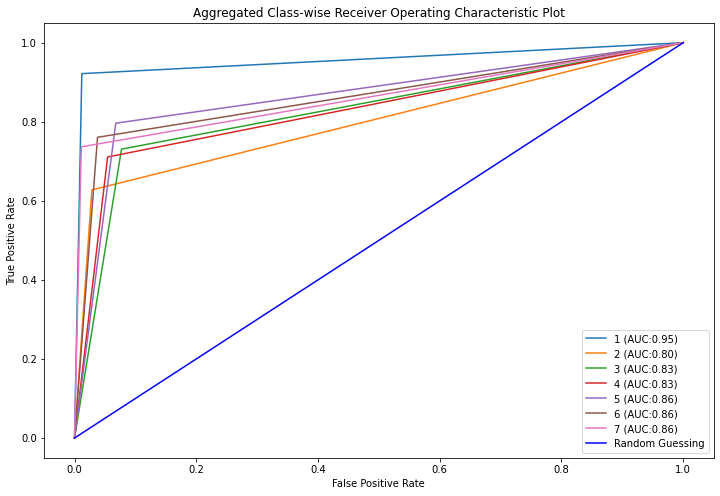

In [154]:
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import roc_curve, auc, roc_auc_score


def score_auc(y_test, y_pred, average="weighted"):
    lb = LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)
    return roc_auc_score(y_test, y_pred, average=average)

fig, c_ax = plt.subplots(1,1, figsize = (12, 8))
def multiclass_roc_auc_score(y_test, y_pred, average="weighted"):
    lb = LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)

    for (idx, c_label) in enumerate(set(labels.flatten())):
        fpr, tpr, thresholds = roc_curve(y_test[:,idx].astype(int), y_pred[:,idx])
        c_ax.plot(fpr, tpr, label = '%s (AUC:%0.2f)'  % (c_label, auc(fpr, tpr)))
    c_ax.plot(fpr, fpr, 'b-', label = 'Random Guessing')
    return roc_auc_score(y_test, y_pred, average=average)

print('ROC AUC score:', multiclass_roc_auc_score(y_test_flattened, y_classified))
c_ax.legend()
c_ax.set_xlabel('False Positive Rate')
c_ax.set_ylabel('True Positive Rate')
c_ax.set_title('Aggregated Class-wise Receiver Operating Characteristic Plot')
plt.savefig("auc.png")
plt.show()

In [31]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
from sklearn.metrics import mean_squared_error
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]

We can also print classification report from each column.

In [32]:
from sklearn.metrics import classification_report, f1_score
y_pred = model.predict(X_test)
for i in range(8):
    print("Column", df.columns[1:][i])
    estimates = [round(float(x)) for x in y_pred[:,i]]
    estimates = transform_results(estimates)
    print(np.unique(estimates))
    acc.append(accuracy_score(y_test[:,i], estimates))
    pre.append(precision_score(y_test[:,i], estimates,average='weighted'))
    recal.append(recall_score(y_test[:,i], estimates,average='weighted'))
    f1.append(f1_score(y_test[:,i], estimates,average='weighted'))
    rms.append(np.sqrt(mean_squared_error(y_test[:,i], estimates)))
    aucscore.append(score_auc(y_test[:,i], estimates))
    print(classification_report(y_test[:,i], estimates), "\n------")

Column obstructive<==>supportive
[1 2 3 4 5 6 7]
              precision    recall  f1-score   support

         1.0       0.92      0.91      0.92       462
         2.0       0.78      0.52      0.62       482
         3.0       0.56      0.70      0.62       510
         4.0       0.60      0.62      0.61       517
         5.0       0.50      0.67      0.57       467
         6.0       0.70      0.61      0.65       470
         7.0       0.80      0.65      0.72       452

    accuracy                           0.67      3360
   macro avg       0.69      0.67      0.67      3360
weighted avg       0.69      0.67      0.67      3360
 
------
Column complicated<==>easy
[1 2 3 4 5 6 7]
              precision    recall  f1-score   support

         1.0       0.92      0.91      0.92       463
         2.0       0.77      0.61      0.68       485
         3.0       0.59      0.70      0.64       501
         4.0       0.63      0.64      0.64       515
         5.0       0.53      0.7

In [33]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE -score :{}".format(np.mean(rms)))
print("average AUC -score :{}".format(np.mean(aucscore)))
metric_df['Neural network classifier'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.7530505952380953
average Precision :0.7674033571142858
average Recall :0.7530505952380953
average F1 -score :0.7550430446829542
average RMSE -score :0.7819380424877275
average AUC -score :0.8556236981839658


## 3.4. Exporting the Model

We can export the model to `HDF5` format designed to store large amounts of information. More info:
* [Wikipedia](https://en.wikipedia.org/wiki/Hierarchical_Data_Format)
* [TensorFlow Documentation](https://www.tensorflow.org/tutorials/keras/save_and_load#hdf5_format)

In [34]:
model.save('UX_Regression.h5')

In [35]:

ffpo=dict()
ttpo=dict()
temp=[]


## 3.5. XGB Method
For comparison, we try implementing XGB.

For column: obstructive<==>supportive
[02:41:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       462
         2.0       0.83      0.89      0.86       482
         3.0       0.76      0.72      0.74       510
         4.0       0.67      0.67      0.67       517
         5.0       0.64      0.66      0.65       467
         6.0       0.74      0.70      0.72       470
         7.0       0.81      0.81      0.81       452

    accuracy                           0.77      3360
   macro avg       0.77      0.77      0.77      3360
weighted avg       0.77      0.77      0.77      3360

Confusion Matrix: 
 [[442  20   0   0   0   0   0]
 [ 

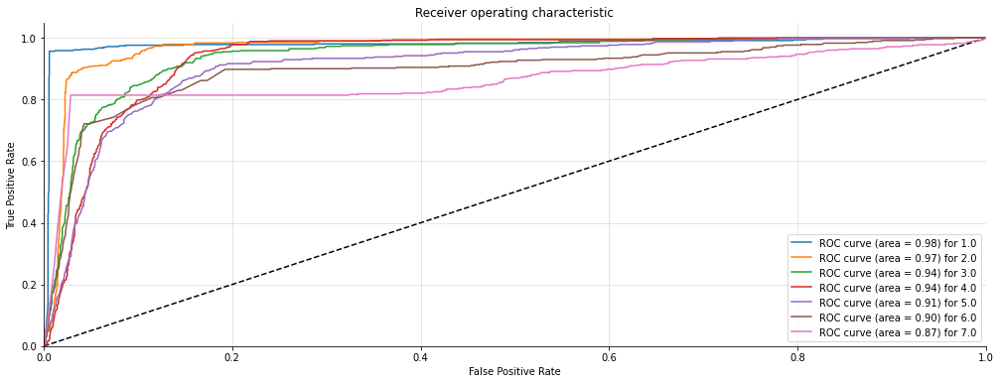

For column: complicated<==>easy
[02:41:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

         1.0       0.96      0.95      0.96       463
         2.0       0.83      0.88      0.86       485
         3.0       0.73      0.73      0.73       501
         4.0       0.70      0.66      0.68       515
         5.0       0.71      0.75      0.73       460
         6.0       0.83      0.79      0.81       484
         7.0       0.90      0.90      0.90       452

    accuracy                           0.81      3360
   macro avg       0.81      0.81      0.81      3360
weighted avg       0.81      0.81      0.81      3360

Confusion Matrix: 
 [[442  20   0   0   0   1   0]
 [  0 427

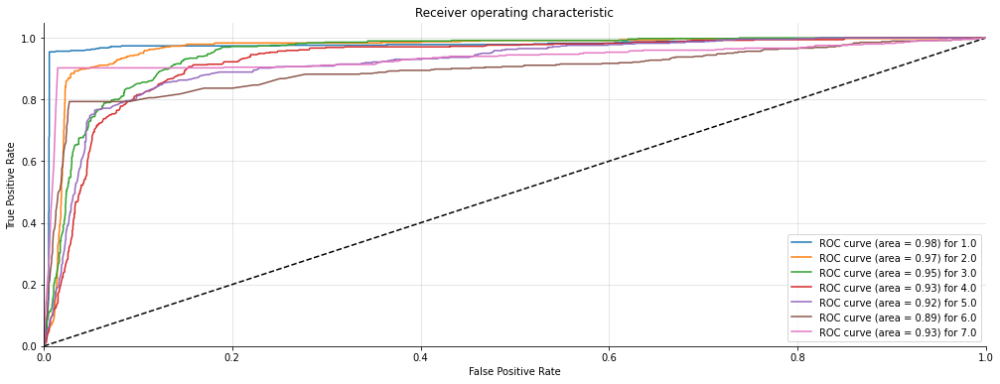

For column: inefficient<==>efficient
[02:41:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       462
         2.0       0.85      0.88      0.86       482
         3.0       0.75      0.73      0.74       506
         4.0       0.69      0.66      0.67       526
         5.0       0.64      0.69      0.66       458
         6.0       0.72      0.68      0.70       475
         7.0       0.82      0.83      0.83       451

    accuracy                           0.77      3360
   macro avg       0.78      0.78      0.77      3360
weighted avg       0.77      0.77      0.77      3360

Confusion Matrix: 
 [[442  19   0   0   0   1   0]
 [  

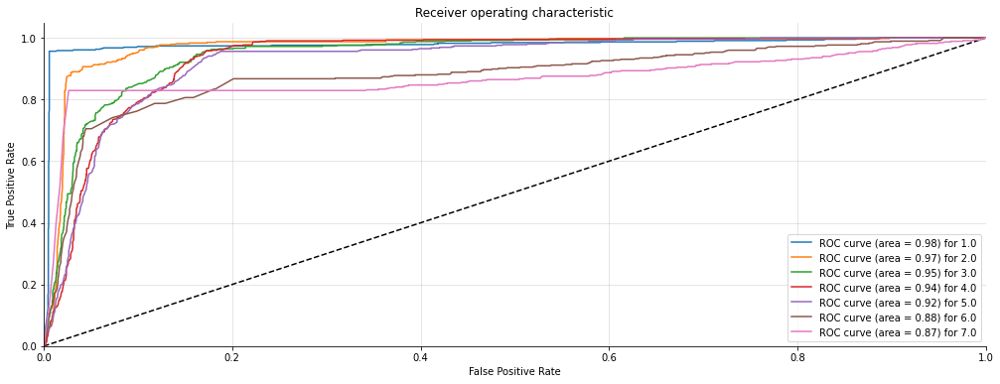

For column:  confusing<==>clear
[02:41:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       461
         2.0       0.84      0.88      0.86       488
         3.0       0.76      0.74      0.75       506
         4.0       0.68      0.68      0.68       516
         5.0       0.65      0.69      0.67       456
         6.0       0.74      0.71      0.72       471
         7.0       0.81      0.79      0.80       462

    accuracy                           0.78      3360
   macro avg       0.78      0.78      0.78      3360
weighted avg       0.78      0.78      0.78      3360

Confusion Matrix: 
 [[442  19   0   0   0   0   0]
 [  0 427

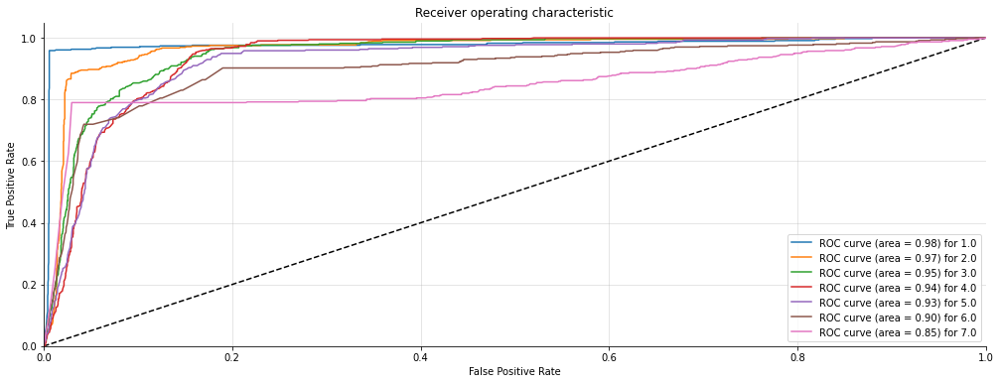

For column: boring<==>exciting
[02:41:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

         1.0       0.96      0.95      0.96       463
         2.0       0.86      0.88      0.87       491
         3.0       0.84      0.80      0.82       487
         4.0       0.86      0.87      0.86       518
         5.0       0.92      0.92      0.92       487
         6.0       0.96      0.96      0.96       462
         7.0       0.99      0.99      0.99       452

    accuracy                           0.91      3360
   macro avg       0.91      0.91      0.91      3360
weighted avg       0.91      0.91      0.91      3360

Confusion Matrix: 
 [[442  18   1   0   1   1   0]
 [  5 434 

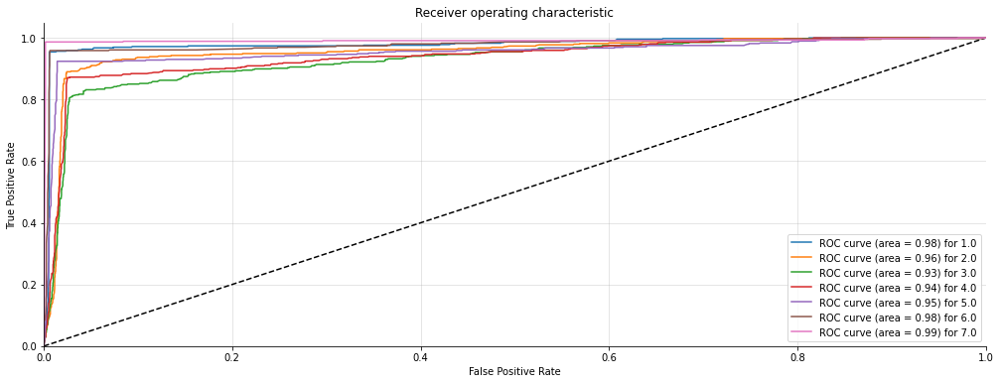

For column: not interesting<==>interesting
[02:41:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       461
         2.0       0.86      0.86      0.86       495
         3.0       0.81      0.79      0.80       490
         4.0       0.83      0.83      0.83       519
         5.0       0.89      0.91      0.90       481
         6.0       0.96      0.96      0.96       465
         7.0       0.99      0.99      0.99       449

    accuracy                           0.90      3360
   macro avg       0.90      0.90      0.90      3360
weighted avg       0.90      0.90      0.90      3360

Confusion Matrix: 
 [[442  18   1   0   0   0   0

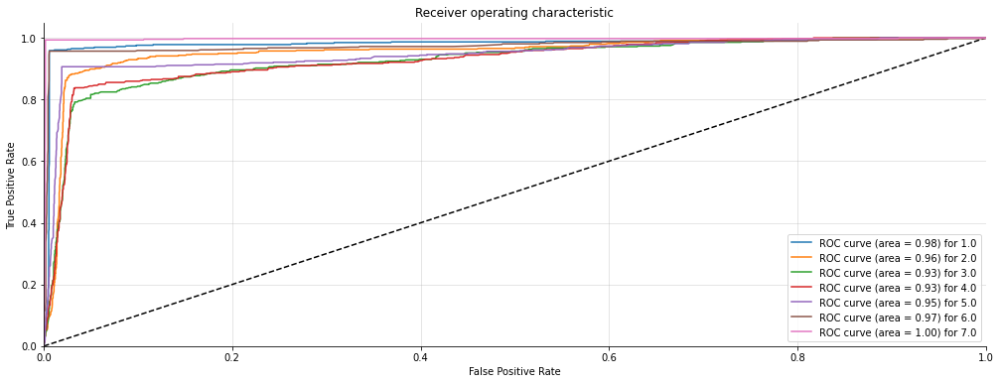

For column: conventional<==>inventive
[02:41:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

         1.0       0.99      0.99      0.99       460
         2.0       0.96      0.95      0.96       502
         3.0       0.94      0.95      0.94       474
         4.0       0.96      0.95      0.95       527
         5.0       0.97      0.98      0.97       486
         6.0       0.98      0.99      0.99       459
         7.0       1.00      1.00      1.00       452

    accuracy                           0.97      3360
   macro avg       0.97      0.97      0.97      3360
weighted avg       0.97      0.97      0.97      3360

Confusion Matrix: 
 [[454   6   0   0   0   0   0]
 [ 

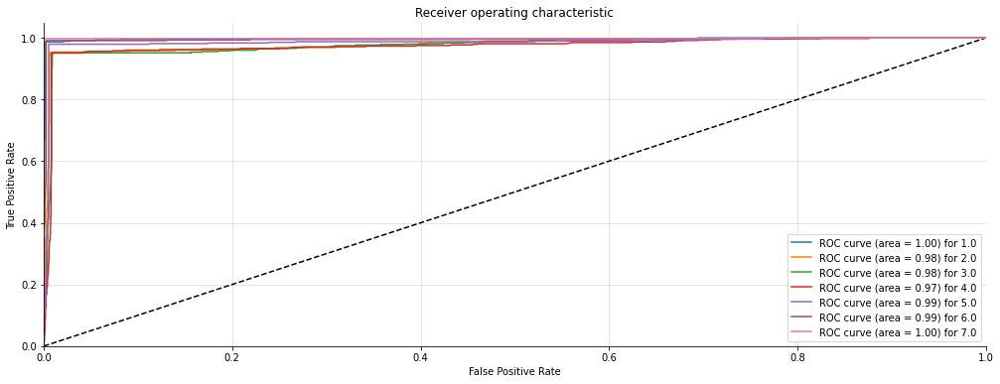

For column: usual<==>leading edge
[02:41:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

         1.0       1.00      1.00      1.00       459
         2.0       1.00      1.00      1.00       496
         3.0       1.00      1.00      1.00       478
         4.0       1.00      1.00      1.00       523
         5.0       1.00      1.00      1.00       491
         6.0       1.00      1.00      1.00       462
         7.0       1.00      1.00      1.00       451

    accuracy                           1.00      3360
   macro avg       1.00      1.00      1.00      3360
weighted avg       1.00      1.00      1.00      3360

Confusion Matrix: 
 [[459   0   0   0   0   0   0]
 [  0 4

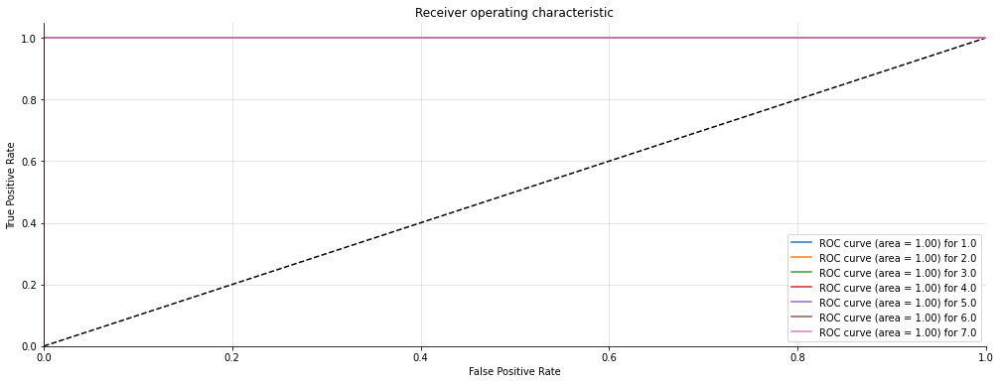

In [155]:
from xgboost import XGBClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
from sklearn.metrics import mean_squared_error
from operator import add




acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]
fpo=dict()
tpo=dict()
ffpo=[]
ttpo=[]
def XGBmodel(X_train, X_test, y_train, y_test, n_classes,ffpo,ttpo, figsize=(8, 6)):
    xgb_classifier = XGBClassifier()
    xgb_classifier.fit(X_train, y_train)

    # predictions over test set
    predictions = [round(float(x)) for x in xgb_classifier.predict(X_test)]
    print((classification_report(y_test, predictions)))


    # calculating Accuracy Score, Precision Score, Recall Score and F1 Score
    print('Confusion Matrix: \n' ,confusion_matrix(y_test, predictions))
    acc.append(accuracy_score(y_test, predictions))
    print(f'Accuracy Score : {accuracy_score(y_test, predictions)}')
    pre.append(precision_score(y_test,predictions,average='weighted'))
    print('Precision Score : ' + str(precision_score(y_test,predictions,average='weighted')))
    recal.append(recall_score(y_test,predictions,average='weighted'))
    print('Recall Score : ' + str(recall_score(y_test,predictions,average='weighted')))
    f1.append(f1_score(y_test,predictions,average='weighted'))
    print('F1 Score : ' + str(f1_score(y_test,predictions,average='weighted')))
    rms.append(np.sqrt(mean_squared_error(y_test,predictions)))
    aucscore.append(score_auc(y_test,predictions))
    fpo,tpo=plot_multiclass_roc(xgb_classifier, X_test, y_test, n_classes)
    ffpo.append(fpo)
    ttpo.append(tpo)
    
for i in range(8):
  print('For column:', df.columns[1:][i])
  n_classes = len(np.unique(df[df.columns[1:][i]]))
  XGBmodel(X_train, X_test, y_train[:,i], y_test[:,i], n_classes,ffpo,ttpo, figsize=(8, 6))


In [156]:
fsum0=list(np.array(dadd(dadd(dadd(ffpo[0][0],ffpo[1][0]),dadd(ffpo[2][0],ffpo[3][0])),dadd(dadd(ffpo[4][0],ffpo[5][0]),dadd(ffpo[6][0],ffpo[7][0]))))/8)
fsum1=list(np.array(dadd(dadd(dadd(ffpo[0][1],ffpo[1][1]),dadd(ffpo[2][1],ffpo[3][1])),dadd(dadd(ffpo[4][1],ffpo[5][1]),dadd(ffpo[6][1],ffpo[7][1]))))/8)
fsum2=list(np.array(dadd(dadd(dadd(ffpo[0][2],ffpo[1][2]),dadd(ffpo[2][2],ffpo[3][2])),dadd(dadd(ffpo[4][2],ffpo[5][2]),dadd(ffpo[6][2],ffpo[7][2]))))/8)
fsum3=list(np.array(dadd(dadd(dadd(ffpo[0][3],ffpo[1][3]),dadd(ffpo[2][3],ffpo[3][3])),dadd(dadd(ffpo[4][3],ffpo[5][3]),dadd(ffpo[6][3],ffpo[7][3]))))/8)
fsum4=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][4]),dadd(ffpo[2][4],ffpo[3][4])),dadd(dadd(ffpo[4][4],ffpo[5][4]),dadd(ffpo[6][4],ffpo[7][4]))))/8)
fsum5=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][5]),dadd(ffpo[2][5],ffpo[3][5])),dadd(dadd(ffpo[4][5],ffpo[5][5]),dadd(ffpo[6][5],ffpo[7][5]))))/8)
fsum6=list(np.array(dadd(dadd(dadd(ffpo[0][6],ffpo[1][6]),dadd(ffpo[2][6],ffpo[3][6])),dadd(dadd(ffpo[4][6],ffpo[5][6]),dadd(ffpo[6][6],ffpo[7][6]))))/8)

fpr=dict()

fpr[0]=fsum0
fpr[1]=fsum1
fpr[2]=fsum2
fpr[3]=fsum3
fpr[4]=fsum4
fpr[5]=fsum5
fpr[6]=fsum6


tsum0=list(np.array(dadd(dadd(dadd(ttpo[0][0],ttpo[1][0]),dadd(ttpo[2][0],ttpo[3][0])),dadd(dadd(ttpo[4][0],ttpo[5][0]),dadd(ttpo[6][0],ttpo[7][0]))))/8)
tsum1=list(np.array(dadd(dadd(dadd(ttpo[0][1],ttpo[1][1]),dadd(ttpo[2][1],ttpo[3][1])),dadd(dadd(ttpo[4][1],ttpo[5][1]),dadd(ttpo[6][1],ttpo[7][1]))))/8)
tsum2=list(np.array(dadd(dadd(dadd(ttpo[0][2],ttpo[1][2]),dadd(ttpo[2][2],ttpo[3][2])),dadd(dadd(ttpo[4][2],ttpo[5][2]),dadd(ttpo[6][2],ttpo[7][2]))))/8)
tsum3=list(np.array(dadd(dadd(dadd(ttpo[0][3],ttpo[1][3]),dadd(ttpo[2][3],ttpo[3][3])),dadd(dadd(ttpo[4][3],ttpo[5][3]),dadd(ttpo[6][3],ttpo[7][3]))))/8)
tsum4=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][4]),dadd(ttpo[2][4],ttpo[3][4])),dadd(dadd(ttpo[4][4],ttpo[5][4]),dadd(ttpo[6][4],ttpo[7][4]))))/8)
tsum5=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][5]),dadd(ttpo[2][5],ttpo[3][5])),dadd(dadd(ttpo[4][5],ttpo[5][5]),dadd(ttpo[6][5],ttpo[7][5]))))/8)
tsum6=list(np.array(dadd(dadd(dadd(ttpo[0][6],ttpo[1][6]),dadd(ttpo[2][6],ttpo[3][6])),dadd(dadd(ttpo[4][6],ttpo[5][6]),dadd(ttpo[6][6],ttpo[7][6]))))/8)

tpr=dict()

tpr[0]=np.array(tsum0)
tpr[1]=np.array(tsum1)
tpr[2]=np.array(tsum2)
tpr[3]=np.array(tsum3)
tpr[4]=np.array(tsum4)
tpr[5]=np.array(tsum5)
tpr[6]=np.array(tsum6)

plot_multiclass_roc_avg(fpr,tpr,7)

ValueError: x is neither increasing nor decreasing : [0.5   0.25  0.375].

In [ ]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE -score :{}".format(np.mean(rms)))
print("average AUC -score :{}".format(np.mean(aucscore)))
metric_df['XGB'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

## 3.6. SVM Method

For column: obstructive<==>supportive
              precision    recall  f1-score   support

         1.0       0.47      0.93      0.62       462
         2.0       0.65      0.51      0.57       482
         3.0       0.63      0.49      0.55       510
         4.0       0.58      0.42      0.48       517
         5.0       0.55      0.42      0.48       467
         6.0       0.60      0.61      0.61       470
         7.0       0.80      0.81      0.81       452

    accuracy                           0.59      3360
   macro avg       0.61      0.60      0.59      3360
weighted avg       0.61      0.59      0.58      3360

Confusion Matrix: 
 [[428  11   2   0   0  17   4]
 [144 244  55  13   4  19   3]
 [101  46 250  81  17  14   1]
 [ 91  32  49 215 113  17   0]
 [ 89  13  14  42 197 112   0]
 [ 44  16  10   8  19 288  85]
 [ 21  15  18  11   9  10 368]]
Accuracy Score : 0.5922619047619048
Precision Score : 0.6098157015736292
Recall Score : 0.5922619047619048
F1 Score : 0.5847824

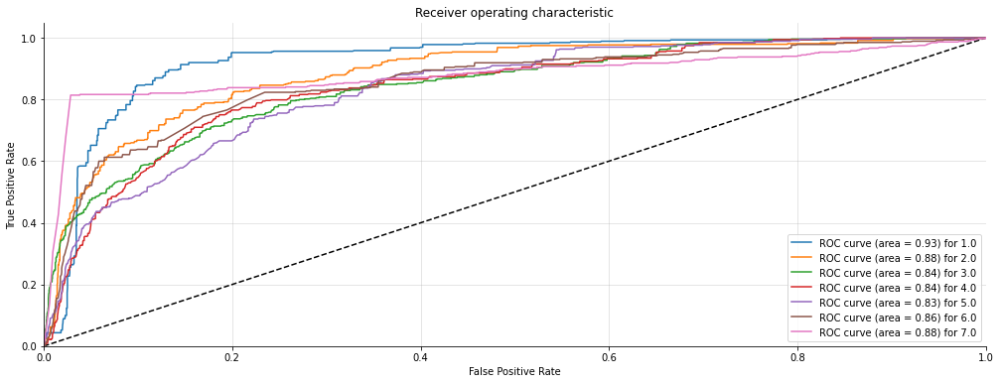

(3360, 7) (3360, 7)


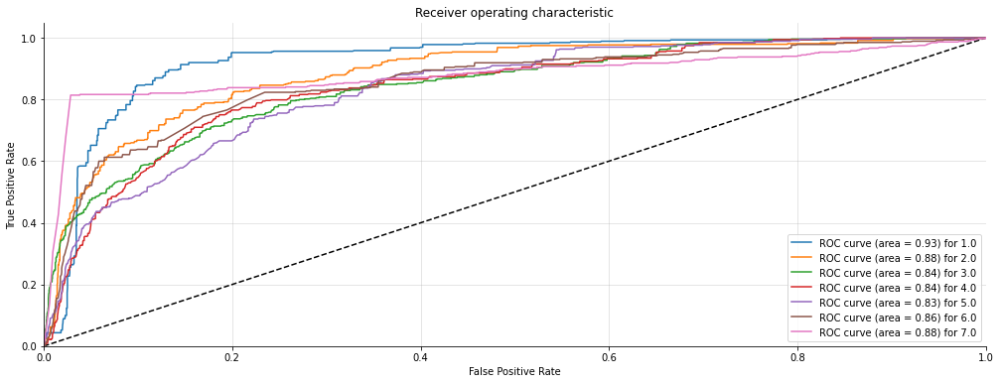

For column: complicated<==>easy
              precision    recall  f1-score   support

         1.0       0.47      0.92      0.62       463
         2.0       0.66      0.51      0.57       485
         3.0       0.62      0.49      0.54       501
         4.0       0.62      0.42      0.50       515
         5.0       0.61      0.45      0.51       460
         6.0       0.65      0.71      0.68       484
         7.0       0.89      0.90      0.90       452

    accuracy                           0.62      3360
   macro avg       0.64      0.63      0.62      3360
weighted avg       0.64      0.62      0.61      3360

Confusion Matrix: 
 [[428  11   2   0   0  18   4]
 [143 245  56   9   4  25   3]
 [ 95  46 243  82  17  17   1]
 [ 91  24  55 216 104  25   0]
 [ 90  22  17  29 205  97   0]
 [ 52  14  15  11   4 344  44]
 [ 16   9   6   4   4   4 409]]
Accuracy Score : 0.6220238095238095
Precision Score : 0.6419416138755543
Recall Score : 0.6220238095238095
F1 Score : 0.6142558957168

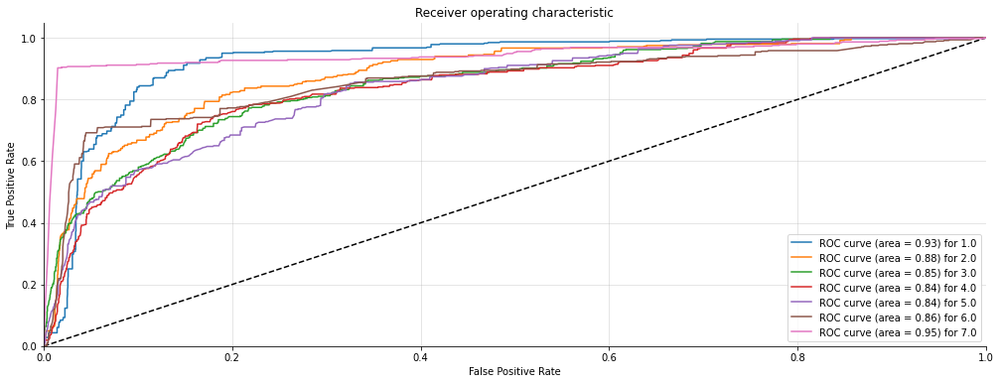

(3360, 7) (3360, 7)


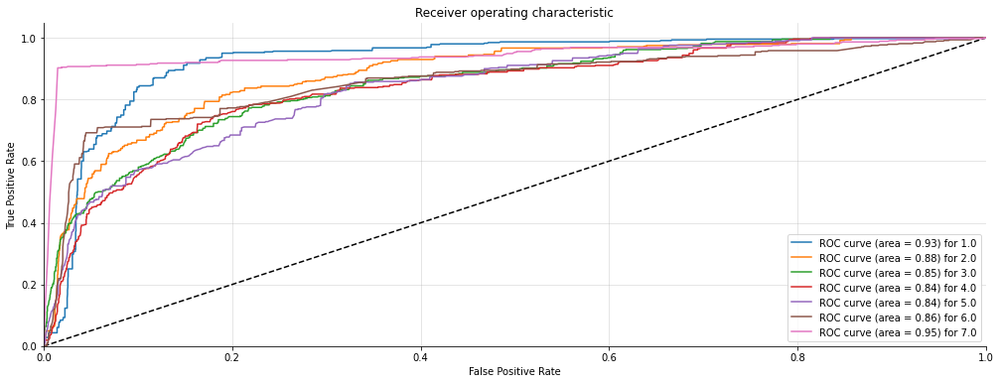

For column: inefficient<==>efficient
              precision    recall  f1-score   support

         1.0       0.46      0.93      0.61       462
         2.0       0.64      0.50      0.57       482
         3.0       0.63      0.49      0.55       506
         4.0       0.58      0.38      0.46       526
         5.0       0.53      0.45      0.49       458
         6.0       0.59      0.56      0.58       475
         7.0       0.81      0.83      0.82       451

    accuracy                           0.59      3360
   macro avg       0.61      0.59      0.58      3360
weighted avg       0.61      0.59      0.58      3360

Confusion Matrix: 
 [[428  11   2   0   0  17   4]
 [147 243  52  13   4  20   3]
 [ 99  41 248  80  21  16   1]
 [ 86  37  56 201 130  16   0]
 [ 90  15   5  35 206 107   0]
 [ 67  14  17  10  20 268  79]
 [ 21  16  13   9   9   9 374]]
Accuracy Score : 0.5857142857142857
Precision Score : 0.605185669970931
Recall Score : 0.5857142857142857
F1 Score : 0.578292536

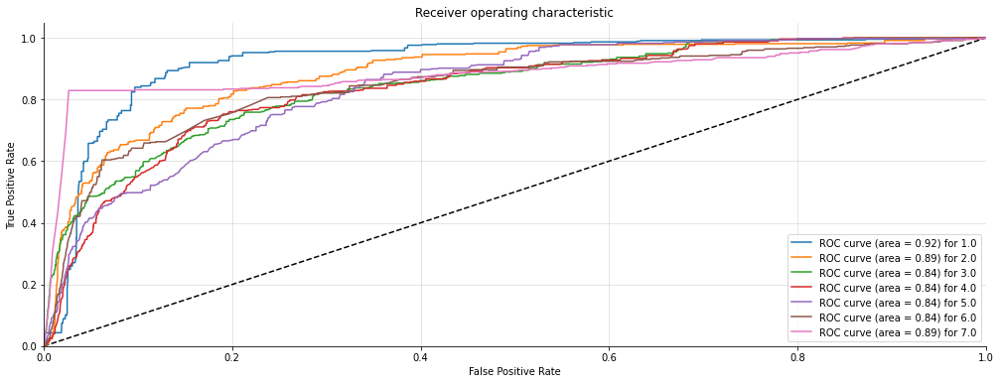

(3360, 7) (3360, 7)


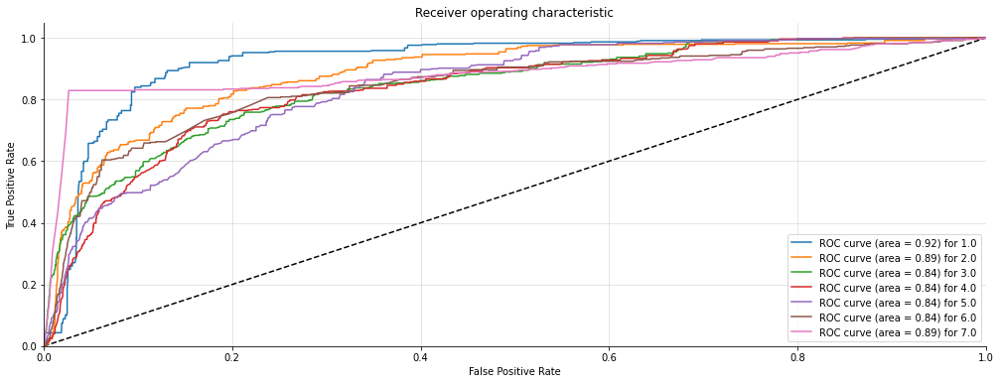

For column:  confusing<==>clear
              precision    recall  f1-score   support

         1.0       0.46      0.93      0.62       461
         2.0       0.66      0.50      0.57       488
         3.0       0.62      0.49      0.55       506
         4.0       0.58      0.40      0.47       516
         5.0       0.54      0.43      0.48       456
         6.0       0.60      0.62      0.61       471
         7.0       0.80      0.79      0.80       462

    accuracy                           0.59      3360
   macro avg       0.61      0.60      0.59      3360
weighted avg       0.61      0.59      0.58      3360

Confusion Matrix: 
 [[427  11   2   0   0  17   4]
 [148 244  54  13   7  19   3]
 [ 98  42 250  81  20  14   1]
 [ 92  27  51 206 119  21   0]
 [ 82  12  17  34 197 114   0]
 [ 44  14  13   6  14 294  86]
 [ 28  19  18  14   9   7 367]]
Accuracy Score : 0.5907738095238095
Precision Score : 0.6094246457940281
Recall Score : 0.5907738095238095
F1 Score : 0.5835121166351

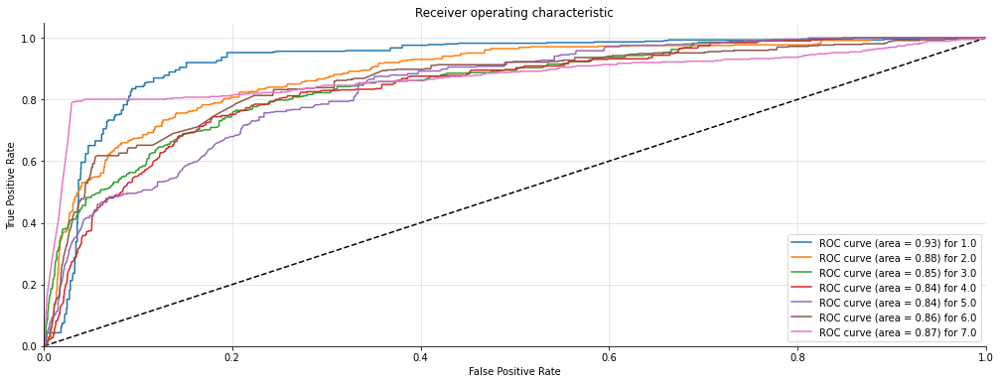

(3360, 7) (3360, 7)


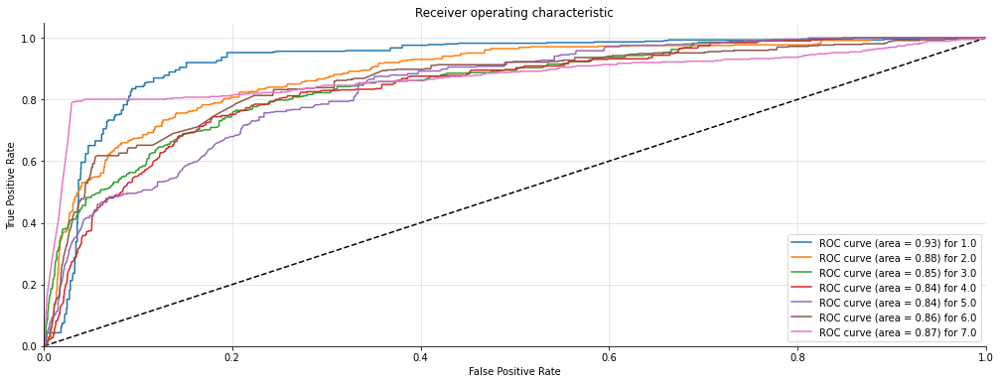

For column: boring<==>exciting
              precision    recall  f1-score   support

         1.0       0.47      0.92      0.62       463
         2.0       0.67      0.51      0.58       491
         3.0       0.73      0.52      0.61       487
         4.0       0.72      0.56      0.63       518
         5.0       0.81      0.59      0.69       487
         6.0       0.76      0.87      0.81       462
         7.0       0.97      0.99      0.98       452

    accuracy                           0.70      3360
   macro avg       0.73      0.71      0.70      3360
weighted avg       0.73      0.70      0.70      3360

Confusion Matrix: 
 [[424  16   2   0   0  17   4]
 [146 248  39  22   9  26   1]
 [ 96  49 255  58  14  14   1]
 [ 93  30  38 288  39  26   4]
 [ 95  19  10  31 289  43   0]
 [ 41   7   4   2   3 400   5]
 [  0   0   1   1   1   3 446]]
Accuracy Score : 0.6994047619047619
Precision Score : 0.7319533901028388
Recall Score : 0.6994047619047619
F1 Score : 0.69719451221916

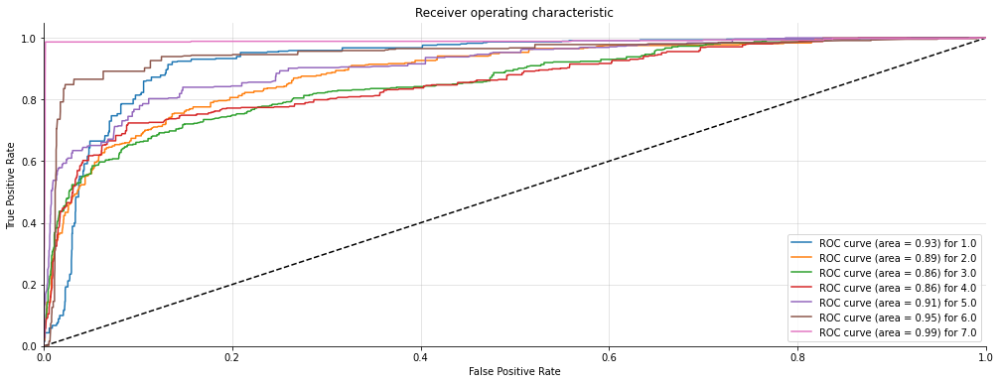

(3360, 7) (3360, 7)


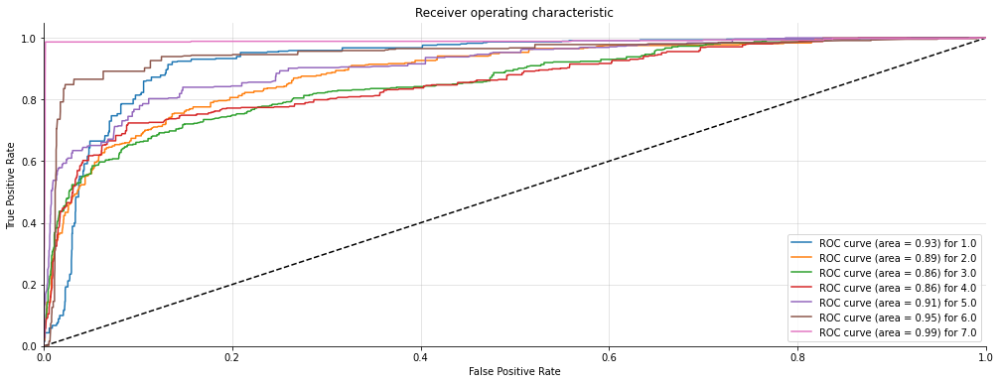

For column: not interesting<==>interesting
              precision    recall  f1-score   support

         1.0       0.46      0.91      0.61       461
         2.0       0.68      0.49      0.57       495
         3.0       0.71      0.53      0.60       490
         4.0       0.70      0.53      0.61       519
         5.0       0.79      0.58      0.67       481
         6.0       0.75      0.86      0.80       465
         7.0       0.97      0.99      0.98       449

    accuracy                           0.69      3360
   macro avg       0.72      0.70      0.69      3360
weighted avg       0.72      0.69      0.69      3360

Confusion Matrix: 
 [[419  16   2   0   0  20   4]
 [148 241  49  21   7  28   1]
 [ 99  42 259  58  16  15   1]
 [ 96  35  42 276  47  22   1]
 [ 99  13  10  35 278  46   0]
 [ 41   6   4   2   6 401   5]
 [  0   0   1   1   0   1 446]]
Accuracy Score : 0.6904761904761905
Precision Score : 0.7223793360866082
Recall Score : 0.6904761904761905
F1 Score : 0.68

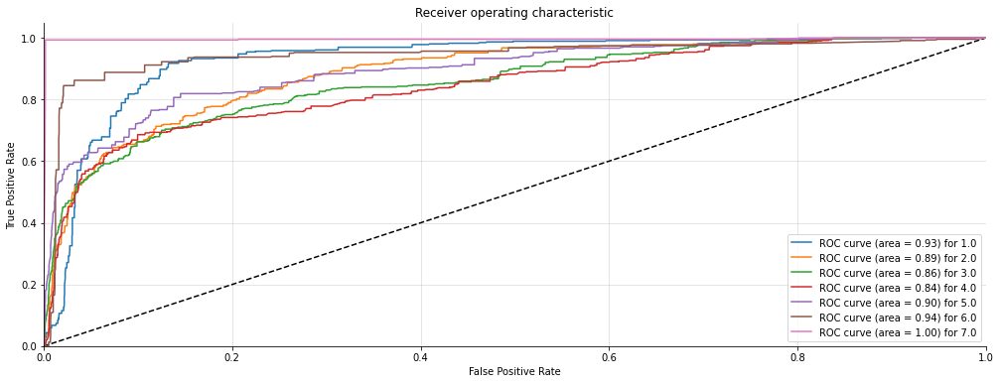

(3360, 7) (3360, 7)


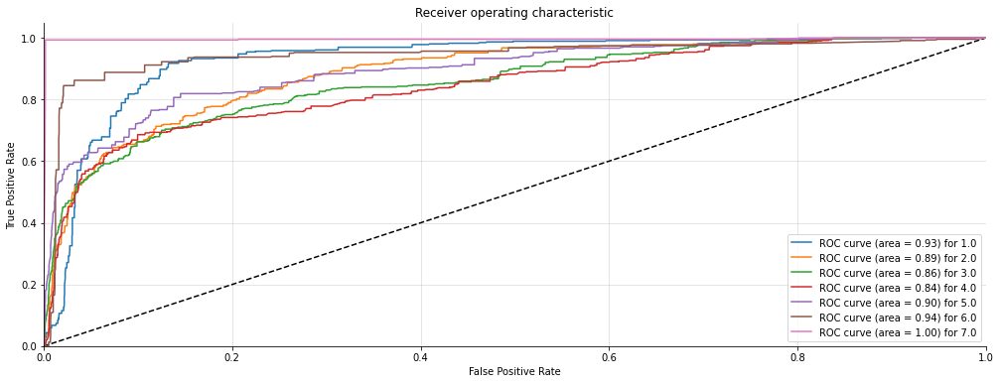

For column: conventional<==>inventive
              precision    recall  f1-score   support

         1.0       0.48      0.94      0.64       460
         2.0       0.75      0.53      0.62       502
         3.0       0.85      0.65      0.74       474
         4.0       0.82      0.62      0.71       527
         5.0       0.87      0.65      0.74       486
         6.0       0.78      0.89      0.84       459
         7.0       0.98      1.00      0.99       452

    accuracy                           0.75      3360
   macro avg       0.79      0.75      0.75      3360
weighted avg       0.79      0.75      0.75      3360

Confusion Matrix: 
 [[432   9   0   0   0  15   4]
 [150 264  27  24  10  26   1]
 [ 87  32 307  22  14  10   2]
 [ 97  26  25 329  23  27   0]
 [ 91  18   1  28 314  34   0]
 [ 42   5   0   0   2 410   0]
 [  0   0   0   0   0   1 451]]
Accuracy Score : 0.7461309523809524
Precision Score : 0.7902328085190885
Recall Score : 0.7461309523809524
F1 Score : 0.7484293

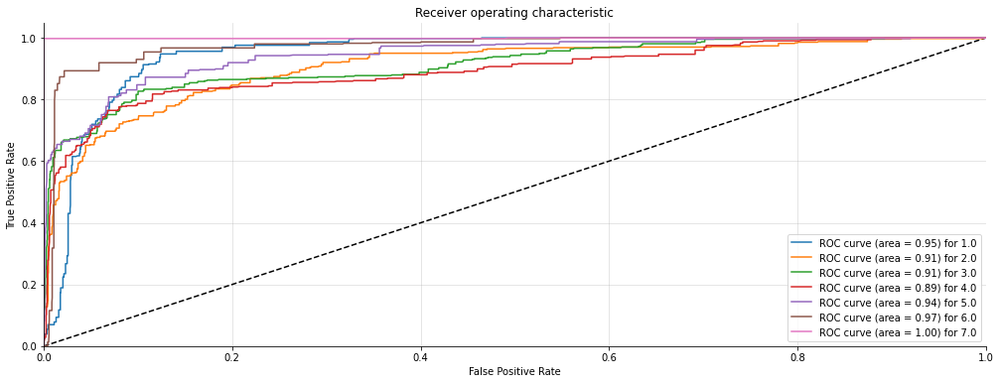

(3360, 7) (3360, 7)


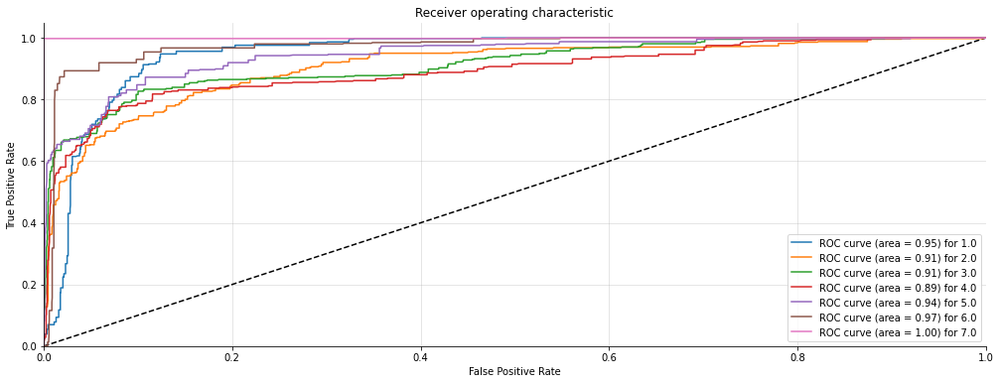

For column: usual<==>leading edge
              precision    recall  f1-score   support

         1.0       0.50      0.94      0.65       459
         2.0       0.77      0.58      0.66       496
         3.0       0.84      0.68      0.75       478
         4.0       0.88      0.66      0.75       523
         5.0       0.91      0.66      0.76       491
         6.0       0.80      0.90      0.85       462
         7.0       0.98      1.00      0.99       451

    accuracy                           0.77      3360
   macro avg       0.81      0.78      0.77      3360
weighted avg       0.81      0.77      0.77      3360

Confusion Matrix: 
 [[433   6   0   0   0  15   5]
 [133 289  28  15   9  22   0]
 [ 85  30 327  11  13  10   2]
 [ 80  34  30 344  10  25   0]
 [ 94  13   5  21 323  35   0]
 [ 40   5   0   0   0 417   0]
 [  0   0   0   0   0   0 451]]
Accuracy Score : 0.7690476190476191
Precision Score : 0.8123255579213217
Recall Score : 0.7690476190476191
F1 Score : 0.77252348334

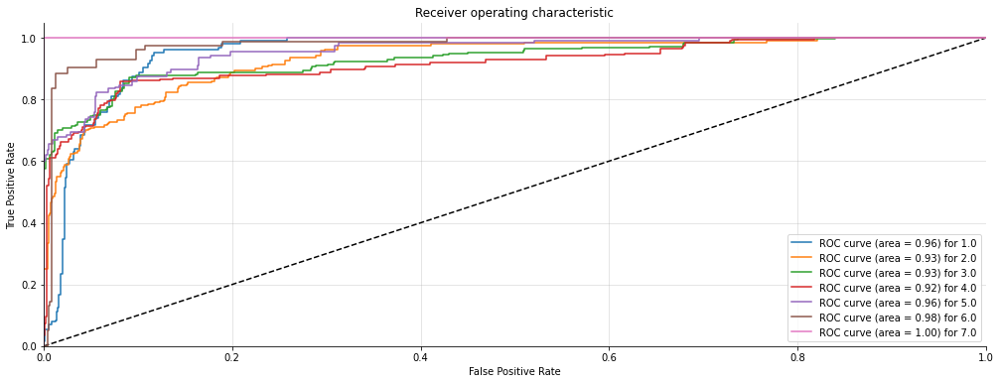

(3360, 7) (3360, 7)


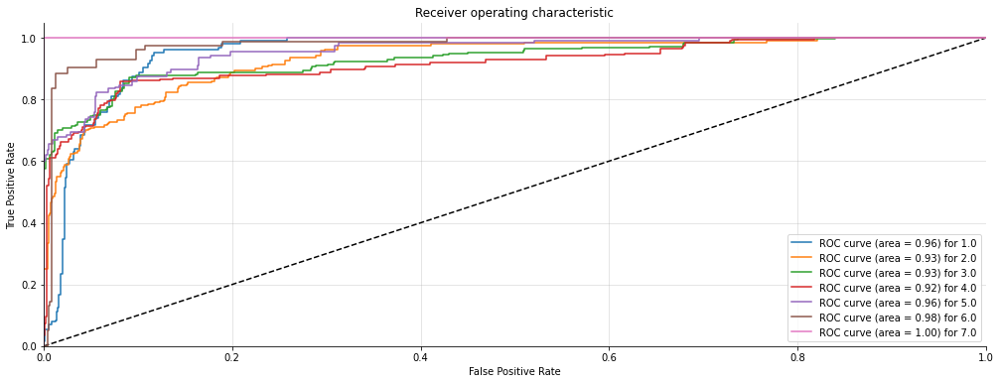

In [40]:
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]
fpo=dict()
tpo=dict()
ffpo=[]
ttpo=[]
def SVMmodel(X_train, X_test, y_train, y_test, n_classes, figsize=(8, 6)):
    svc = SVC( probability=True)
    svc.fit(X_train, y_train)

    # predictions over test set
    predictions=[round(float(x)) for x in svc.predict(X_test)]
    print((classification_report(y_test, predictions)))

    # calculating Accuracy Score, Precision Score, Recall Score and F1 Score
    print('Confusion Matrix: \n' ,confusion_matrix(y_test, predictions))
    acc.append(accuracy_score(y_test, predictions))
    print(f'Accuracy Score : {accuracy_score(y_test, predictions)}')
    pre.append(precision_score(y_test,predictions,average='weighted'))
    print('Precision Score : ' + str(precision_score(y_test,predictions,average='weighted')))
    recal.append(recall_score(y_test,predictions,average='weighted'))
    print('Recall Score : ' + str(recall_score(y_test,predictions,average='weighted')))
    f1.append(f1_score(y_test,predictions,average='weighted'))
    print('F1 Score : ' + str(f1_score(y_test,predictions,average='weighted')))
    rms.append(np.sqrt(mean_squared_error(y_test,predictions)))
    aucscore.append(score_auc(y_test,predictions))
    plot_multiclass_roc(svc, X_test, y_test, n_classes)
    fpo,tpo=plot_multiclass_roc(svc, X_test, y_test, n_classes)
    ffpo.append(fpo)
    ttpo.append(tpo)

for i in range(8):
  print('For column:', df.columns[1:][i])
  n_classes = len(np.unique(df[df.columns[1:][i]]))
  SVMmodel(X_train, X_test, y_train[:,i], y_test[:,i], n_classes, figsize=(8, 6))

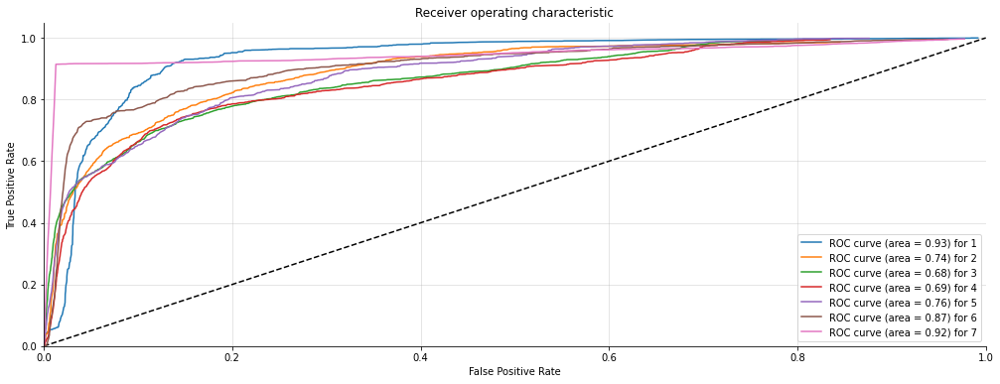

In [41]:
fsum0=list(np.array(dadd(dadd(dadd(ffpo[0][0],ffpo[1][0]),dadd(ffpo[2][0],ffpo[3][0])),dadd(dadd(ffpo[4][0],ffpo[5][0]),dadd(ffpo[6][0],ffpo[7][0]))))/8)
fsum1=list(np.array(dadd(dadd(dadd(ffpo[0][1],ffpo[1][1]),dadd(ffpo[2][1],ffpo[3][1])),dadd(dadd(ffpo[4][1],ffpo[5][1]),dadd(ffpo[6][1],ffpo[7][1]))))/8)
fsum2=list(np.array(dadd(dadd(dadd(ffpo[0][2],ffpo[1][2]),dadd(ffpo[2][2],ffpo[3][2])),dadd(dadd(ffpo[4][2],ffpo[5][2]),dadd(ffpo[6][2],ffpo[7][2]))))/8)
fsum3=list(np.array(dadd(dadd(dadd(ffpo[0][3],ffpo[1][3]),dadd(ffpo[2][3],ffpo[3][3])),dadd(dadd(ffpo[4][3],ffpo[5][3]),dadd(ffpo[6][3],ffpo[7][3]))))/8)
fsum4=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][4]),dadd(ffpo[2][4],ffpo[3][4])),dadd(dadd(ffpo[4][4],ffpo[5][4]),dadd(ffpo[6][4],ffpo[7][4]))))/8)
fsum5=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][5]),dadd(ffpo[2][5],ffpo[3][5])),dadd(dadd(ffpo[4][5],ffpo[5][5]),dadd(ffpo[6][5],ffpo[7][5]))))/8)
fsum6=list(np.array(dadd(dadd(dadd(ffpo[0][6],ffpo[1][6]),dadd(ffpo[2][6],ffpo[3][6])),dadd(dadd(ffpo[4][6],ffpo[5][6]),dadd(ffpo[6][6],ffpo[7][6]))))/8)

fpr=dict()

fpr[0]=fsum0
fpr[1]=fsum1
fpr[2]=fsum2
fpr[3]=fsum3
fpr[4]=fsum4
fpr[5]=fsum5
fpr[6]=fsum6


tsum0=list(np.array(dadd(dadd(dadd(ttpo[0][0],ttpo[1][0]),dadd(ttpo[2][0],ttpo[3][0])),dadd(dadd(ttpo[4][0],ttpo[5][0]),dadd(ttpo[6][0],ttpo[7][0]))))/8)
tsum1=list(np.array(dadd(dadd(dadd(ttpo[0][1],ttpo[1][1]),dadd(ttpo[2][1],ttpo[3][1])),dadd(dadd(ttpo[4][1],ttpo[5][1]),dadd(ttpo[6][1],ttpo[7][1]))))/8)
tsum2=list(np.array(dadd(dadd(dadd(ttpo[0][2],ttpo[1][2]),dadd(ttpo[2][2],ttpo[3][2])),dadd(dadd(ttpo[4][2],ttpo[5][2]),dadd(ttpo[6][2],ttpo[7][2]))))/8)
tsum3=list(np.array(dadd(dadd(dadd(ttpo[0][3],ttpo[1][3]),dadd(ttpo[2][3],ttpo[3][3])),dadd(dadd(ttpo[4][3],ttpo[5][3]),dadd(ttpo[6][3],ttpo[7][3]))))/8)
tsum4=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][4]),dadd(ttpo[2][4],ttpo[3][4])),dadd(dadd(ttpo[4][4],ttpo[5][4]),dadd(ttpo[6][4],ttpo[7][4]))))/8)
tsum5=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][5]),dadd(ttpo[2][5],ttpo[3][5])),dadd(dadd(ttpo[4][5],ttpo[5][5]),dadd(ttpo[6][5],ttpo[7][5]))))/8)
tsum6=list(np.array(dadd(dadd(dadd(ttpo[0][6],ttpo[1][6]),dadd(ttpo[2][6],ttpo[3][6])),dadd(dadd(ttpo[4][6],ttpo[5][6]),dadd(ttpo[6][6],ttpo[7][6]))))/8)

tpr=dict()

tpr[0]=tsum0
tpr[1]=tsum1
tpr[2]=tsum2
tpr[3]=tsum3
tpr[4]=tsum4
tpr[5]=tsum5
tpr[6]=tsum6

plot_multiclass_roc_avg(fpr,tpr,7)

In [42]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE -score :{}".format(np.mean(rms)))
print("average auc score {}".format(np.mean(aucscore)))
metric_df['SVM'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.6619791666666667
average Precision :0.6904073404804999
average Recall :0.6619791666666667
average F1 -score :0.6583346126261868
average RMSE -score :1.4507940136072275
average auc score 0.8031312288047896


## 3.7. Custom-Built Ordinal Classifier

Credit: [Muhammad for Towards Data Science](https://towardsdatascience.com/simple-trick-to-train-an-ordinal-regression-with-any-classifier-6911183d2a3c)

Ordinal classifier basically does a similar thing to one-hot encoding -- but despite having one value each column, ordinal encoding maps unique binary values for each of our unique classes.

We implement a custom object called `OrdinalClassifier` built on top of any `sklearn` model that supports the `predict_proba()` function; ranging from Naive Bayes to decision trees.

Last implementation, we deduced the labels by one, from `[1,2,3,4,5,6,7]` to `[0,1,2,3,4,5,6]` due to the nature of zero-indexing of standard sklearn library. But this doesn't work if the labels aren't ranging fully from 1 to 7 -- could be 2 to 6 or 2 to 7 instead.

So the solution is to change the overall behavior of the `OrdinalClassifier` object to take maximum class (e.g. 7) and minimum class (e.g. 2 or 3) into consideration. From there, we simulate the `np.argmax()` function to be added the minimum class before being returned. We also add the minimum class as an index towards `self.clfs` dictionary when adding new value, so we don't need to deduce the labels by hand. In other words, labels stay as-is instead of being deduced by 1 :)

This also changes how the approach for ordinal encoding works -- instead of `k - 1` like the author's original implementation, we feed `k` numbers of encoding because our labels are already one-indexed.

Keep in mind that the `predict_proba()` function does not yet implement this change, because it's only a wrapper function before eventually calling `predict()` in which we care the most about the result. 

For column: obstructive<==>supportive
[02:03:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:03:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:03:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:03:29] WARNING: C:/Users/Adm

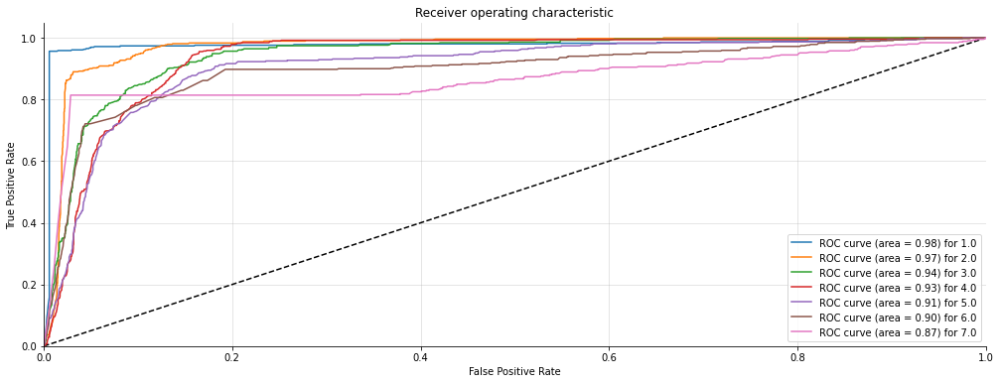

(3360, 7) (3360, 7)


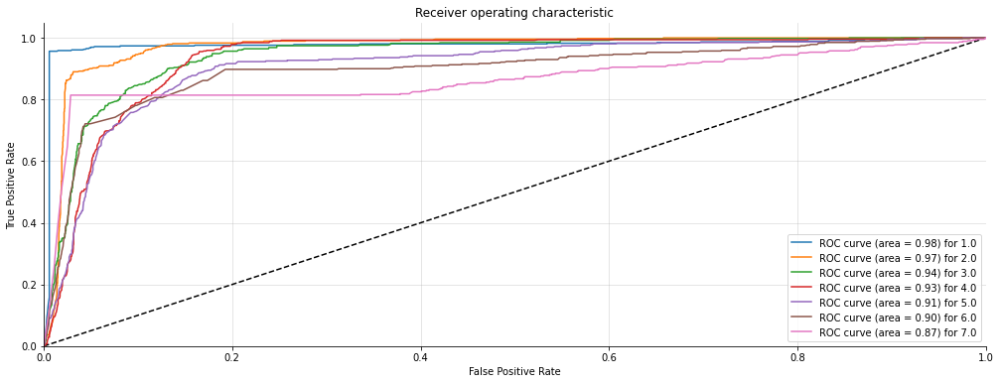

For column: complicated<==>easy
[02:03:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:03:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:03:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:03:46] WARNING: C:/Users/Administr

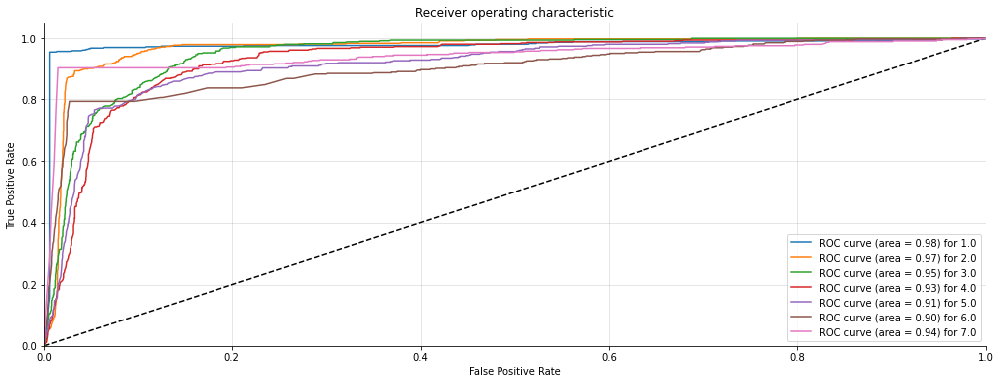

(3360, 7) (3360, 7)


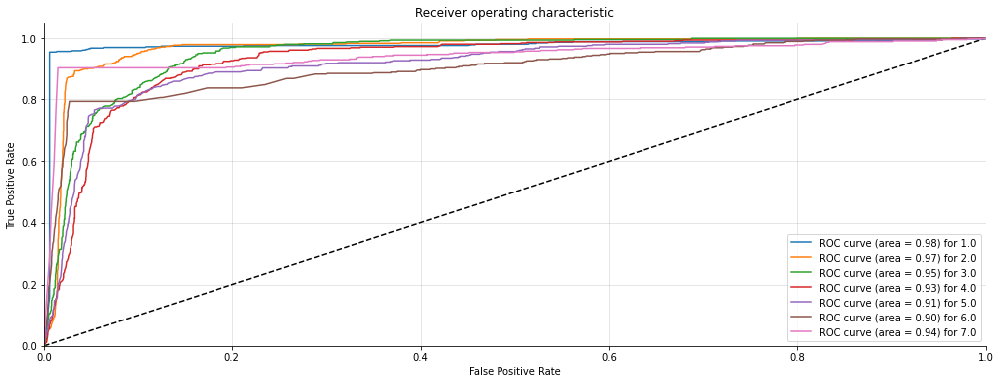

For column: inefficient<==>efficient
[02:03:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:04:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:04:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:04:08] WARNING: C:/Users/Admi

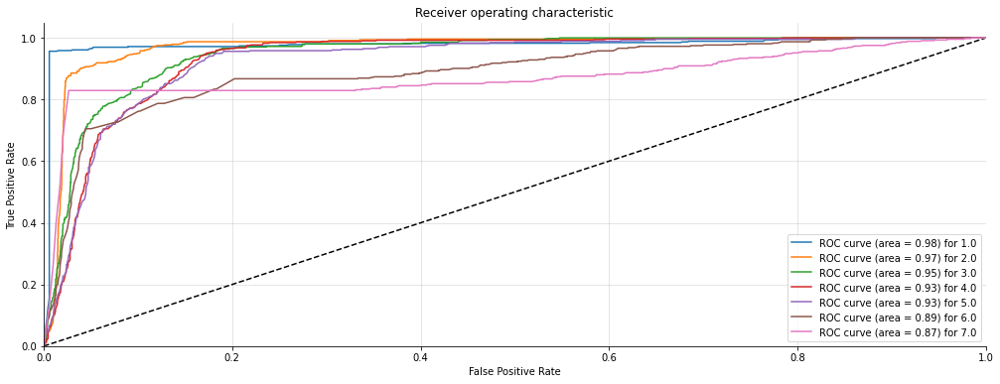

(3360, 7) (3360, 7)


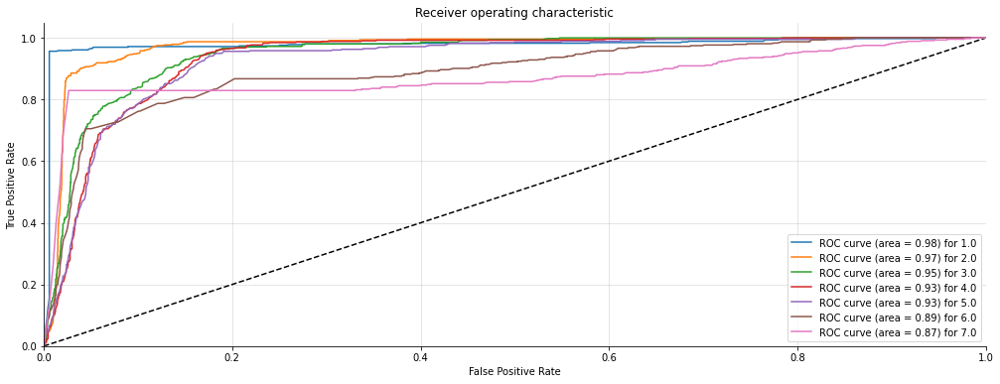

For column:  confusing<==>clear
[02:04:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:04:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:04:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:04:31] WARNING: C:/Users/Administr

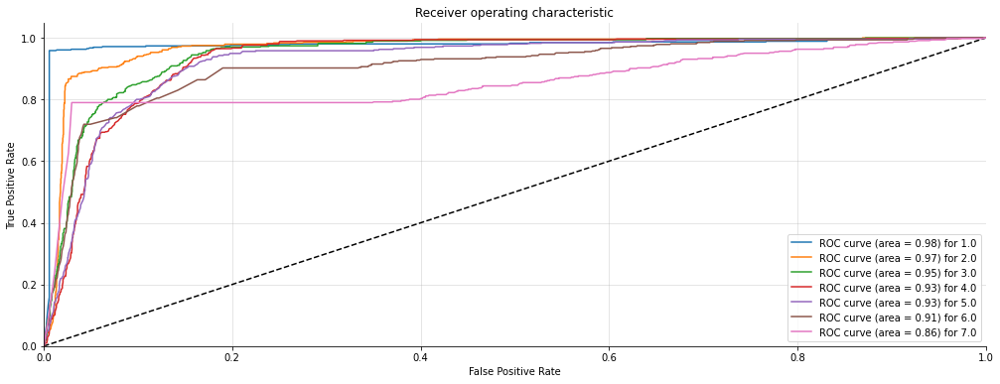

(3360, 7) (3360, 7)


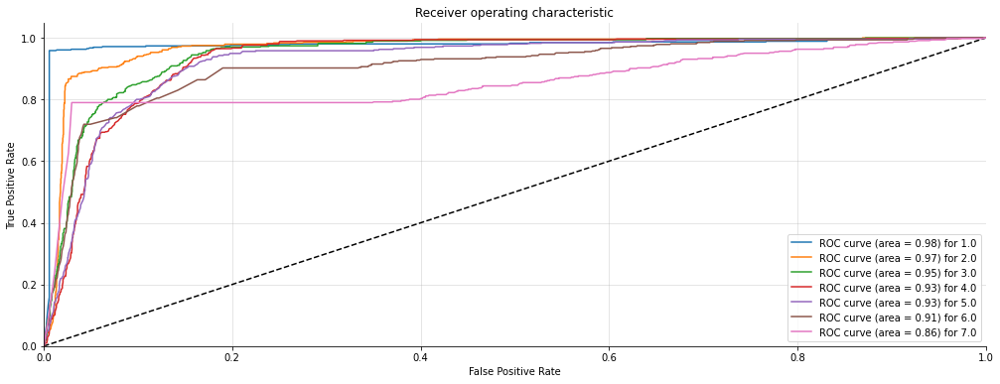

For column: boring<==>exciting
[02:04:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:04:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:04:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:04:57] WARNING: C:/Users/Administra

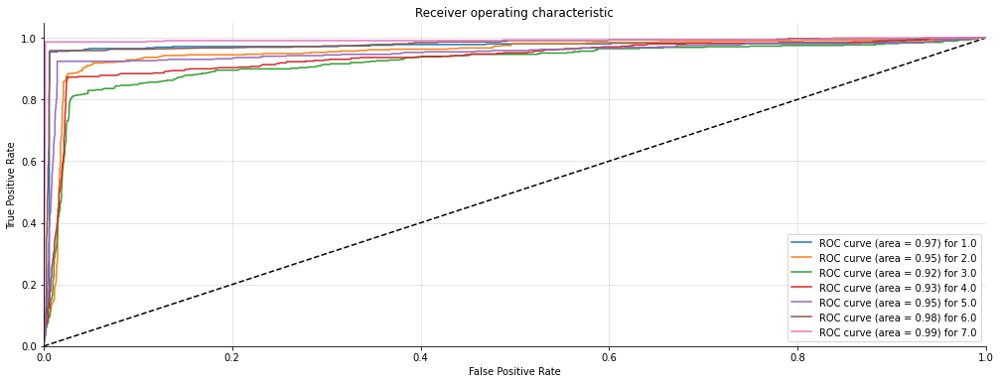

(3360, 7) (3360, 7)


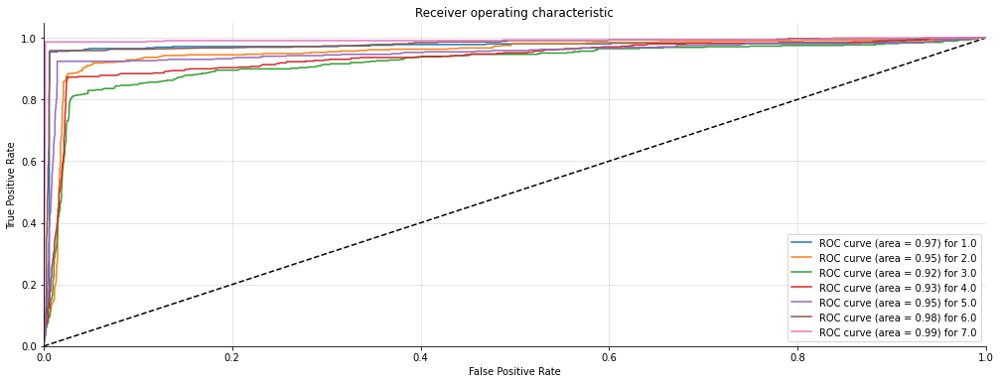

For column: not interesting<==>interesting
[02:05:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:05:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:05:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:05:10] WARNING: C:/User

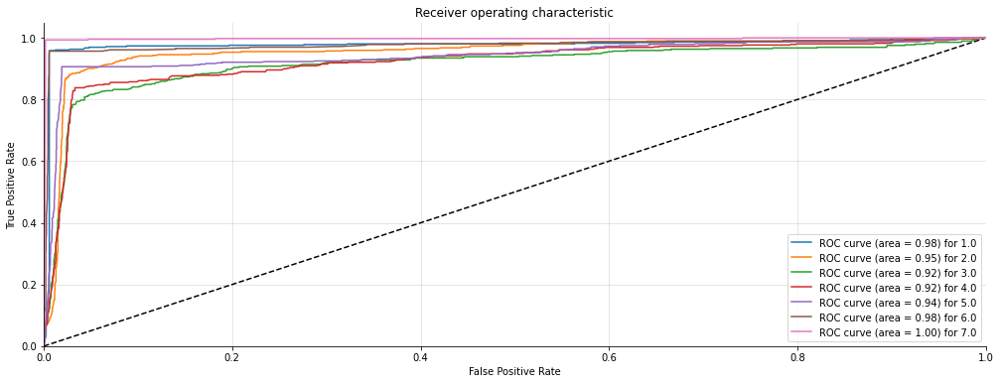

(3360, 7) (3360, 7)


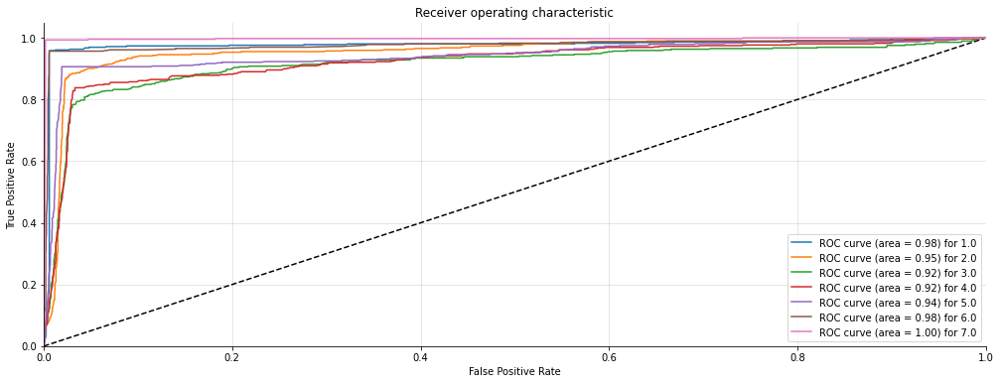

For column: conventional<==>inventive
[02:05:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:05:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:05:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:05:13] WARNING: C:/Users/Adm

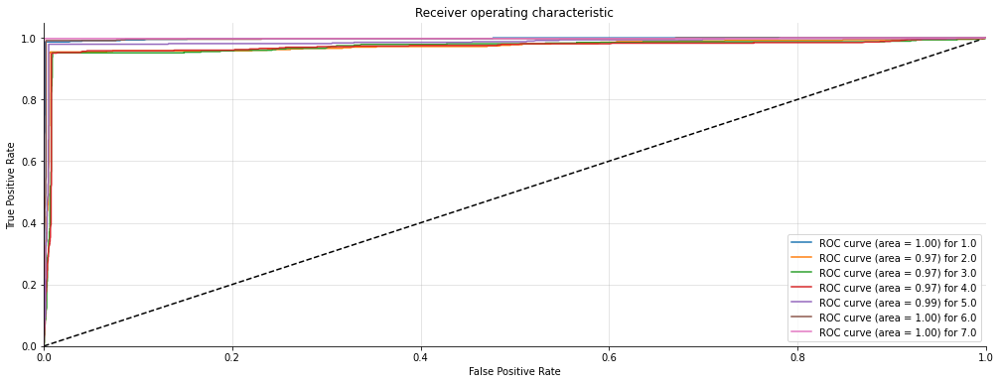

(3360, 7) (3360, 7)


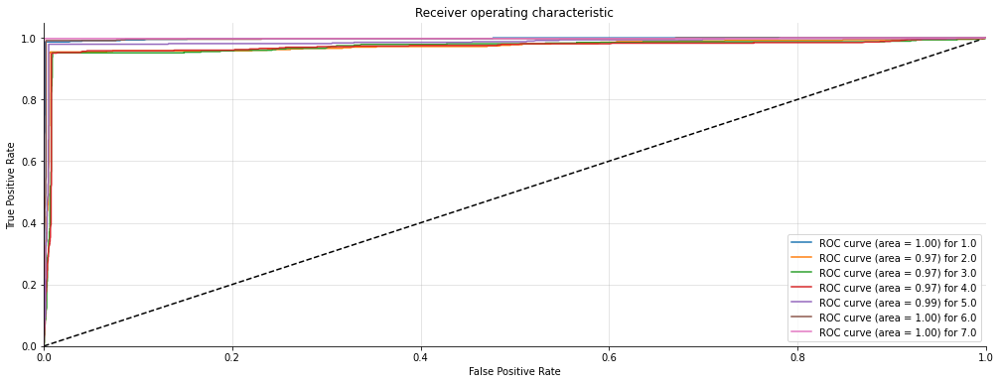

For column: usual<==>leading edge
[02:05:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:05:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:05:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:05:16] WARNING: C:/Users/Adminis

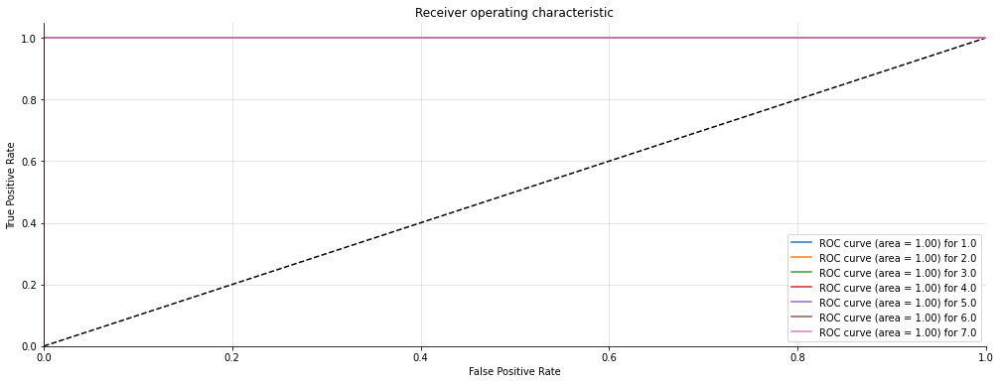

(3360, 7) (3360, 7)


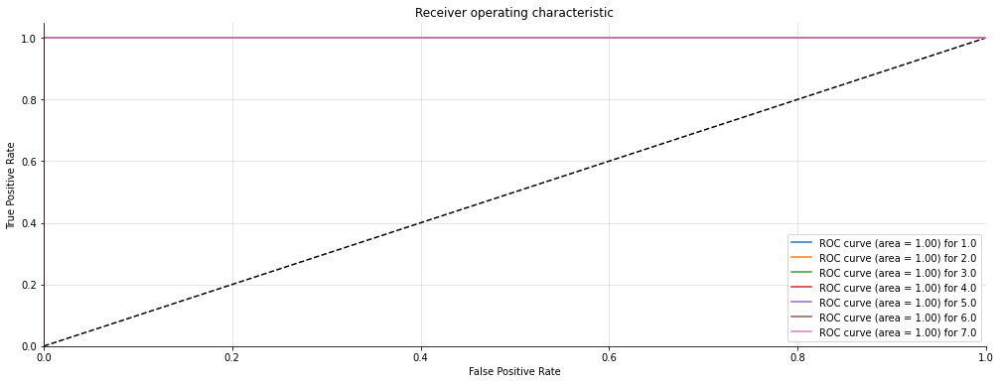

In [43]:
from sklearn.base import clone

acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]
fpo=dict()
tpo=dict()
ffpo=[]
ttpo=[]
class OrdinalClassifier():
    
    def __init__(self, clf):
        self.clf = clf
        self.clfs = {}
    
    def fit(self, X, y):
        self.unique_class = np.sort(np.unique(y))
        self.max_class = max(self.unique_class)
        self.min_class = min(self.unique_class)
        if self.unique_class.shape[0] > 2:
            # print(self.unique_class.shape[0]) # Uncomment to debug
            for i in range(self.unique_class.shape[0]):
                # for each k ordinal value we fit a binary classification problem
                binary_y = (y > self.unique_class[i]).astype(np.uint8)
                clf = clone(self.clf)
                
                
                clf.fit(X, binary_y)
                self.clfs[i + self.min_class] = clf
    
    def predict_proba(self, X):
        clfs_predict = {k:self.clfs[k].predict_proba(X) for k in self.clfs}
        # print(self.clfs) # Uncomment to debug
        predicted = []
        for i,y in enumerate(self.unique_class):
            if i == 0:
                # V1 = 1 - Pr(y > V1)
                predicted.append(1 - clfs_predict[y][:,1])
            elif y in clfs_predict:
                # Vi = Pr(y > Vi-1) - Pr(y > Vi)
                 predicted.append(clfs_predict[y-1][:,1] - clfs_predict[y][:,1])
            else:
                # Vk = Pr(y > Vk-1)
                predicted.append(clfs_predict[y-1][:,1])
        return np.vstack(predicted).T
    
    def predict(self, X):
        return np.argmax(self.predict_proba(X), axis=1) + self.min_class

def OrdinalModel(X_train, X_test, y_train, y_test, n_classes, figsize=(8, 6)):
    clf = OrdinalClassifier(XGBClassifier()) # Using XGB as the placeholder model 
    clf.fit(X_train, y_train)

    # predictions over test set
    predictions = clf.predict(X_test)
    print((classification_report(y_test, predictions)))

    # calculating Accuracy Score, Precision Score, Recall Score and F1 Score
    print('Confusion Matrix: \n' ,confusion_matrix(y_test, predictions))
    acc.append(accuracy_score(y_test, predictions))
    print(f'Accuracy Score : {accuracy_score(y_test, predictions)}')
    pre.append(precision_score(y_test,predictions,average='weighted'))
    print('Precision Score : ' + str(precision_score(y_test,predictions,average='weighted')))
    recal.append(recall_score(y_test,predictions,average='weighted'))
    print('Recall Score : ' + str(recall_score(y_test,predictions,average='weighted')))
    f1.append(f1_score(y_test,predictions,average='weighted'))
    rms.append(np.sqrt(mean_squared_error(y_test,predictions)))
    print('F1 Score : ' + str(f1_score(y_test,predictions,average='weighted')))
    aucscore.append(score_auc(y_test,predictions))
    fpo,tpo=plot_multiclass_roc(clf, X_test, y_test, n_classes)
    ffpo.append(fpo)
    ttpo.append(tpo)

    plot_multiclass_roc(clf, X_test, y_test, n_classes)

for i in range(8):
  print('For column:', df.columns[1:][i])
  n_classes = len(np.unique(df[df.columns[1:][i]]))
  OrdinalModel(X_train, X_test, y_train[:,i], y_test[:,i], n_classes, figsize=(8, 6))
  #break # Uncomment to debug

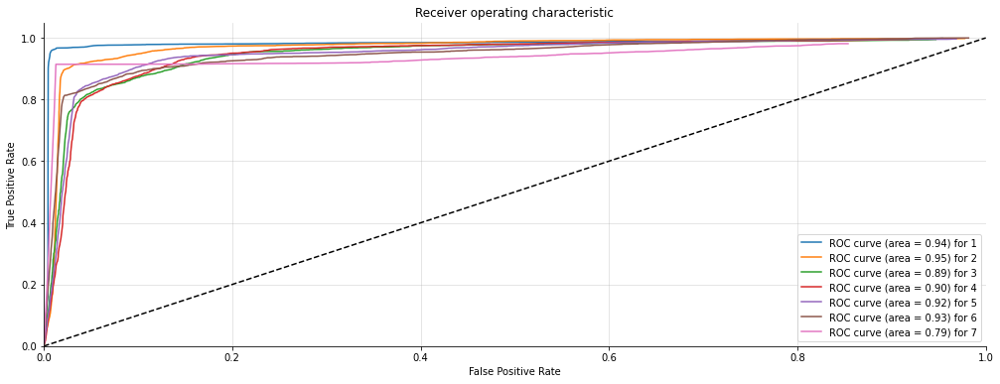

In [44]:
fsum0=list(np.array(dadd(dadd(dadd(ffpo[0][0],ffpo[1][0]),dadd(ffpo[2][0],ffpo[3][0])),dadd(dadd(ffpo[4][0],ffpo[5][0]),dadd(ffpo[6][0],ffpo[7][0]))))/8)
fsum1=list(np.array(dadd(dadd(dadd(ffpo[0][1],ffpo[1][1]),dadd(ffpo[2][1],ffpo[3][1])),dadd(dadd(ffpo[4][1],ffpo[5][1]),dadd(ffpo[6][1],ffpo[7][1]))))/8)
fsum2=list(np.array(dadd(dadd(dadd(ffpo[0][2],ffpo[1][2]),dadd(ffpo[2][2],ffpo[3][2])),dadd(dadd(ffpo[4][2],ffpo[5][2]),dadd(ffpo[6][2],ffpo[7][2]))))/8)
fsum3=list(np.array(dadd(dadd(dadd(ffpo[0][3],ffpo[1][3]),dadd(ffpo[2][3],ffpo[3][3])),dadd(dadd(ffpo[4][3],ffpo[5][3]),dadd(ffpo[6][3],ffpo[7][3]))))/8)
fsum4=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][4]),dadd(ffpo[2][4],ffpo[3][4])),dadd(dadd(ffpo[4][4],ffpo[5][4]),dadd(ffpo[6][4],ffpo[7][4]))))/8)
fsum5=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][5]),dadd(ffpo[2][5],ffpo[3][5])),dadd(dadd(ffpo[4][5],ffpo[5][5]),dadd(ffpo[6][5],ffpo[7][5]))))/8)
fsum6=list(np.array(dadd(dadd(dadd(ffpo[0][6],ffpo[1][6]),dadd(ffpo[2][6],ffpo[3][6])),dadd(dadd(ffpo[4][6],ffpo[5][6]),dadd(ffpo[6][6],ffpo[7][6]))))/8)

fpr=dict()

fpr[0]=fsum0
fpr[1]=fsum1
fpr[2]=fsum2
fpr[3]=fsum3
fpr[4]=fsum4
fpr[5]=fsum5
fpr[6]=fsum6


tsum0=list(np.array(dadd(dadd(dadd(ttpo[0][0],ttpo[1][0]),dadd(ttpo[2][0],ttpo[3][0])),dadd(dadd(ttpo[4][0],ttpo[5][0]),dadd(ttpo[6][0],ttpo[7][0]))))/8)
tsum1=list(np.array(dadd(dadd(dadd(ttpo[0][1],ttpo[1][1]),dadd(ttpo[2][1],ttpo[3][1])),dadd(dadd(ttpo[4][1],ttpo[5][1]),dadd(ttpo[6][1],ttpo[7][1]))))/8)
tsum2=list(np.array(dadd(dadd(dadd(ttpo[0][2],ttpo[1][2]),dadd(ttpo[2][2],ttpo[3][2])),dadd(dadd(ttpo[4][2],ttpo[5][2]),dadd(ttpo[6][2],ttpo[7][2]))))/8)
tsum3=list(np.array(dadd(dadd(dadd(ttpo[0][3],ttpo[1][3]),dadd(ttpo[2][3],ttpo[3][3])),dadd(dadd(ttpo[4][3],ttpo[5][3]),dadd(ttpo[6][3],ttpo[7][3]))))/8)
tsum4=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][4]),dadd(ttpo[2][4],ttpo[3][4])),dadd(dadd(ttpo[4][4],ttpo[5][4]),dadd(ttpo[6][4],ttpo[7][4]))))/8)
tsum5=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][5]),dadd(ttpo[2][5],ttpo[3][5])),dadd(dadd(ttpo[4][5],ttpo[5][5]),dadd(ttpo[6][5],ttpo[7][5]))))/8)
tsum6=list(np.array(dadd(dadd(dadd(ttpo[0][6],ttpo[1][6]),dadd(ttpo[2][6],ttpo[3][6])),dadd(dadd(ttpo[4][6],ttpo[5][6]),dadd(ttpo[6][6],ttpo[7][6]))))/8)

tpr=dict()

tpr[0]=tsum0
tpr[1]=tsum1
tpr[2]=tsum2
tpr[3]=tsum3
tpr[4]=tsum4
tpr[5]=tsum5
tpr[6]=tsum6

plot_multiclass_roc_avg(fpr,tpr,7)

In [45]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE -score :{}".format(np.mean(rms)))
print("average AUC score:{}".format(np.mean(aucscore)))
metric_df['OrdinalModel'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.8620535714285715
average Precision :0.8620126338546623
average Recall :0.8620535714285715
average F1 -score :0.8618828157635396
average RMSE -score :0.6019279718016837
average AUC score:0.9193413269068105


# 4. Other Deep Learning Model(s)

## 4.1. Bidirectional LSTM

In [46]:
## Callbacks
es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=7)

checkpoint = tf.keras.callbacks.ModelCheckpoint(
  "model_checkpoints", monitor="val_loss", verbose=1, save_best_only=True, mode="min")

## Optimizer
opt = tf.keras.optimizers.Adam(learning_rate=0.001)

LSTM_model = tf.keras.Sequential([
    tf.keras.layers.Embedding(2000, 64),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64)),
    # tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32)),
    # use ReLU in place of tanh function since they are very good alternatives of each other.
    tf.keras.layers.Dense(64, activation='relu', 
                          
                          # Prevent overfitting
                          kernel_regularizer=tf.keras.regularizers.L2(l2=0.01), 

                          # Ensuring consistent outputs and not run into potential local optima
                          # Avoid initializing standard normal (mean = 0, std = 1) to reach faster convergence and less initial loss.
                          kernel_initializer=tf.keras.initializers.RandomNormal(seed=42)
                          
                          ),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(8, activation='linear')
])
LSTM_model.summary()

LSTM_model.compile(loss=tf.keras.losses.MeanSquaredError(), optimizer= opt, metrics=['mae'])

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, None, 64)          128000    
_________________________________________________________________
bidirectional (Bidirectional (None, 128)               66048     
_________________________________________________________________
dense_8 (Dense)              (None, 64)                8256      
_________________________________________________________________
dropout_5 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_9 (Dense)              (None, 8)                 520       
Total params: 202,824
Trainable params: 202,824
Non-trainable params: 0
_________________________________________________________________


In [47]:
history = LSTM_model.fit(X_train, y_train, epochs=100, batch_size = 512, validation_split=0.2, 
                    callbacks = [es], # Call checkpoint variable if neccessary
                    verbose=1)

Epoch 1/100
21/21 [==============================] - 4s 92ms/step - loss: 18.2838 - mae: 3.7368 - val_loss: 8.9582 - val_mae: 2.4431
Epoch 2/100
21/21 [==============================] - 1s 70ms/step - loss: 6.5022 - mae: 2.0788 - val_loss: 4.3565 - val_mae: 1.7674
Epoch 3/100
21/21 [==============================] - 1s 70ms/step - loss: 5.3918 - mae: 1.9255 - val_loss: 4.0669 - val_mae: 1.7229
Epoch 4/100
21/21 [==============================] - 1s 69ms/step - loss: 5.0856 - mae: 1.8776 - val_loss: 3.9937 - val_mae: 1.7133
Epoch 5/100
21/21 [==============================] - 1s 68ms/step - loss: 4.9343 - mae: 1.8574 - val_loss: 3.8704 - val_mae: 1.6863
Epoch 6/100
21/21 [==============================] - 1s 71ms/step - loss: 4.6378 - mae: 1.8032 - val_loss: 3.6201 - val_mae: 1.6237
Epoch 7/100
21/21 [==============================] - 1s 68ms/step - loss: 4.0941 - mae: 1.6842 - val_loss: 2.7477 - val_mae: 1.4006
Epoch 8/100
21/21 [==============================] - 1s 70ms/step - loss: 2

### 4.1.1. Interpretation

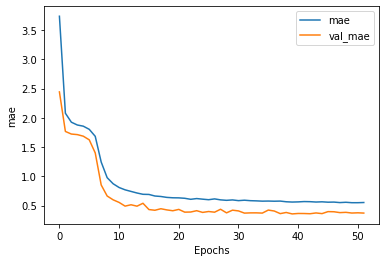

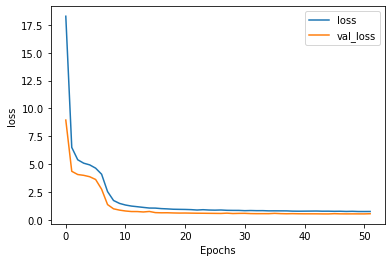

In [48]:
plot_graphs(history, "mae")
plot_graphs(history, "loss")

In [49]:
scores = LSTM_model.evaluate(
    X_test, y_test, batch_size=1, verbose=1, sample_weight=None, steps=None,
    callbacks=None, max_queue_size=10, workers=4, use_multiprocessing=False,
    return_dict=False
)
print("------------------ EVALUATION FINISHED! ------------------".center(115))
for i in range(len(scores)):
    print("%s: %.2f%%" % (model.metrics_names[i], scores[i]*100))

3360/3360 [==============================] - 5s 1ms/step - loss: 0.5689 - mae: 0.3864
                             ------------------ EVALUATION FINISHED! ------------------                            
loss: 56.89%
mae: 38.64%


In [50]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
from sklearn.metrics import mean_squared_error
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]

In [51]:
from sklearn.metrics import classification_report, f1_score
y_pred = LSTM_model.predict(X_test)
for i in range(8):
    print("Column", df.columns[1:][i])
    estimates = [round(float(x)) for x in y_pred[:,i]]
    estimates = transform_results(estimates)
    print(np.unique(estimates))
    acc.append(accuracy_score(y_test[:,i], estimates))
    pre.append(precision_score(y_test[:,i], estimates,average='weighted'))
    recal.append(recall_score(y_test[:,i], estimates,average='weighted'))
    f1.append(f1_score(y_test[:,i], estimates,average='weighted'))
    rms.append(np.sqrt(mean_squared_error(y_test[:,i], estimates)))
    aucscore.append(score_auc(y_test[:,i], estimates))
    print(classification_report(y_test[:,i], estimates), "\n------")

Column obstructive<==>supportive
[1 2 3 4 5 6 7]
              precision    recall  f1-score   support

         1.0       0.95      0.87      0.91       462
         2.0       0.71      0.55      0.62       482
         3.0       0.56      0.64      0.60       510
         4.0       0.63      0.69      0.66       517
         5.0       0.64      0.69      0.66       467
         6.0       0.73      0.72      0.73       470
         7.0       0.82      0.81      0.82       452

    accuracy                           0.71      3360
   macro avg       0.72      0.71      0.71      3360
weighted avg       0.72      0.71      0.71      3360
 
------
Column complicated<==>easy
[1 2 3 4 5 6 7]
              precision    recall  f1-score   support

         1.0       0.95      0.90      0.92       463
         2.0       0.75      0.57      0.64       485
         3.0       0.57      0.66      0.61       501
         4.0       0.65      0.70      0.67       515
         5.0       0.69      0.7

In [52]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE -score :{}".format(np.mean(rms)))
print("average AUC -score :{}".format(np.mean(aucscore)))
metric_df['Bidirectional LSTM'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.7978422619047618
average Precision :0.8043311199180649
average Recall :0.7978422619047618
average F1 -score :0.7981582224724733
average RMSE -score :0.6869045240231608
average AUC -score :0.8816555162488589


In [53]:
metric_df

,metric,Neural network classifier,XGB,SVM,OrdinalModel,Bidirectional LSTM
0,Accuracy,0.753051,0.863058,0.661979,0.862054,0.797842
1,Precision,0.767403,0.863102,0.690407,0.862013,0.804331
2,Recall,0.753051,0.863058,0.661979,0.862054,0.797842
3,F1 Score,0.755043,0.862912,0.658335,0.861883,0.798158
4,RMSE,0.781938,0.601694,1.450794,0.601928,0.686905
5,AUC score,0.855624,0.919934,0.803131,0.919341,0.881656


# Result

In [54]:
LSTM_y_pred = LSTM_model.predict(X_test)
LSTM_y_pred_flattened = LSTM_y_pred.flatten(order='F')
LSTM_y_classified = [round(float(x)) for x in LSTM_y_pred_flattened]

print("First ten examples of the test set:")
print("Truth labels:", y_test_flattened[:10])
print("Predicted labels:",LSTM_y_classified[:10])
print("Overall performance on all columns:\n", classification_report(y_test_flattened, LSTM_y_classified))

First ten examples of the test set:
Truth labels: [2. 1. 2. 1. 4. 3. 4. 3. 3. 7.]
Predicted labels: [2, 1, 3, 1, 5, 4, 4, 3, 4, 1]
Overall performance on all columns:
               precision    recall  f1-score   support

         1.0       0.95      0.91      0.93      3691
         2.0       0.78      0.59      0.67      3921
         3.0       0.61      0.71      0.66      3952
         4.0       0.74      0.79      0.77      4161
         5.0       0.78      0.83      0.81      3786
         6.0       0.87      0.85      0.86      3748
         7.0       0.92      0.91      0.92      3621

    accuracy                           0.80     26880
   macro avg       0.81      0.80      0.80     26880
weighted avg       0.80      0.80      0.80     26880



## 4.2. BERT [deprecated]

In [55]:
"""!pip install -q -U tensorflow-text
!pip install -q tf-models-official
import tensorflow_hub as hub
import tensorflow_text as text
from official.nlp import optimization  # to create AdamW optimizer

to_handle = 'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-2_H-128_A-2/1'
to_preprocess = 'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3'
bert_model = hub.KerasLayer(to_preprocess)

text_test = ['this is such an amazing movie!']
text_preprocessed = bert_model(text_test)

def build_classifier_model():
  text_input = tf.keras.layers.Input(shape=(), dtype=tf.string, name='text')
  preprocessing_layer = hub.KerasLayer(to_preprocess, name='preprocessing')
  encoder_inputs = preprocessing_layer(text_input)
  encoder = hub.KerasLayer(to_handle, trainable=True, name='BERT_encoder')
  outputs = encoder(encoder_inputs)
  net = outputs['pooled_output']
  net = tf.keras.layers.Dropout(0.1)(net)
  net = tf.keras.layers.Dense(1, activation=None, name='classifier')(net)
  return tf.keras.Model(text_input, net)

classifier_model = build_classifier_model()
classifier_model.compile(optimizer=optimizer,
                         loss=loss,
                         metrics=metrics)
print(f'Training model with {to_handle}')
history = classifier_model.fit(X_train, y_train)"""

"!pip install -q -U tensorflow-text\n!pip install -q tf-models-official\nimport tensorflow_hub as hub\nimport tensorflow_text as text\nfrom official.nlp import optimization  # to create AdamW optimizer\n\nto_handle = 'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-2_H-128_A-2/1'\nto_preprocess = 'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3'\nbert_model = hub.KerasLayer(to_preprocess)\n\ntext_test = ['this is such an amazing movie!']\ntext_preprocessed = bert_model(text_test)\n\ndef build_classifier_model():\n  text_input = tf.keras.layers.Input(shape=(), dtype=tf.string, name='text')\n  preprocessing_layer = hub.KerasLayer(to_preprocess, name='preprocessing')\n  encoder_inputs = preprocessing_layer(text_input)\n  encoder = hub.KerasLayer(to_handle, trainable=True, name='BERT_encoder')\n  outputs = encoder(encoder_inputs)\n  net = outputs['pooled_output']\n  net = tf.keras.layers.Dropout(0.1)(net)\n  net = tf.keras.layers.Dense(1, activation=None, name='classifi

# 4.3 RBFN

In [56]:

from keras import backend as K
from tensorflow.keras.layers import Layer, InputSpec
from keras.initializers import RandomUniform, Initializer, Constant
import numpy as np

In [57]:
class InitCentersRandom(Initializer):
    """ Initializer for initialization of centers of RBF network
        as random samples from the given data set.
    # Arguments
        X: matrix, dataset to choose the centers from (random rows
          are taken as centers)
    """

    def __init__(self, X):
        self.X = X

    def __call__(self, shape, dtype=None):
        assert shape[1] == self.X.shape[1]
        print("done")
        idx = np.random.randint(self.X.shape[0], size=shape[0])
        return self.X[idx, :]


class RBFLayer(Layer):
    """ Layer of Gaussian RBF units.
    # Example
    ```python
        model = Sequential()
        model.add(RBFLayer(10,
                           initializer=InitCentersRandom(X),
                           betas=1.0,
                           input_shape=(1,)))
        model.add(Dense(1))
    ```
    # Arguments
        output_dim: number of hidden units (i.e. number of outputs of the
                    layer)
        initializer: instance of initiliazer to initialize centers
        betas: float, initial value for betas
    """

    def __init__(self, output_dim, initializer=None, betas=1.0, **kwargs):
        self.output_dim = output_dim
        self.init_betas = betas
        if not initializer:
            self.initializer = RandomUniform(0.0, 1.0)
        else:
            self.initializer = initializer
        super(RBFLayer, self).__init__(**kwargs)

    def build(self, input_shape):

        self.centers = self.add_weight(name='centers',
                                       shape=(self.output_dim, input_shape[1]),
                                       initializer=self.initializer,
                                       trainable=True)
        self.betas = self.add_weight(name='betas',
                                     shape=(self.output_dim,),
                                     initializer=Constant(
                                         value=self.init_betas),
                                     # initializer='ones',
                                     trainable=True)

        super(RBFLayer, self).build(input_shape)

    def call(self, x):

        C = K.expand_dims(self.centers)
        H = K.transpose(C-K.transpose(x))
        return K.exp(-self.betas * K.sum(H**2, axis=1))

        # C = self.centers[np.newaxis, :, :]
        # X = x[:, np.newaxis, :]

        # diffnorm = K.sum((C-X)**2, axis=-1)
        # ret = K.exp( - self.betas * diffnorm)
        # return ret

    def compute_output_shape(self, input_shape):
        return (input_shape[0], self.output_dim)

    def get_config(self):
        # have to define get_config to be able to use model_from_json
        config = {
            'output_dim': self.output_dim
        }
        base_config = super(RBFLayer, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

from keras.initializers import Initializer
from sklearn.cluster import KMeans


class InitCentersKMeans(Initializer):
    """ Initializer for initialization of centers of RBF network
        by clustering the given data set.
    # Arguments
        X: matrix, dataset
    """

    def __init__(self, X, max_iter=100):
        self.X = X
        self.max_iter = max_iter

    def __call__(self, shape, dtype=None):
        assert shape[1] == self.X.shape[1]

        n_centers = shape[0]
        km = KMeans(n_clusters=n_centers, max_iter=self.max_iter, verbose=0)
        km.fit(self.X)
        return km.cluster_centers_


In [58]:
import numpy as np, pandas as pd
from keras.models import Sequential 
from keras.layers.core import Dense
from keras.layers import Activation
from tensorflow.keras.optimizers import RMSprop
import matplotlib.pyplot as plt

In [59]:
model = Sequential()
rbflayer = RBFLayer(100,
                        initializer=InitCentersKMeans(X_train),
                        betas=3.0,
                        input_shape=(X_train.shape[1],))
model.add(rbflayer)
model.add(Dense(8))
model.add(Activation('linear'))
model.compile(loss='mean_squared_error',
                  optimizer='adam', metrics=['accuracy'])
model.build(X_train.shape)
print(model.summary())
history1 = model.fit(X_train, y_train, epochs=100)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
module_wrapper (ModuleWrappe (13440, 100)              2100      
_________________________________________________________________
dense (Dense)                (13440, 8)                808       
_________________________________________________________________
activation (Activation)      (13440, 8)                0         
Total params: 2,908
Trainable params: 2,908
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/100
420/420 [==============================] - 21s 890us/step - loss: 19.0802 - accuracy: 0.1363
Epoch 2/100
420/420 [==============================] - 0s 888us/step - loss: 15.9356 - accuracy: 0.0132
Epoch 3/100
420/420 [==============================] - 0s 946us/step - loss: 13.5779 - accuracy: 0.1089
Epoch 4/100
420/420 [==============================] - 0s 915us/st

Epoch 66/100
420/420 [==============================] - 0s 881us/step - loss: 3.7392 - accuracy: 0.4806
Epoch 67/100
420/420 [==============================] - 0s 884us/step - loss: 3.7984 - accuracy: 0.2520
Epoch 68/100
420/420 [==============================] - 0s 906us/step - loss: 3.7688 - accuracy: 0.3961
Epoch 69/100
420/420 [==============================] - 0s 878us/step - loss: 3.7266 - accuracy: 0.5764
Epoch 70/100
420/420 [==============================] - 0s 881us/step - loss: 3.8245 - accuracy: 0.0639
Epoch 71/100
420/420 [==============================] - 0s 873us/step - loss: 3.7231 - accuracy: 0.2831
Epoch 72/100
420/420 [==============================] - 0s 883us/step - loss: 3.7648 - accuracy: 0.3925
Epoch 73/100
420/420 [==============================] - 0s 874us/step - loss: 3.7488 - accuracy: 0.1437
Epoch 74/100
420/420 [==============================] - 0s 876us/step - loss: 3.7584 - accuracy: 0.3101
Epoch 75/100
420/420 [==============================] - 0s 880us

In [60]:
scores = model.evaluate(
    X_test, y_test, batch_size=1, verbose=1, sample_weight=None, steps=None,
    callbacks=None, max_queue_size=10, workers=4, use_multiprocessing=False,
    return_dict=False
)
print("------------------ EVALUATION FINISHED! ------------------".center(115))
for i in range(len(scores)):
    print("%s: %.2f%%" % (model.metrics_names[i], scores[i]*100))

3360/3360 [==============================] - 2s 513us/step - loss: 3.6291 - accuracy: 0.0086
                             ------------------ EVALUATION FINISHED! ------------------                            
loss: 362.91%
accuracy: 0.86%


In [61]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
from sklearn.metrics import mean_squared_error
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]

In [62]:
from sklearn.metrics import classification_report, f1_score
y_pred = model.predict(X_test)
for i in range(8):
    print("Column", df.columns[1:][i])
    estimates = [round(float(x)) for x in y_pred[:,i]]
    estimates = transform_results(estimates)
    print(np.unique(estimates))
    acc.append(accuracy_score(y_test[:,i], estimates))
    pre.append(precision_score(y_test[:,i], estimates,average='weighted'))
    recal.append(recall_score(y_test[:,i], estimates,average='weighted'))
    f1.append(f1_score(y_test[:,i], estimates,average='weighted'))
    rms.append(np.sqrt(mean_squared_error(y_test[:,i], estimates)))
    aucscore.append(score_auc(y_test[:,i], estimates))
    print(classification_report(y_test[:,i], estimates), "\n------")

Column obstructive<==>supportive
[1 2 4 5 6 7]
              precision    recall  f1-score   support

         1.0       1.00      0.01      0.02       462
         2.0       1.00      0.01      0.02       482
         3.0       0.00      0.00      0.00       510
         4.0       0.16      0.99      0.27       517
         5.0       0.67      0.02      0.04       467
         6.0       0.69      0.05      0.10       470
         7.0       0.76      0.12      0.21       452

    accuracy                           0.18      3360
   macro avg       0.61      0.17      0.09      3360
weighted avg       0.60      0.18      0.10      3360
 
------
Column complicated<==>easy
[1 2 4 5 6 7]
              precision    recall  f1-score   support

         1.0       1.00      0.01      0.02       463
         2.0       1.00      0.01      0.02       485
         3.0       0.00      0.00      0.00       501
         4.0       0.16      0.99      0.27       515
         5.0       0.67      0.02   

In [63]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE -score :{}".format(np.mean(rms)))
print("average AUC -score :{}".format(np.mean(aucscore)))
metric_df['RBFN'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.18876488095238098
average Precision :0.6640736107730474
average Recall :0.18876488095238098
average F1 -score :0.10542724395877534
average RMSE -score :1.9081644070354273
average AUC -score :0.5201465917192054


In [64]:
LSTM_y_pred = model.predict(X_test)
LSTM_y_pred_flattened = LSTM_y_pred.flatten(order='F')
LSTM_y_classified = [round(float(x)) for x in LSTM_y_pred_flattened]

print("First ten examples of the test set:")
print("Truth labels:", y_test[:10])
print("Predicted labels:",LSTM_y_classified[:10])
print("Overall performance on all columns:\n", classification_report(y_test.flatten(order='F'), LSTM_y_classified))

First ten examples of the test set:
Truth labels: [[2. 2. 2. 2. 2. 2. 2. 2.]
 [1. 1. 1. 1. 1. 1. 1. 1.]
 [2. 2. 2. 2. 2. 2. 2. 2.]
 [1. 1. 1. 1. 1. 1. 1. 1.]
 [4. 4. 4. 4. 5. 5. 5. 5.]
 [3. 3. 3. 3. 3. 3. 4. 4.]
 [4. 4. 4. 4. 4. 4. 4. 4.]
 [3. 3. 3. 3. 3. 3. 3. 3.]
 [3. 3. 3. 3. 3. 3. 4. 4.]
 [7. 7. 7. 7. 2. 2. 1. 1.]]
Predicted labels: [4, 4, 4, 4, 4, 4, 4, 4, 4, 4]
Overall performance on all columns:
               precision    recall  f1-score   support

         1.0       1.00      0.01      0.02      3691
         2.0       1.00      0.01      0.02      3921
         3.0       0.00      0.00      0.00      3952
         4.0       0.16      0.99      0.28      4161
         5.0       0.82      0.03      0.05      3786
         6.0       0.86      0.07      0.12      3748
         7.0       0.90      0.14      0.25      3621

    accuracy                           0.19     26880
   macro avg       0.68      0.18      0.10     26880
weighted avg       0.66      0.19      0.11     268

In [65]:
from sklearn.metrics import classification_report

In [66]:
X_test.shape

(3360, 20)

In [67]:
y_train.shape

(13440, 8)

In [68]:
metric_df

,metric,Neural network classifier,XGB,SVM,OrdinalModel,Bidirectional LSTM,RBFN
0,Accuracy,0.753051,0.863058,0.661979,0.862054,0.797842,0.188765
1,Precision,0.767403,0.863102,0.690407,0.862013,0.804331,0.664074
2,Recall,0.753051,0.863058,0.661979,0.862054,0.797842,0.188765
3,F1 Score,0.755043,0.862912,0.658335,0.861883,0.798158,0.105427
4,RMSE,0.781938,0.601694,1.450794,0.601928,0.686905,1.908164
5,AUC score,0.855624,0.919934,0.803131,0.919341,0.881656,0.520147


# 4.4 Multiclass Logistic regression

For column: obstructive<==>supportive
              precision    recall  f1-score   support

         1.0       0.21      0.49      0.29       462
         2.0       0.22      0.13      0.17       482
         3.0       0.29      0.10      0.15       510
         4.0       0.26      0.17      0.21       517
         5.0       0.23      0.14      0.17       467
         6.0       0.19      0.15      0.17       470
         7.0       0.47      0.85      0.60       452

    accuracy                           0.28      3360
   macro avg       0.27      0.29      0.25      3360
weighted avg       0.27      0.28      0.25      3360

Confusion Matrix: 
 [[226  46  17   7  33  73  60]
 [170  65  24  57  40  53  73]
 [150  76  52  69  44  62  57]
 [169  50  38  89  65  42  64]
 [181  23  26  63  64  54  56]
 [166  20  13  52  22  70 127]
 [ 27  11   7   7   7  11 382]]
Accuracy Score : 0.28214285714285714
Precision Score : 0.26689726934884156
Recall Score : 0.28214285714285714
F1 Score : 0.2472

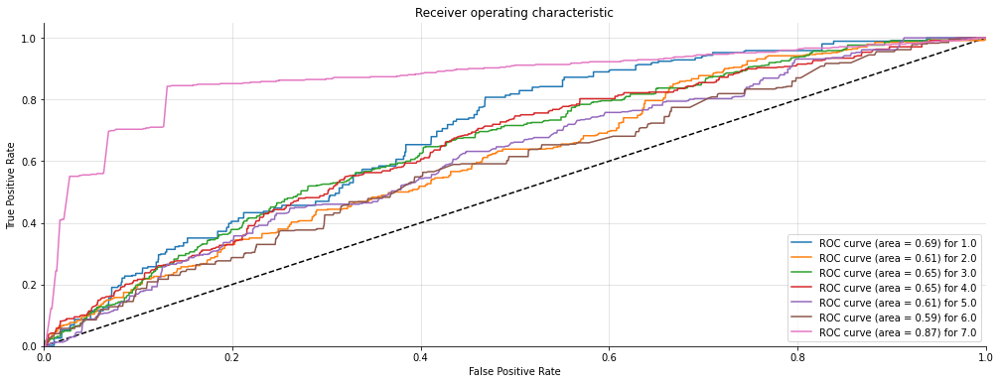

(3360, 7) (3360, 7)


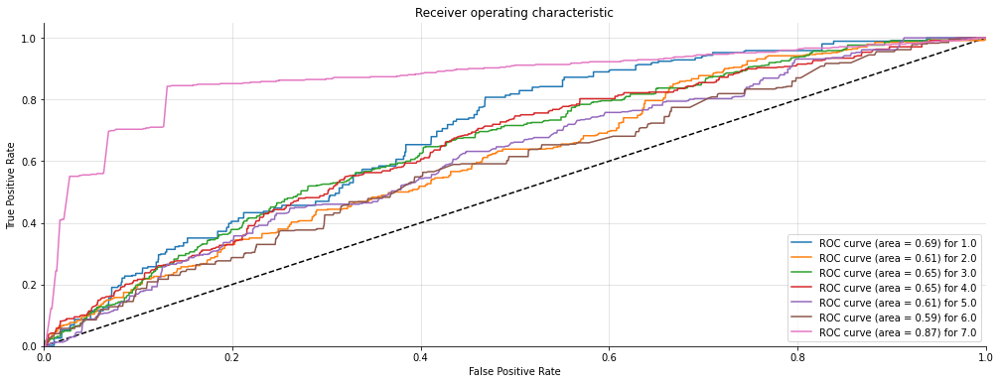

For column: complicated<==>easy
              precision    recall  f1-score   support

         1.0       0.27      0.16      0.20       463
         2.0       0.20      0.15      0.17       485
         3.0       0.26      0.14      0.18       501
         4.0       0.24      0.27      0.25       515
         5.0       0.19      0.19      0.19       460
         6.0       0.24      0.29      0.26       484
         7.0       0.51      0.92      0.65       452

    accuracy                           0.30      3360
   macro avg       0.27      0.30      0.27      3360
weighted avg       0.27      0.30      0.27      3360

Confusion Matrix: 
 [[ 76  72  23  51  69  96  76]
 [ 41  72  45 106  55  93  73]
 [ 44  67  70 106  72  89  53]
 [ 33  62  52 139 100  77  52]
 [ 35  45  51 111  88  81  49]
 [ 54  34  24  51  83 138 100]
 [  3   6   3  12   4   9 415]]
Accuracy Score : 0.2970238095238095
Precision Score : 0.2695061984466478
Recall Score : 0.2970238095238095
F1 Score : 0.2698816143908

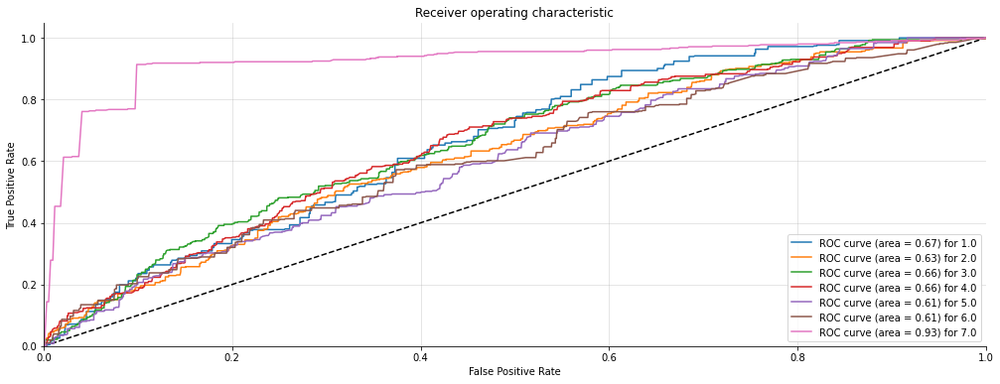

(3360, 7) (3360, 7)


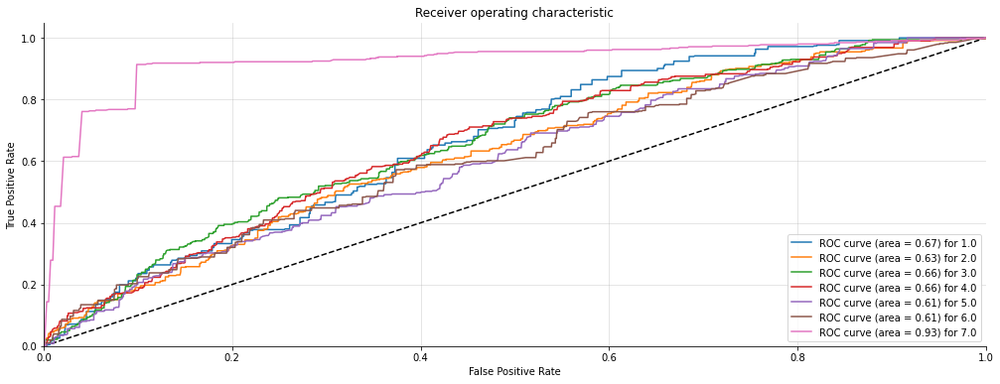

For column: inefficient<==>efficient
              precision    recall  f1-score   support

         1.0       0.20      0.48      0.29       462
         2.0       0.22      0.14      0.17       482
         3.0       0.30      0.11      0.16       506
         4.0       0.25      0.16      0.20       526
         5.0       0.22      0.13      0.16       458
         6.0       0.21      0.15      0.18       475
         7.0       0.47      0.85      0.60       451

    accuracy                           0.28      3360
   macro avg       0.27      0.29      0.25      3360
weighted avg       0.27      0.28      0.25      3360

Confusion Matrix: 
 [[224  54  11   8  33  71  61]
 [171  69  24  51  39  56  72]
 [150  74  56  71  42  56  57]
 [174  54  45  84  65  38  66]
 [180  27  28  60  59  48  56]
 [167  21  14  55  22  73 123]
 [ 31  11   6   4   9   7 383]]
Accuracy Score : 0.28214285714285714
Precision Score : 0.26764277032315803
Recall Score : 0.28214285714285714
F1 Score : 0.24776

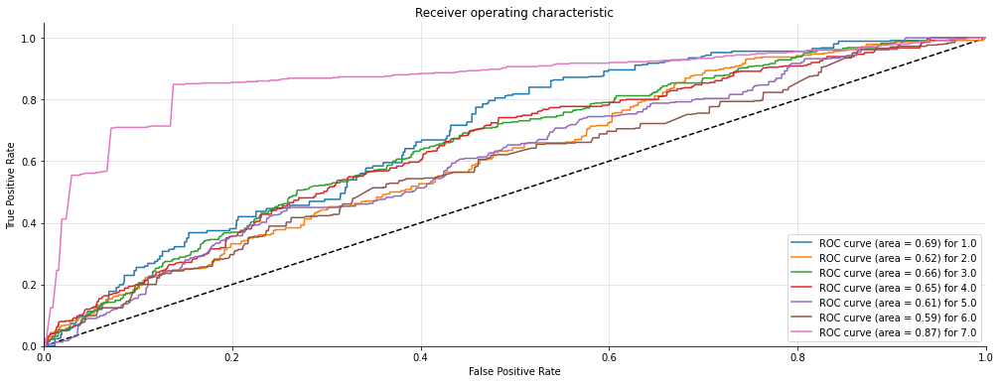

(3360, 7) (3360, 7)


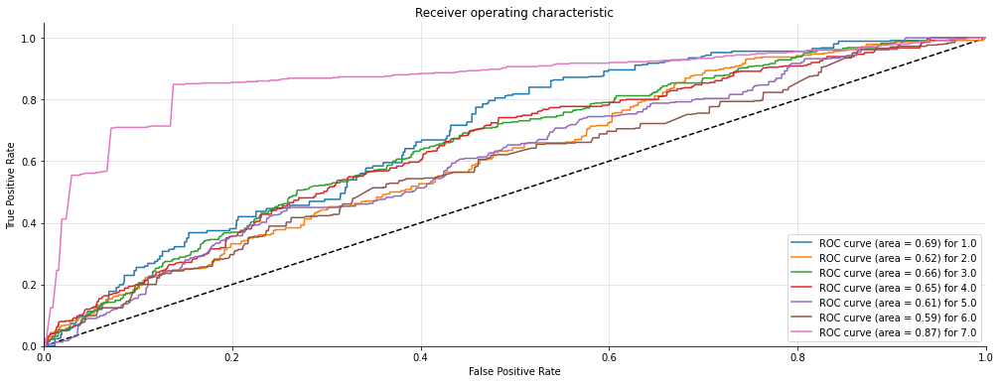

For column:  confusing<==>clear
              precision    recall  f1-score   support

         1.0       0.21      0.49      0.29       461
         2.0       0.22      0.15      0.18       488
         3.0       0.30      0.11      0.16       506
         4.0       0.27      0.17      0.21       516
         5.0       0.22      0.13      0.16       456
         6.0       0.18      0.14      0.15       471
         7.0       0.46      0.81      0.59       462

    accuracy                           0.28      3360
   macro avg       0.27      0.28      0.25      3360
weighted avg       0.27      0.28      0.25      3360

Confusion Matrix: 
 [[225  54  11   7  33  64  67]
 [180  72  25  46  42  51  72]
 [145  76  54  66  47  57  61]
 [175  51  36  87  61  54  52]
 [171  31  32  58  60  56  48]
 [155  24  17  50  27  64 134]
 [ 34  14   6  11   9  12 376]]
Accuracy Score : 0.2791666666666667
Precision Score : 0.2650394464899354
Recall Score : 0.2791666666666667
F1 Score : 0.2462945952200

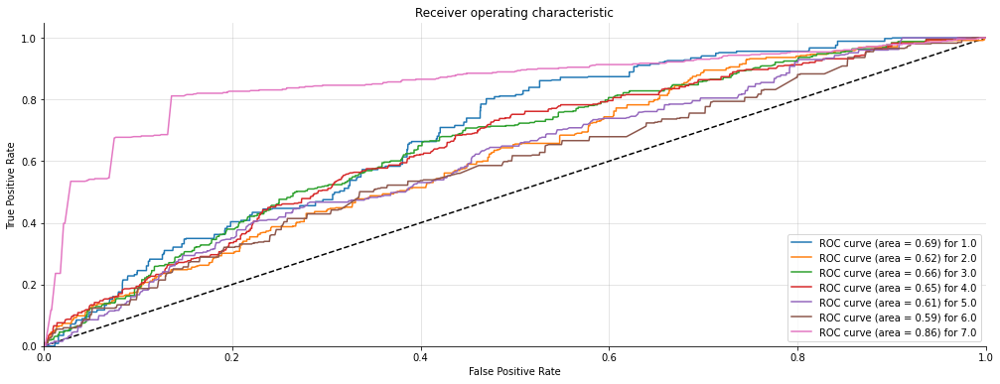

(3360, 7) (3360, 7)


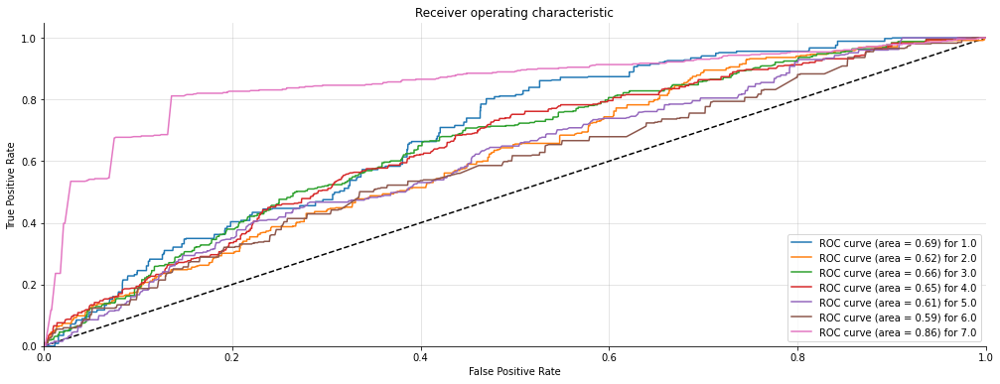

For column: boring<==>exciting
              precision    recall  f1-score   support

         1.0       0.26      0.13      0.17       463
         2.0       0.20      0.14      0.16       491
         3.0       0.24      0.16      0.20       487
         4.0       0.26      0.25      0.25       518
         5.0       0.26      0.32      0.29       487
         6.0       0.29      0.42      0.34       462
         7.0       0.66      0.99      0.79       452

    accuracy                           0.34      3360
   macro avg       0.31      0.34      0.31      3360
weighted avg       0.31      0.34      0.31      3360

Confusion Matrix: 
 [[ 61  63  35  76  72 107  49]
 [ 38  67  58  99  83  97  49]
 [ 39  66  80  75 102  96  29]
 [ 28  60  52 129 124  95  30]
 [ 21  52  59  75 156  89  35]
 [ 50  28  44  50  52 195  43]
 [  1   1   0   1   0   2 447]]
Accuracy Score : 0.33779761904761907
Precision Score : 0.3050339958243495
Recall Score : 0.33779761904761907
F1 Score : 0.309962946114

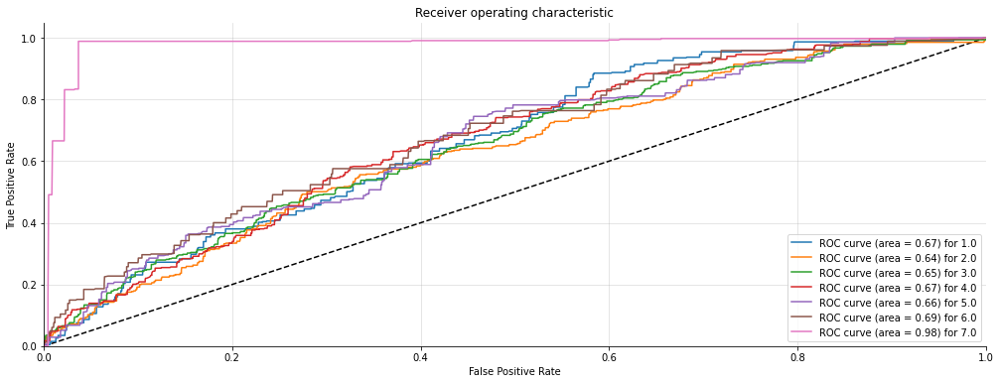

(3360, 7) (3360, 7)


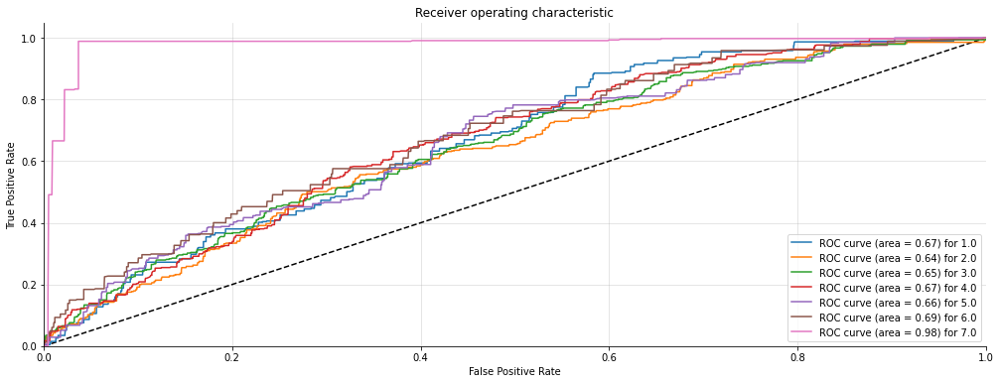

For column: not interesting<==>interesting
              precision    recall  f1-score   support

         1.0       0.25      0.14      0.18       461
         2.0       0.19      0.10      0.13       495
         3.0       0.23      0.14      0.17       490
         4.0       0.25      0.26      0.25       519
         5.0       0.24      0.32      0.27       481
         6.0       0.27      0.40      0.33       465
         7.0       0.66      1.00      0.79       449

    accuracy                           0.33      3360
   macro avg       0.30      0.34      0.31      3360
weighted avg       0.30      0.33      0.30      3360

Confusion Matrix: 
 [[ 65  48  31  70  87 107  53]
 [ 37  51  58 112  86 100  51]
 [ 41  61  69  85 101 102  31]
 [ 26  44  53 135 139  92  30]
 [ 31  39  54  80 152  93  32]
 [ 55  23  34  62  72 187  32]
 [  1   0   0   0   0   1 447]]
Accuracy Score : 0.32916666666666666
Precision Score : 0.2955366412038793
Recall Score : 0.32916666666666666
F1 Score : 0.

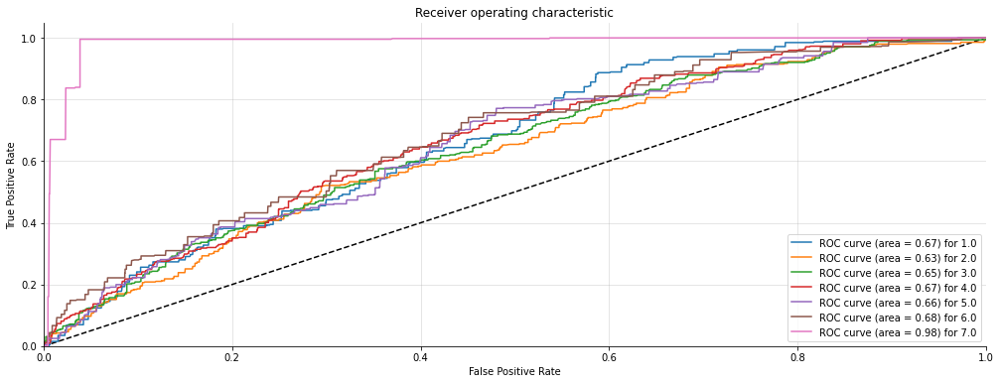

(3360, 7) (3360, 7)


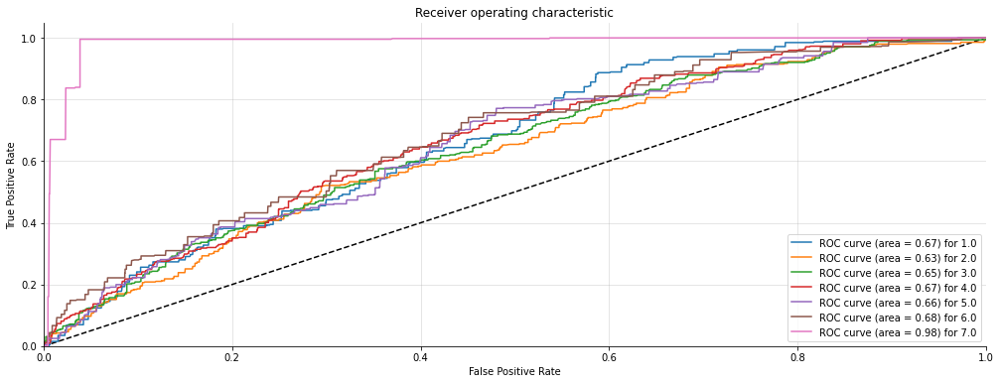

For column: conventional<==>inventive
              precision    recall  f1-score   support

         1.0       0.28      0.13      0.18       460
         2.0       0.17      0.12      0.14       502
         3.0       0.24      0.17      0.20       474
         4.0       0.26      0.24      0.25       527
         5.0       0.25      0.32      0.28       486
         6.0       0.28      0.44      0.34       459
         7.0       0.70      1.00      0.82       452

    accuracy                           0.34      3360
   macro avg       0.31      0.35      0.32      3360
weighted avg       0.31      0.34      0.31      3360

Confusion Matrix: 
 [[ 60  63  41  75  61 114  46]
 [ 29  59  67 111  89 102  45]
 [ 29  72  82  69 100  96  26]
 [ 27  57  36 128 142 115  22]
 [ 29  55  53  69 154  92  34]
 [ 44  35  58  40  60 203  19]
 [  0   0   0   1   0   0 451]]
Accuracy Score : 0.33839285714285716
Precision Score : 0.30810009936805305
Recall Score : 0.33839285714285716
F1 Score : 0.3116

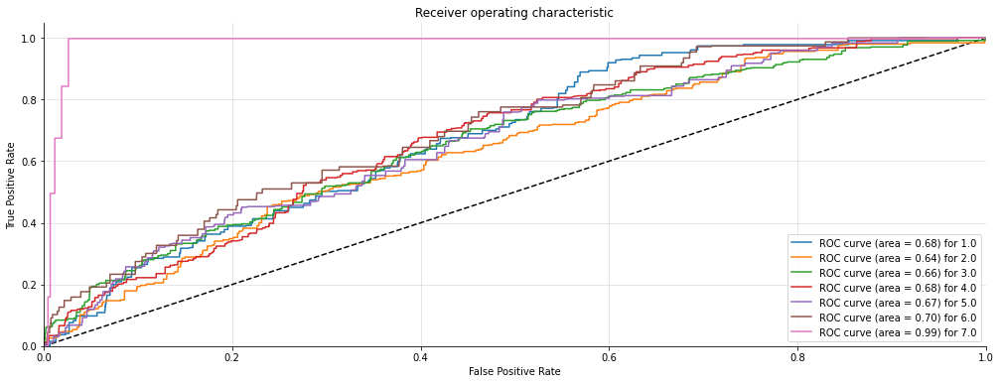

(3360, 7) (3360, 7)


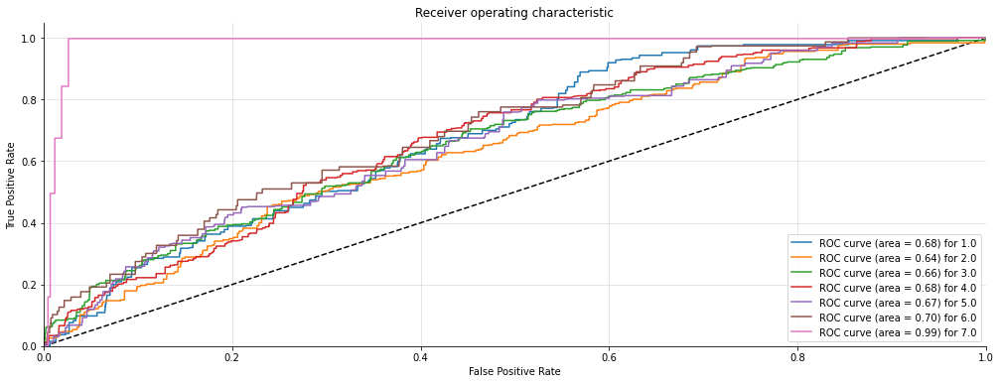

For column: usual<==>leading edge
              precision    recall  f1-score   support

         1.0       0.22      0.10      0.14       459
         2.0       0.17      0.13      0.15       496
         3.0       0.25      0.19      0.22       478
         4.0       0.26      0.25      0.26       523
         5.0       0.24      0.29      0.27       491
         6.0       0.29      0.44      0.35       462
         7.0       0.71      1.00      0.83       451

    accuracy                           0.34      3360
   macro avg       0.31      0.34      0.32      3360
weighted avg       0.30      0.34      0.31      3360

Confusion Matrix: 
 [[ 46  81  52  65  68 102  45]
 [ 27  63  68 110  85  98  45]
 [ 32  66  92  66  95 102  25]
 [ 26  71  40 131 136  99  20]
 [ 25  53  64  84 144  96  25]
 [ 55  34  47  40  62 204  20]
 [  0   0   0   0   0   0 451]]
Accuracy Score : 0.3366071428571429
Precision Score : 0.30383593330169184
Recall Score : 0.3366071428571429
F1 Score : 0.3104980301

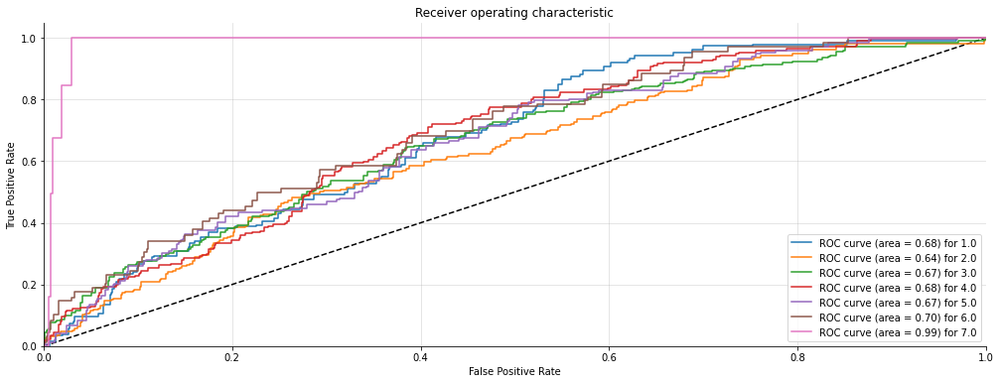

(3360, 7) (3360, 7)


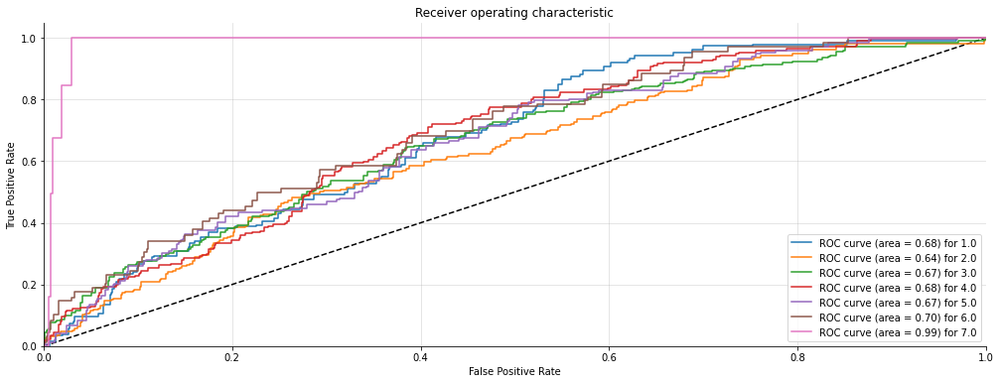

In [69]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]
fpo=dict()
tpo=dict()
ffpo=[]
ttpo=[]
def Logistic(X_train, X_test, y_train, y_test, n_classes, figsize=(8, 6)):
    model = LogisticRegression(multi_class='multinomial', solver='lbfgs')   
    model.fit(X_train, y_train)

    # predictions over test set
    predictions = [round(float(x)) for x in model.predict(X_test)]
    print((classification_report(y_test, predictions)))


    # calculating Accuracy Score, Precision Score, Recall Score and F1 Score
    print('Confusion Matrix: \n' ,confusion_matrix(y_test, predictions))
    acc.append(accuracy_score(y_test, predictions))
    print(f'Accuracy Score : {accuracy_score(y_test, predictions)}')
    pre.append(precision_score(y_test,predictions,average='weighted'))
    print('Precision Score : ' + str(precision_score(y_test,predictions,average='weighted')))
    recal.append(recall_score(y_test,predictions,average='weighted'))
    print('Recall Score : ' + str(recall_score(y_test,predictions,average='weighted')))
    f1.append(f1_score(y_test,predictions,average='weighted'))
    print('F1 Score : ' + str(f1_score(y_test,predictions,average='weighted')))
    rms.append(np.sqrt(mean_squared_error(y_test,predictions)))
    aucscore.append(score_auc(y_test,predictions))
    fpo,tpo=plot_multiclass_roc(model, X_test, y_test, n_classes)
    ffpo.append(fpo)
    ttpo.append(tpo)
    plot_multiclass_roc(model, X_test, y_test, n_classes)

for i in range(8):
  print('For column:', df.columns[1:][i])
  n_classes = len(np.unique(df[df.columns[1:][i]]))
  Logistic(X_train, X_test, y_train[:,i], y_test[:,i], n_classes, figsize=(8, 6))

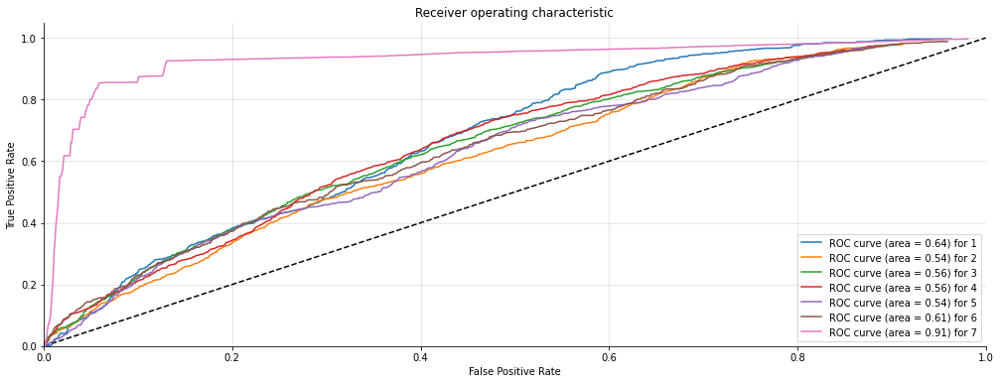

In [70]:
fsum0=list(np.array(dadd(dadd(dadd(ffpo[0][0],ffpo[1][0]),dadd(ffpo[2][0],ffpo[3][0])),dadd(dadd(ffpo[4][0],ffpo[5][0]),dadd(ffpo[6][0],ffpo[7][0]))))/8)
fsum1=list(np.array(dadd(dadd(dadd(ffpo[0][1],ffpo[1][1]),dadd(ffpo[2][1],ffpo[3][1])),dadd(dadd(ffpo[4][1],ffpo[5][1]),dadd(ffpo[6][1],ffpo[7][1]))))/8)
fsum2=list(np.array(dadd(dadd(dadd(ffpo[0][2],ffpo[1][2]),dadd(ffpo[2][2],ffpo[3][2])),dadd(dadd(ffpo[4][2],ffpo[5][2]),dadd(ffpo[6][2],ffpo[7][2]))))/8)
fsum3=list(np.array(dadd(dadd(dadd(ffpo[0][3],ffpo[1][3]),dadd(ffpo[2][3],ffpo[3][3])),dadd(dadd(ffpo[4][3],ffpo[5][3]),dadd(ffpo[6][3],ffpo[7][3]))))/8)
fsum4=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][4]),dadd(ffpo[2][4],ffpo[3][4])),dadd(dadd(ffpo[4][4],ffpo[5][4]),dadd(ffpo[6][4],ffpo[7][4]))))/8)
fsum5=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][5]),dadd(ffpo[2][5],ffpo[3][5])),dadd(dadd(ffpo[4][5],ffpo[5][5]),dadd(ffpo[6][5],ffpo[7][5]))))/8)
fsum6=list(np.array(dadd(dadd(dadd(ffpo[0][6],ffpo[1][6]),dadd(ffpo[2][6],ffpo[3][6])),dadd(dadd(ffpo[4][6],ffpo[5][6]),dadd(ffpo[6][6],ffpo[7][6]))))/8)

fpr=dict()

fpr[0]=fsum0
fpr[1]=fsum1
fpr[2]=fsum2
fpr[3]=fsum3
fpr[4]=fsum4
fpr[5]=fsum5
fpr[6]=fsum6


tsum0=list(np.array(dadd(dadd(dadd(ttpo[0][0],ttpo[1][0]),dadd(ttpo[2][0],ttpo[3][0])),dadd(dadd(ttpo[4][0],ttpo[5][0]),dadd(ttpo[6][0],ttpo[7][0]))))/8)
tsum1=list(np.array(dadd(dadd(dadd(ttpo[0][1],ttpo[1][1]),dadd(ttpo[2][1],ttpo[3][1])),dadd(dadd(ttpo[4][1],ttpo[5][1]),dadd(ttpo[6][1],ttpo[7][1]))))/8)
tsum2=list(np.array(dadd(dadd(dadd(ttpo[0][2],ttpo[1][2]),dadd(ttpo[2][2],ttpo[3][2])),dadd(dadd(ttpo[4][2],ttpo[5][2]),dadd(ttpo[6][2],ttpo[7][2]))))/8)
tsum3=list(np.array(dadd(dadd(dadd(ttpo[0][3],ttpo[1][3]),dadd(ttpo[2][3],ttpo[3][3])),dadd(dadd(ttpo[4][3],ttpo[5][3]),dadd(ttpo[6][3],ttpo[7][3]))))/8)
tsum4=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][4]),dadd(ttpo[2][4],ttpo[3][4])),dadd(dadd(ttpo[4][4],ttpo[5][4]),dadd(ttpo[6][4],ttpo[7][4]))))/8)
tsum5=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][5]),dadd(ttpo[2][5],ttpo[3][5])),dadd(dadd(ttpo[4][5],ttpo[5][5]),dadd(ttpo[6][5],ttpo[7][5]))))/8)
tsum6=list(np.array(dadd(dadd(dadd(ttpo[0][6],ttpo[1][6]),dadd(ttpo[2][6],ttpo[3][6])),dadd(dadd(ttpo[4][6],ttpo[5][6]),dadd(ttpo[6][6],ttpo[7][6]))))/8)

tpr=dict()

tpr[0]=tsum0
tpr[1]=tsum1
tpr[2]=tsum2
tpr[3]=tsum3
tpr[4]=tsum4
tpr[5]=tsum5
tpr[6]=tsum6

plot_multiclass_roc_avg(fpr,tpr,7)

In [71]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE :{}".format(np.mean(rms)))
print("average AUC score {}".format(np.mean(aucscore)))
metric_df['LogisticModel'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.3103050595238095
average Precision :0.28519904428831955
average Recall :0.3103050595238095
average F1 -score :0.28036164030529
average RMSE :2.4315229910181113
average AUC score 0.5979321875398892


# 4.5 Neural network - classifier

In [72]:
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam

initializer = tf.keras.initializers.RandomNormal(seed=1) # Reproducibility

model = Sequential(name="classifier_NN")
model.add(tf.keras.Input(shape=(X_train.shape[1],))) # Automatically detect features as input nodes
model.add(layers.Dense(512, activation='relu', kernel_initializer=initializer))
model.add(layers.Dense(256, activation='relu', kernel_initializer=initializer))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(256, activation='relu', kernel_initializer=initializer))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(256, activation='relu', kernel_initializer=initializer))
model.add(layers.Dense(128, activation='relu', kernel_initializer=initializer))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(128, activation='relu', kernel_initializer=initializer))
model.add(layers.Dense(64, activation='relu', kernel_initializer=initializer))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(8)) # output layer
opt = tf.keras.optimizers.Adam(learning_rate = 0.0003)
model.compile(loss=tf.keras.losses.MeanSquaredError(), metrics=['mae'], optimizer = opt)
model.summary()

Model: "classifier_NN"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_10 (Dense)             (None, 512)               10752     
_________________________________________________________________
dense_11 (Dense)             (None, 256)               131328    
_________________________________________________________________
dropout_6 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_12 (Dense)             (None, 256)               65792     
_________________________________________________________________
dropout_7 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_13 (Dense)             (None, 256)               65792     
_________________________________________________________________
dense_14 (Dense)             (None, 128)             

Epoch 1/150
588/588 - 2s - loss: 4.8037 - mae: 1.7020 - val_loss: 3.2597 - val_mae: 1.4213
Epoch 2/150
588/588 - 1s - loss: 2.6855 - mae: 1.2627 - val_loss: 1.7997 - val_mae: 1.0120
Epoch 3/150
588/588 - 1s - loss: 1.8801 - mae: 1.0519 - val_loss: 1.3831 - val_mae: 0.9020
Epoch 4/150
588/588 - 1s - loss: 1.5330 - mae: 0.9458 - val_loss: 1.2273 - val_mae: 0.8081
Epoch 5/150
588/588 - 1s - loss: 1.3674 - mae: 0.8874 - val_loss: 1.0664 - val_mae: 0.7776
Epoch 6/150
588/588 - 1s - loss: 1.2288 - mae: 0.8276 - val_loss: 1.2306 - val_mae: 0.8412
Epoch 7/150
588/588 - 1s - loss: 1.1341 - mae: 0.7854 - val_loss: 0.9644 - val_mae: 0.7384
Epoch 8/150
588/588 - 1s - loss: 1.0985 - mae: 0.7645 - val_loss: 1.0276 - val_mae: 0.7882
Epoch 9/150
588/588 - 1s - loss: 1.0325 - mae: 0.7339 - val_loss: 1.1449 - val_mae: 0.8164
Epoch 10/150
588/588 - 1s - loss: 0.9854 - mae: 0.7045 - val_loss: 0.9333 - val_mae: 0.6934
Epoch 11/150
588/588 - 1s - loss: 0.9508 - mae: 0.6869 - val_loss: 0.8548 - val_mae: 0.67

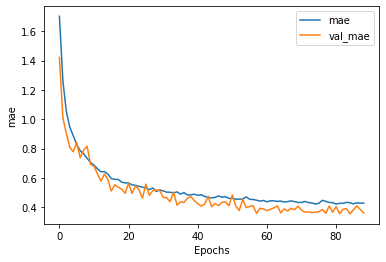

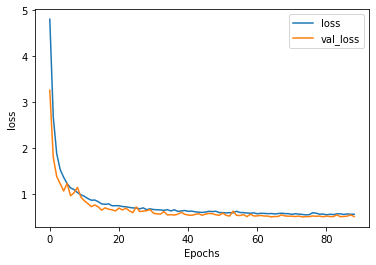

In [73]:
es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)
history = model.fit(X_train, y_train, epochs=150, batch_size = 16, validation_split=0.3, 
                    callbacks = [es], # Call checkpoint variable if neccessary
                    verbose=2)

plot_graphs(history, "mae")
plot_graphs(history, "loss")

In [74]:
scores = model.evaluate(
    X_test, y_test, batch_size=1, verbose=1, sample_weight=None, steps=None,
    callbacks=None, max_queue_size=10, workers=4, use_multiprocessing=False,
    return_dict=False
)
print("------------------ EVALUATION FINISHED! ------------------".center(115))
for i in range(len(scores)):
    print("%s: %.2f%%" % (model.metrics_names[i], scores[i]*100))

3360/3360 [==============================] - 3s 797us/step - loss: 0.5434 - mae: 0.3732
                             ------------------ EVALUATION FINISHED! ------------------                            
loss: 54.34%
mae: 37.32%


In [75]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
from sklearn.metrics import mean_squared_error
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]

In [76]:
from sklearn.metrics import classification_report, f1_score
y_pred = model.predict(X_test)
for i in range(8):
    print("Column", df.columns[1:][i])
    estimates = [round(float(x)) for x in y_pred[:,i]]
    estimates = transform_results(estimates)
    print(np.unique(estimates))
    acc.append(accuracy_score(y_test[:,i], estimates))
    pre.append(precision_score(y_test[:,i], estimates,average='weighted'))
    recal.append(recall_score(y_test[:,i], estimates,average='weighted'))
    f1.append(f1_score(y_test[:,i], estimates,average='weighted'))
    rms.append(np.sqrt(mean_squared_error(y_test[:,i], estimates)))
    aucscore.append(score_auc(y_test[:,i], estimates))
    print(classification_report(y_test[:,i], estimates), "\n------")

Column obstructive<==>supportive
[1 2 3 4 5 6 7]
              precision    recall  f1-score   support

         1.0       0.95      0.87      0.91       462
         2.0       0.68      0.43      0.53       482
         3.0       0.52      0.72      0.60       510
         4.0       0.64      0.67      0.65       517
         5.0       0.62      0.66      0.64       467
         6.0       0.72      0.67      0.70       470
         7.0       0.82      0.81      0.82       452

    accuracy                           0.69      3360
   macro avg       0.71      0.69      0.69      3360
weighted avg       0.70      0.69      0.69      3360
 
------
Column complicated<==>easy
[1 2 3 4 5 6 7]
              precision    recall  f1-score   support

         1.0       0.96      0.88      0.92       463
         2.0       0.72      0.53      0.61       485
         3.0       0.56      0.73      0.63       501
         4.0       0.66      0.68      0.67       515
         5.0       0.68      0.7

In [77]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE -score :{}".format(np.mean(rms)))
print("average AUC -score :{}".format(np.mean(aucscore)))
metric_df['Neural Network classifier 2'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.8002976190476191
average Precision :0.8081518331350235
average Recall :0.8002976190476191
average F1 -score :0.800608900131469
average RMSE -score :0.6910628449200209
average AUC -score :0.8830736093591272


# 4.6 LSTM 

In [78]:
## Callbacks
es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=7)

checkpoint = tf.keras.callbacks.ModelCheckpoint(
  "model_checkpoints", monitor="val_loss", verbose=1, save_best_only=True, mode="min")

## Optimizer
opt = tf.keras.optimizers.Adam(learning_rate=0.001)

LSTM_model = tf.keras.Sequential([
    tf.keras.layers.Embedding(4000, 128),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(128)),
    #tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32)),
    # use ReLU in place of tanh function since they are very good alternatives of each other.
    tf.keras.layers.Dense(64, activation='relu', 
                          
                          # Prevent overfitting
                          kernel_regularizer=tf.keras.regularizers.L2(l2=0.01), 

                          # Ensuring consistent outputs and not run into potential local optima
                          # Avoid initializing standard normal (mean = 0, std = 1) to reach faster convergence and less initial loss.
                          kernel_initializer=tf.keras.initializers.RandomNormal(seed=42)
                          
                          ),
     
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(8, activation='linear')
])
LSTM_model.summary()

LSTM_model.compile(loss=tf.keras.losses.MeanSquaredError(), optimizer= opt, metrics=['mae'])

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_1 (Embedding)      (None, None, 128)         512000    
_________________________________________________________________
bidirectional_1 (Bidirection (None, 256)               263168    
_________________________________________________________________
dense_18 (Dense)             (None, 64)                16448     
_________________________________________________________________
dropout_10 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_19 (Dense)             (None, 8)                 520       
Total params: 792,136
Trainable params: 792,136
Non-trainable params: 0
_________________________________________________________________


In [79]:
history = LSTM_model.fit(X_train, y_train, epochs=100, batch_size = 512, validation_split=0.2, 
                    callbacks = [es], # Call checkpoint variable if neccessary
                    verbose=1)

Epoch 1/100
21/21 [==============================] - 7s 241ms/step - loss: 14.5513 - mae: 3.1819 - val_loss: 4.5479 - val_mae: 1.7627
Epoch 2/100
21/21 [==============================] - 5s 229ms/step - loss: 5.4067 - mae: 1.9033 - val_loss: 4.1496 - val_mae: 1.7057
Epoch 3/100
21/21 [==============================] - 5s 217ms/step - loss: 4.9482 - mae: 1.8416 - val_loss: 4.0305 - val_mae: 1.6874
Epoch 4/100
21/21 [==============================] - 5s 220ms/step - loss: 4.5512 - mae: 1.7686 - val_loss: 3.4934 - val_mae: 1.5446
Epoch 5/100
21/21 [==============================] - 5s 218ms/step - loss: 3.2313 - mae: 1.3773 - val_loss: 1.8318 - val_mae: 0.9729
Epoch 6/100
21/21 [==============================] - 5s 216ms/step - loss: 1.8363 - mae: 0.9785 - val_loss: 1.1360 - val_mae: 0.7084
Epoch 7/100
21/21 [==============================] - 5s 216ms/step - loss: 1.4321 - mae: 0.8225 - val_loss: 0.9102 - val_mae: 0.5429
Epoch 8/100
21/21 [==============================] - 4s 215ms/step -

21/21 [==============================] - 5s 219ms/step - loss: 0.6457 - mae: 0.4928 - val_loss: 0.5333 - val_mae: 0.3586
Epoch 63/100
21/21 [==============================] - 5s 220ms/step - loss: 0.6537 - mae: 0.4959 - val_loss: 0.5278 - val_mae: 0.3779
Epoch 64/100
21/21 [==============================] - 5s 219ms/step - loss: 0.6392 - mae: 0.4893 - val_loss: 0.5245 - val_mae: 0.3516
Epoch 65/100
21/21 [==============================] - 5s 219ms/step - loss: 0.6416 - mae: 0.4916 - val_loss: 0.5200 - val_mae: 0.3714
Epoch 66/100
21/21 [==============================] - 5s 219ms/step - loss: 0.6431 - mae: 0.4905 - val_loss: 0.5166 - val_mae: 0.3487
Epoch 67/100
21/21 [==============================] - 5s 219ms/step - loss: 0.6333 - mae: 0.4860 - val_loss: 0.5207 - val_mae: 0.3656
Epoch 68/100
21/21 [==============================] - 5s 217ms/step - loss: 0.6341 - mae: 0.4865 - val_loss: 0.5237 - val_mae: 0.3435
Epoch 69/100
21/21 [==============================] - 5s 227ms/step - loss:

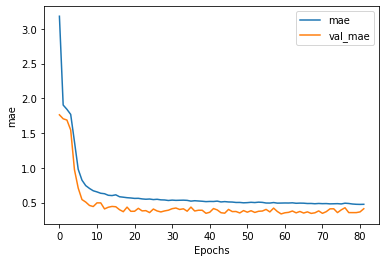

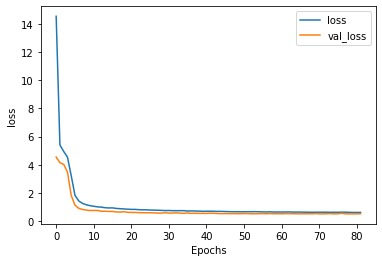

In [80]:
plot_graphs(history, "mae")
plot_graphs(history, "loss")

In [81]:
scores = LSTM_model.evaluate(
    X_test, y_test, batch_size=1, verbose=1, sample_weight=None, steps=None,
    callbacks=None, max_queue_size=10, workers=4, use_multiprocessing=False,
    return_dict=False
)
print("------------------ EVALUATION FINISHED! ------------------".center(115))
for i in range(len(scores)):
    print("%s: %.2f%%" % (model.metrics_names[i], scores[i]*100))

3360/3360 [==============================] - 6s 2ms/step - loss: 0.5381 - mae: 0.4194
                             ------------------ EVALUATION FINISHED! ------------------                            
loss: 53.81%
mae: 41.94%


In [82]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
from sklearn.metrics import mean_squared_error
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]

In [83]:
from sklearn.metrics import classification_report, f1_score
y_pred = LSTM_model.predict(X_test)
for i in range(8):
    print("Column", df.columns[1:][i])
    estimates = [round(float(x)) for x in y_pred[:,i]]
    estimates = transform_results(estimates)
    print(np.unique(estimates))
    acc.append(accuracy_score(y_test[:,i], estimates))
    pre.append(precision_score(y_test[:,i], estimates,average='weighted'))
    recal.append(recall_score(y_test[:,i], estimates,average='weighted'))
    f1.append(f1_score(y_test[:,i], estimates,average='weighted'))
    rms.append(np.sqrt(mean_squared_error(y_test[:,i], estimates)))
    aucscore.append(score_auc(y_test[:,i], estimates))
    print(classification_report(y_test[:,i], estimates), "\n------")

Column obstructive<==>supportive
[1 2 3 4 5 6 7]
              precision    recall  f1-score   support

         1.0       0.94      0.58      0.71       462
         2.0       0.50      0.51      0.51       482
         3.0       0.55      0.70      0.62       510
         4.0       0.65      0.72      0.68       517
         5.0       0.62      0.65      0.63       467
         6.0       0.74      0.67      0.70       470
         7.0       0.82      0.81      0.82       452

    accuracy                           0.66      3360
   macro avg       0.69      0.66      0.67      3360
weighted avg       0.68      0.66      0.66      3360
 
------
Column complicated<==>easy
[1 2 3 4 5 6 7]
              precision    recall  f1-score   support

         1.0       0.95      0.72      0.82       463
         2.0       0.62      0.59      0.61       485
         3.0       0.59      0.71      0.64       501
         4.0       0.67      0.74      0.70       515
         5.0       0.70      0.7

In [84]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE -score :{}".format(np.mean(rms)))
print("average AUC -score :{}".format(np.mean(aucscore)))
metric_df['Bidirectional LSTM 2'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.7912574404761905
average Precision :0.8019577634960888
average Recall :0.7912574404761905
average F1 -score :0.7928969648672743
average RMSE -score :0.681793868277493
average AUC -score :0.8778168374843642


# 4.7 Ensemble

In [85]:
from sklearn.model_selection import cross_val_score
from sklearn.datasets import make_blobs
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier


# 4.7.1 Decison tree classifier

For column: obstructive<==>supportive
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       462
         2.0       0.82      0.89      0.85       482
         3.0       0.74      0.71      0.73       510
         4.0       0.66      0.64      0.65       517
         5.0       0.64      0.66      0.65       467
         6.0       0.73      0.70      0.72       470
         7.0       0.82      0.81      0.82       452

    accuracy                           0.77      3360
   macro avg       0.77      0.77      0.77      3360
weighted avg       0.76      0.77      0.76      3360

Confusion Matrix: 
 [[442  20   0   0   0   0   0]
 [  0 430  48   0   1   3   0]
 [  0  23 363 119   3   2   0]
 [  0   1  37 333 145   1   0]
 [  4   3  16  29 308 107   0]
 [  3  20  10   9  17 328  83]
 [ 10  29  17  11  11   6 368]]
Accuracy Score : 0.7654761904761904
Precision Score : 0.7648401413805322
Recall Score : 0.7654761904761904
F1 Score : 0.7647632

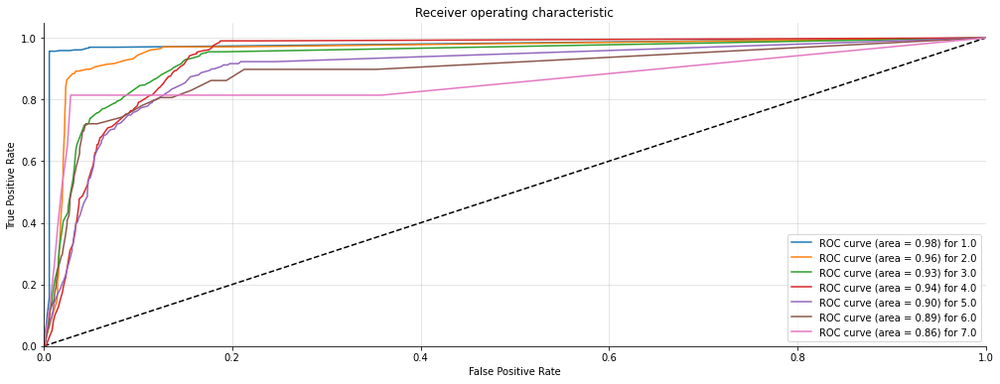

(3360, 7) (3360, 7)


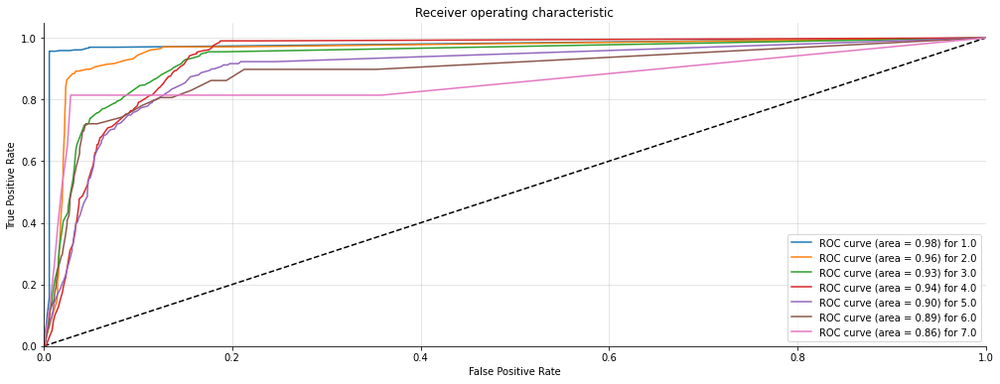

For column: complicated<==>easy
              precision    recall  f1-score   support

         1.0       0.96      0.95      0.96       463
         2.0       0.82      0.89      0.85       485
         3.0       0.75      0.72      0.73       501
         4.0       0.70      0.67      0.68       515
         5.0       0.71      0.75      0.73       460
         6.0       0.83      0.79      0.81       484
         7.0       0.90      0.90      0.90       452

    accuracy                           0.81      3360
   macro avg       0.81      0.81      0.81      3360
weighted avg       0.81      0.81      0.81      3360

Confusion Matrix: 
 [[442  20   0   0   0   1   0]
 [  0 431  48   0   1   3   2]
 [  0  22 360 117   2   0   0]
 [  0   2  40 343 128   2   0]
 [  3  16  13  14 344  70   0]
 [  5  17  16  13   6 384  43]
 [  9  18   6   4   5   2 408]]
Accuracy Score : 0.8071428571428572
Precision Score : 0.8069703832895823
Recall Score : 0.8071428571428572
F1 Score : 0.8066166557692

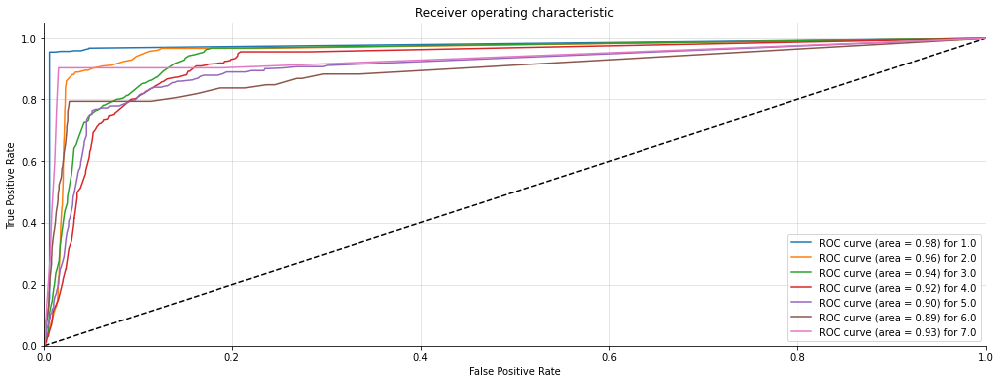

(3360, 7) (3360, 7)


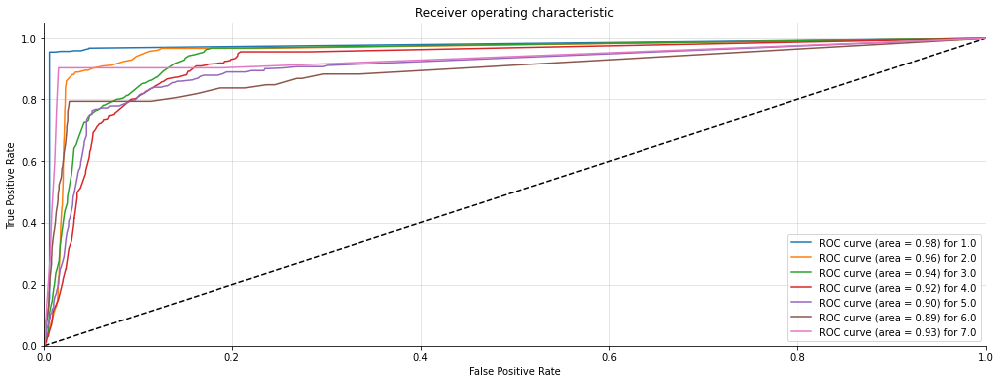

For column: inefficient<==>efficient
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       462
         2.0       0.82      0.89      0.86       482
         3.0       0.74      0.72      0.73       506
         4.0       0.68      0.64      0.66       526
         5.0       0.64      0.68      0.66       458
         6.0       0.72      0.68      0.70       475
         7.0       0.83      0.83      0.83       451

    accuracy                           0.77      3360
   macro avg       0.77      0.77      0.77      3360
weighted avg       0.77      0.77      0.77      3360

Confusion Matrix: 
 [[442  19   0   0   0   1   0]
 [  0 431  48   0   1   2   0]
 [  0  22 362 118   2   2   0]
 [  0   2  41 338 145   0   0]
 [  2   4   8  19 313 112   0]
 [  6  19  19  12  18 324  77]
 [  9  29  13  11   9   6 374]]
Accuracy Score : 0.7690476190476191
Precision Score : 0.7684381651443967
Recall Score : 0.7690476190476191
F1 Score : 0.76822269

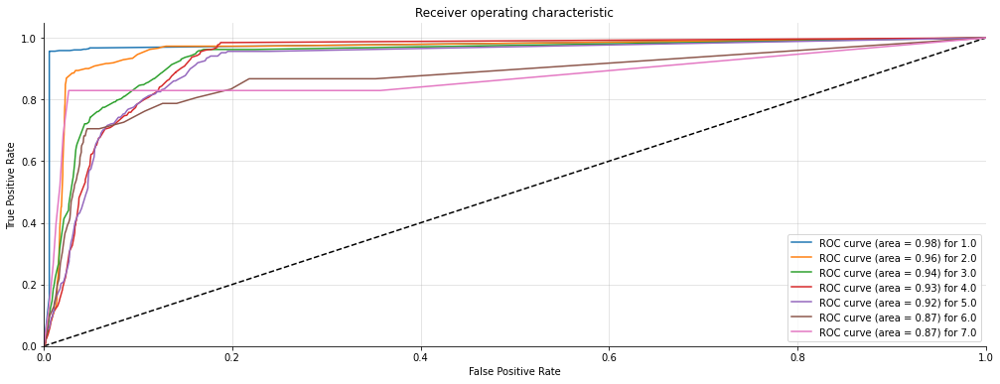

(3360, 7) (3360, 7)


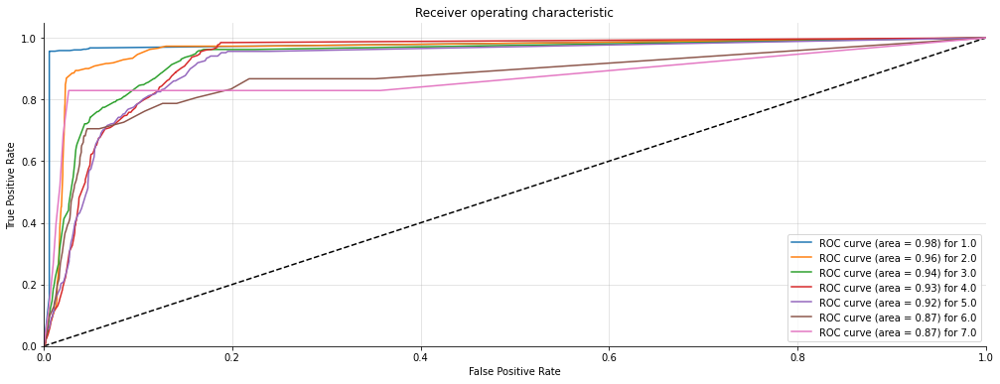

For column:  confusing<==>clear
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       461
         2.0       0.82      0.88      0.85       488
         3.0       0.75      0.72      0.73       506
         4.0       0.68      0.66      0.67       516
         5.0       0.65      0.69      0.67       456
         6.0       0.73      0.70      0.71       471
         7.0       0.81      0.79      0.80       462

    accuracy                           0.77      3360
   macro avg       0.77      0.77      0.77      3360
weighted avg       0.77      0.77      0.77      3360

Confusion Matrix: 
 [[442  19   0   0   0   0   0]
 [  0 431  49   1   3   4   0]
 [  0  23 362 120   0   1   0]
 [  0   0  27 342 145   2   0]
 [  2   2  10  19 315 108   0]
 [  2  15  16   9  15 328  86]
 [ 13  36  20  14  10   4 365]]
Accuracy Score : 0.7693452380952381
Precision Score : 0.7695090874333913
Recall Score : 0.7693452380952381
F1 Score : 0.7689978722677

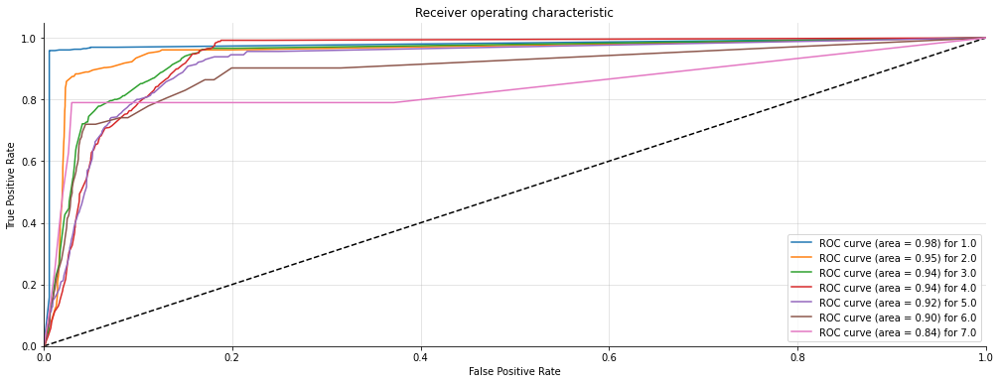

(3360, 7) (3360, 7)


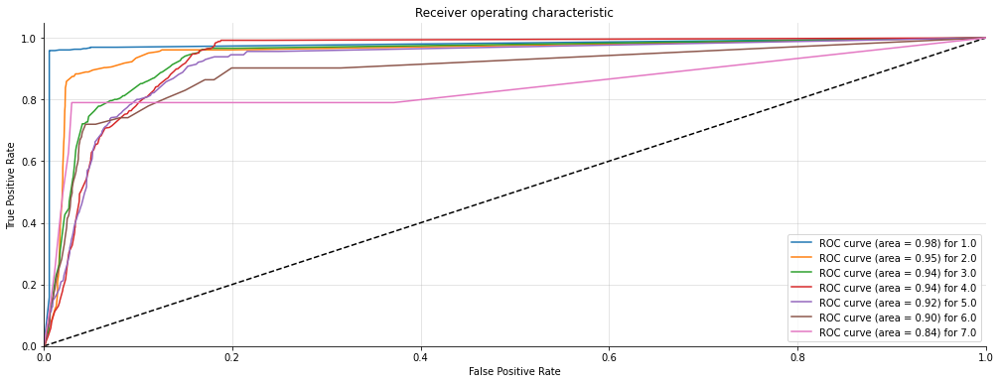

For column: boring<==>exciting
              precision    recall  f1-score   support

         1.0       0.96      0.95      0.96       463
         2.0       0.86      0.89      0.87       491
         3.0       0.83      0.80      0.81       487
         4.0       0.86      0.87      0.87       518
         5.0       0.92      0.92      0.92       487
         6.0       0.96      0.96      0.96       462
         7.0       0.99      0.99      0.99       452

    accuracy                           0.91      3360
   macro avg       0.91      0.91      0.91      3360
weighted avg       0.91      0.91      0.91      3360

Confusion Matrix: 
 [[442  18   1   0   1   1   0]
 [  5 435  45   2   1   3   0]
 [  7  31 389  58   2   0   0]
 [  3  15  17 450  32   1   0]
 [  1   6  10   9 450  11   0]
 [  1   3   4   2   4 443   5]
 [  0   0   2   0   1   3 446]]
Accuracy Score : 0.9092261904761905
Precision Score : 0.9091723973811118
Recall Score : 0.9092261904761905
F1 Score : 0.90910968072350

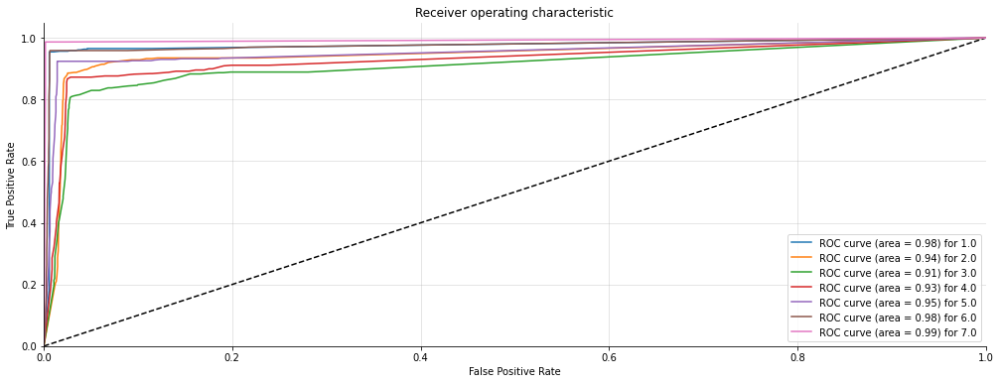

(3360, 7) (3360, 7)


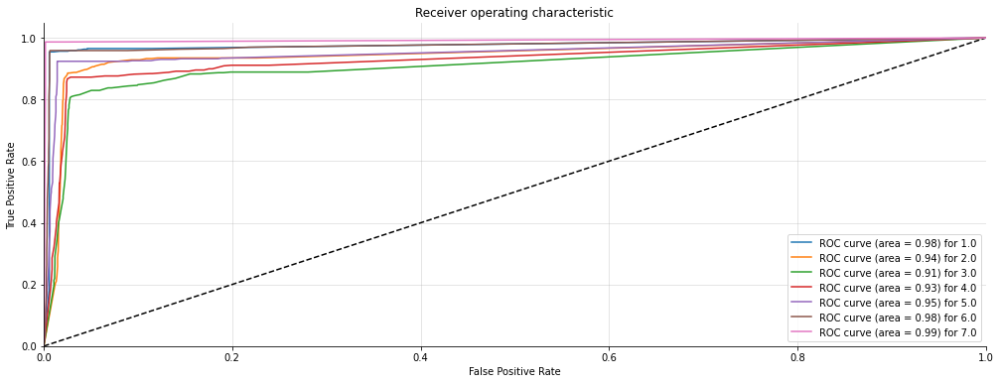

For column: not interesting<==>interesting
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       461
         2.0       0.85      0.87      0.86       495
         3.0       0.81      0.78      0.80       490
         4.0       0.83      0.83      0.83       519
         5.0       0.89      0.91      0.90       481
         6.0       0.96      0.96      0.96       465
         7.0       0.99      0.99      0.99       449

    accuracy                           0.90      3360
   macro avg       0.90      0.90      0.90      3360
weighted avg       0.90      0.90      0.90      3360

Confusion Matrix: 
 [[442  18   1   0   0   0   0]
 [  5 432  50   2   2   4   0]
 [  7  31 382  69   0   1   0]
 [  3  17  20 432  47   0   0]
 [  1   7  12  14 436  11   0]
 [  1   3   3   2   6 445   5]
 [  0   0   2   0   0   1 446]]
Accuracy Score : 0.8973214285714286
Precision Score : 0.8970708551297705
Recall Score : 0.8973214285714286
F1 Score : 0.89

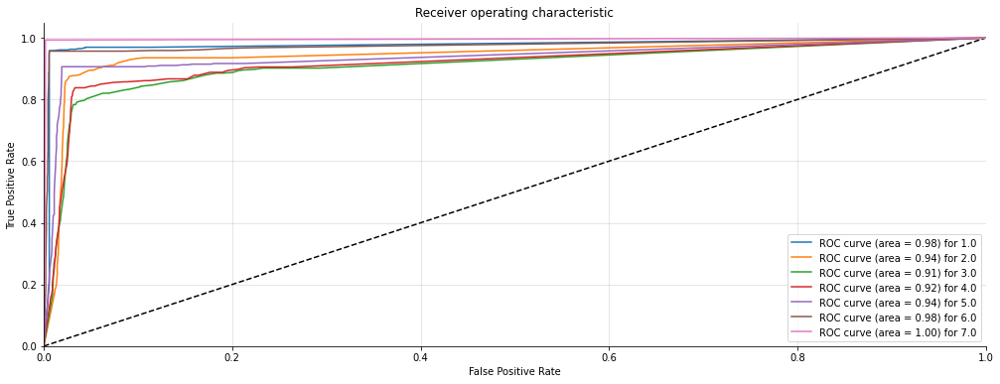

(3360, 7) (3360, 7)


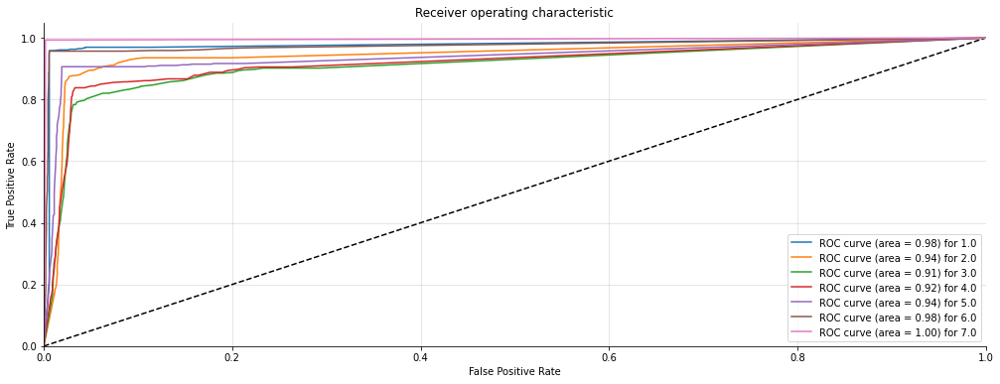

For column: conventional<==>inventive
              precision    recall  f1-score   support

         1.0       0.99      0.99      0.99       460
         2.0       0.96      0.95      0.96       502
         3.0       0.94      0.95      0.94       474
         4.0       0.96      0.95      0.95       527
         5.0       0.97      0.98      0.97       486
         6.0       0.98      0.99      0.99       459
         7.0       1.00      1.00      1.00       452

    accuracy                           0.97      3360
   macro avg       0.97      0.97      0.97      3360
weighted avg       0.97      0.97      0.97      3360

Confusion Matrix: 
 [[454   6   0   0   0   0   0]
 [  6 478  15   2   1   0   0]
 [  0  13 448  13   0   0   0]
 [  0   1  12 500  10   4   0]
 [  0   0   0   8 476   2   0]
 [  0   0   0   0   4 455   0]
 [  0   0   0   0   0   1 451]]
Accuracy Score : 0.9708333333333333
Precision Score : 0.9708090759968673
Recall Score : 0.9708333333333333
F1 Score : 0.9708113

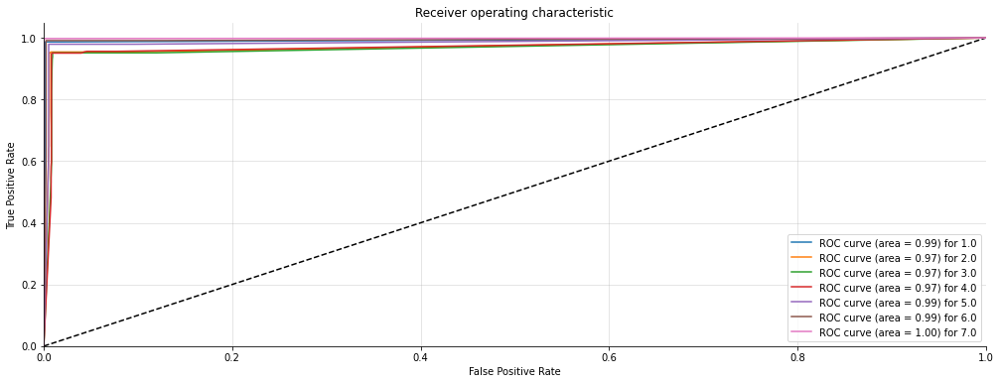

(3360, 7) (3360, 7)


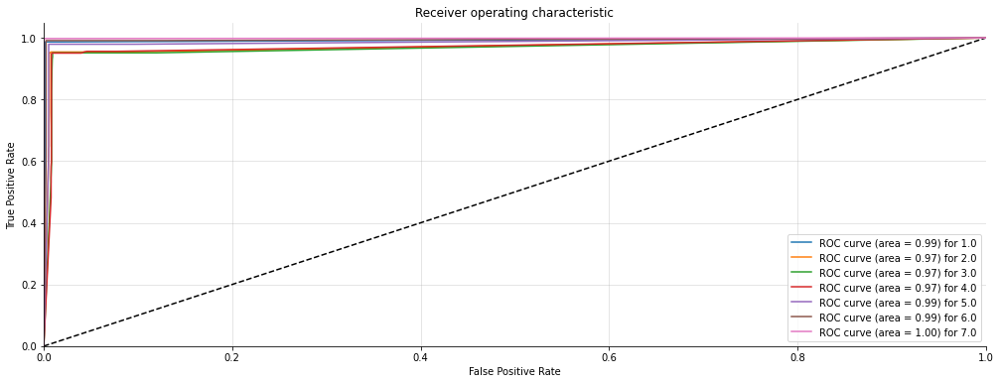

For column: usual<==>leading edge
              precision    recall  f1-score   support

         1.0       1.00      1.00      1.00       459
         2.0       1.00      1.00      1.00       496
         3.0       1.00      1.00      1.00       478
         4.0       1.00      1.00      1.00       523
         5.0       1.00      1.00      1.00       491
         6.0       1.00      1.00      1.00       462
         7.0       1.00      1.00      1.00       451

    accuracy                           1.00      3360
   macro avg       1.00      1.00      1.00      3360
weighted avg       1.00      1.00      1.00      3360

Confusion Matrix: 
 [[459   0   0   0   0   0   0]
 [  0 496   0   0   0   0   0]
 [  0   0 478   0   0   0   0]
 [  0   0   0 523   0   0   0]
 [  0   0   0   0 491   0   0]
 [  0   0   0   0   0 462   0]
 [  0   0   0   0   0   0 451]]
Accuracy Score : 1.0
Precision Score : 1.0
Recall Score : 1.0
F1 Score : 1.0
(3360, 7) (3360, 7)


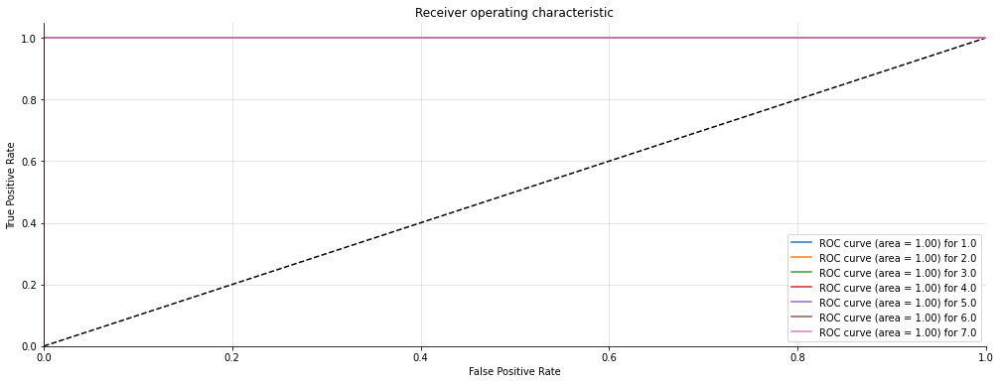

(3360, 7) (3360, 7)


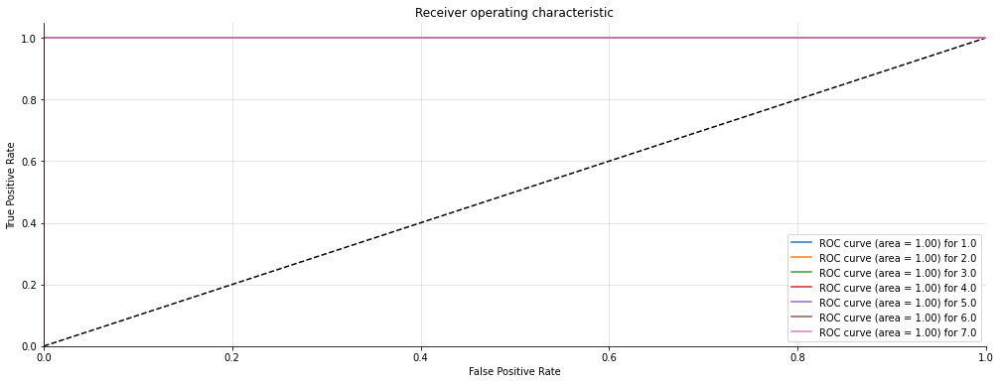

In [166]:
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]
fpo=dict()
tpo=dict()
ffpo=[]
ttpo=[]
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
def DTC(X_train, X_test, y_train, y_test, n_classes, figsize=(8, 6)):
    model = DecisionTreeClassifier(max_depth=None, min_samples_split=2,
     random_state=0)   
    model.fit(X_train, y_train)

    # predictions over test set
    predictions = [round(float(x)) for x in model.predict(X_test)]
    print((classification_report(y_test, predictions)))


    # calculating Accuracy Score, Precision Score, Recall Score and F1 Score
    print('Confusion Matrix: \n' ,confusion_matrix(y_test, predictions))
    acc.append(accuracy_score(y_test, predictions))
    print(f'Accuracy Score : {accuracy_score(y_test, predictions)}')
    pre.append(precision_score(y_test,predictions,average='weighted'))
    print('Precision Score : ' + str(precision_score(y_test,predictions,average='weighted')))
    recal.append(recall_score(y_test,predictions,average='weighted'))
    print('Recall Score : ' + str(recall_score(y_test,predictions,average='weighted')))
    f1.append(f1_score(y_test,predictions,average='weighted'))
    print('F1 Score : ' + str(f1_score(y_test,predictions,average='weighted')))
    aucscore.append(score_auc(y_test,predictions))
    rms.append(np.sqrt(mean_squared_error(y_test,predictions)))
    fpo,tpo=plot_multiclass_roc(model, X_test, y_test, n_classes)
    ffpo.append(fpo)
    ttpo.append(tpo)


    plot_multiclass_roc(model, X_test, y_test, n_classes)

for i in range(8):
  print('For column:', df.columns[1:][i])
  n_classes = len(np.unique(df[df.columns[1:][i]]))
  DTC(X_train, X_test, y_train[:,i], y_test[:,i], n_classes, figsize=(8, 6))

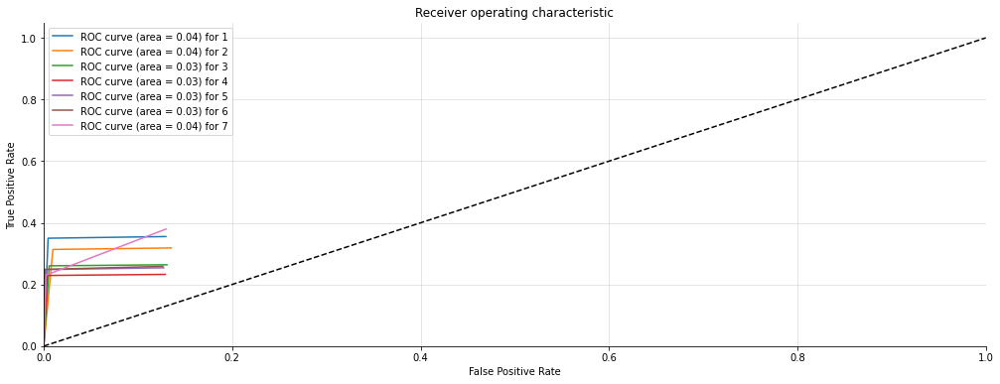

In [167]:
fsum0=list(np.array(dadd(dadd(dadd(ffpo[0][0],ffpo[1][0]),dadd(ffpo[2][0],ffpo[3][0])),dadd(dadd(ffpo[4][0],ffpo[5][0]),dadd(ffpo[6][0],ffpo[7][0]))))/8)
fsum1=list(np.array(dadd(dadd(dadd(ffpo[0][1],ffpo[1][1]),dadd(ffpo[2][1],ffpo[3][1])),dadd(dadd(ffpo[4][1],ffpo[5][1]),dadd(ffpo[6][1],ffpo[7][1]))))/8)
fsum2=list(np.array(dadd(dadd(dadd(ffpo[0][2],ffpo[1][2]),dadd(ffpo[2][2],ffpo[3][2])),dadd(dadd(ffpo[4][2],ffpo[5][2]),dadd(ffpo[6][2],ffpo[7][2]))))/8)
fsum3=list(np.array(dadd(dadd(dadd(ffpo[0][3],ffpo[1][3]),dadd(ffpo[2][3],ffpo[3][3])),dadd(dadd(ffpo[4][3],ffpo[5][3]),dadd(ffpo[6][3],ffpo[7][3]))))/8)
fsum4=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][4]),dadd(ffpo[2][4],ffpo[3][4])),dadd(dadd(ffpo[4][4],ffpo[5][4]),dadd(ffpo[6][4],ffpo[7][4]))))/8)
fsum5=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][5]),dadd(ffpo[2][5],ffpo[3][5])),dadd(dadd(ffpo[4][5],ffpo[5][5]),dadd(ffpo[6][5],ffpo[7][5]))))/8)
fsum6=list(np.array(dadd(dadd(dadd(ffpo[0][6],ffpo[1][6]),dadd(ffpo[2][6],ffpo[3][6])),dadd(dadd(ffpo[4][6],ffpo[5][6]),dadd(ffpo[6][6],ffpo[7][6]))))/8)

fpr=dict()

fpr[0]=fsum0
fpr[1]=fsum1
fpr[2]=fsum2
fpr[3]=fsum3
fpr[4]=fsum4
fpr[5]=fsum5
fpr[6]=fsum6


tsum0=list(np.array(dadd(dadd(dadd(ttpo[0][0],ttpo[1][0]),dadd(ttpo[2][0],ttpo[3][0])),dadd(dadd(ttpo[4][0],ttpo[5][0]),dadd(ttpo[6][0],ttpo[7][0]))))/8)
tsum1=list(np.array(dadd(dadd(dadd(ttpo[0][1],ttpo[1][1]),dadd(ttpo[2][1],ttpo[3][1])),dadd(dadd(ttpo[4][1],ttpo[5][1]),dadd(ttpo[6][1],ttpo[7][1]))))/8)
tsum2=list(np.array(dadd(dadd(dadd(ttpo[0][2],ttpo[1][2]),dadd(ttpo[2][2],ttpo[3][2])),dadd(dadd(ttpo[4][2],ttpo[5][2]),dadd(ttpo[6][2],ttpo[7][2]))))/8)
tsum3=list(np.array(dadd(dadd(dadd(ttpo[0][3],ttpo[1][3]),dadd(ttpo[2][3],ttpo[3][3])),dadd(dadd(ttpo[4][3],ttpo[5][3]),dadd(ttpo[6][3],ttpo[7][3]))))/8)
tsum4=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][4]),dadd(ttpo[2][4],ttpo[3][4])),dadd(dadd(ttpo[4][4],ttpo[5][4]),dadd(ttpo[6][4],ttpo[7][4]))))/8)
tsum5=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][5]),dadd(ttpo[2][5],ttpo[3][5])),dadd(dadd(ttpo[4][5],ttpo[5][5]),dadd(ttpo[6][5],ttpo[7][5]))))/8)
tsum6=list(np.array(dadd(dadd(dadd(ttpo[0][6],ttpo[1][6]),dadd(ttpo[2][6],ttpo[3][6])),dadd(dadd(ttpo[4][6],ttpo[5][6]),dadd(ttpo[6][6],ttpo[7][6]))))/8)

tpr=dict()

tpr[0]=tsum0
tpr[1]=tsum1
tpr[2]=tsum2
tpr[3]=tsum3
tpr[4]=tsum4
tpr[5]=tsum5
tpr[6]=tsum6

plot_multiclass_roc_avg(fpr,tpr,7)

In [168]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE :{}".format(np.mean(rms)))
print("average AUC score {}".format(np.mean(aucscore)))
metric_df['DecisionTreeclasssifier'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.8610491071428572
average Precision :0.8608512632194565
average Recall :0.8610491071428572
average F1 -score :0.860703707552545
average RMSE :0.6020191032365887
average AUC score 0.9187558124662669


# 4.7.2 Random forest classifier

For column: obstructive<==>supportive
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       462
         2.0       0.84      0.88      0.86       482
         3.0       0.74      0.73      0.73       510
         4.0       0.67      0.66      0.66       517
         5.0       0.64      0.67      0.65       467
         6.0       0.73      0.70      0.71       470
         7.0       0.80      0.81      0.81       452

    accuracy                           0.77      3360
   macro avg       0.77      0.77      0.77      3360
weighted avg       0.77      0.77      0.77      3360

Confusion Matrix: 
 [[442  19   0   0   0   0   1]
 [  0 424  51   0   1   4   2]
 [  0  10 370 121   3   2   4]
 [  0   1  31 339 145   1   0]
 [  4   3  16  26 311 107   0]
 [  3  19  11   9  17 328  83]
 [ 10  26  20  11  11   6 368]]
Accuracy Score : 0.768452380952381
Precision Score : 0.768281345800532
Recall Score : 0.768452380952381
F1 Score : 0.7681833811

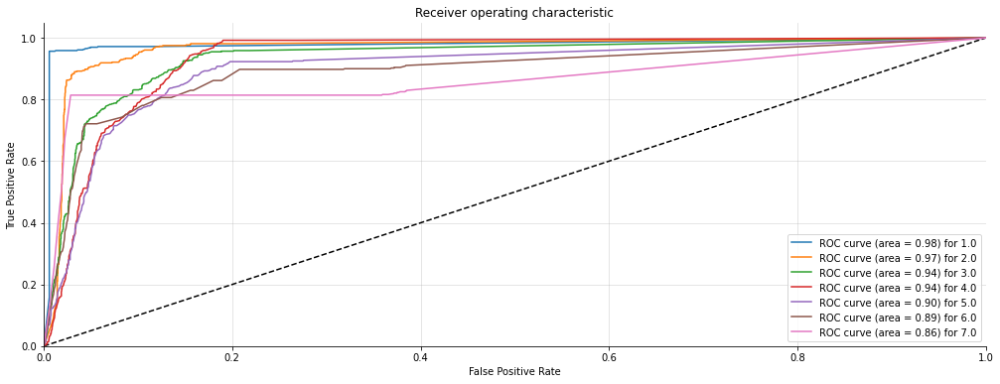

(3360, 7) (3360, 7)


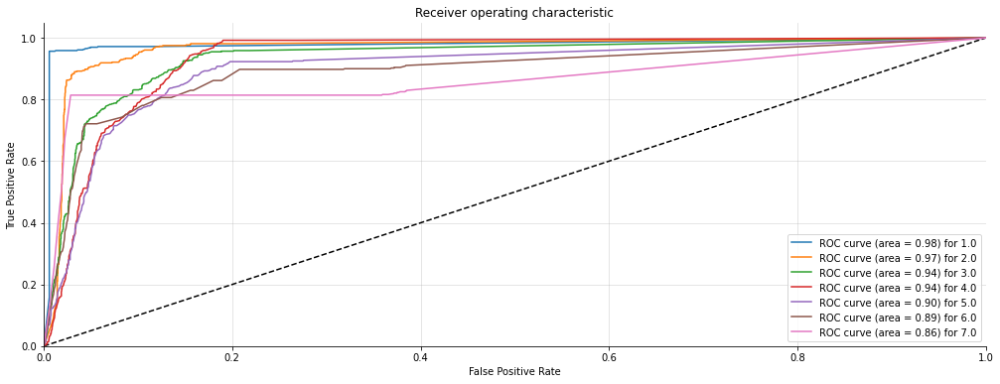

For column: complicated<==>easy
              precision    recall  f1-score   support

         1.0       0.96      0.95      0.96       463
         2.0       0.85      0.88      0.86       485
         3.0       0.74      0.73      0.74       501
         4.0       0.70      0.67      0.69       515
         5.0       0.71      0.75      0.73       460
         6.0       0.82      0.79      0.81       484
         7.0       0.90      0.90      0.90       452

    accuracy                           0.81      3360
   macro avg       0.81      0.81      0.81      3360
weighted avg       0.81      0.81      0.81      3360

Confusion Matrix: 
 [[442  19   0   0   0   2   0]
 [  0 425  51   0   1   6   2]
 [  0   9 368 118   2   3   1]
 [  0   2  36 347 128   2   0]
 [  3  12  17  14 344  70   0]
 [  5  17  16  13   6 384  43]
 [  9  18   6   4   5   2 408]]
Accuracy Score : 0.8089285714285714
Precision Score : 0.808942600019511
Recall Score : 0.8089285714285714
F1 Score : 0.80874895322492

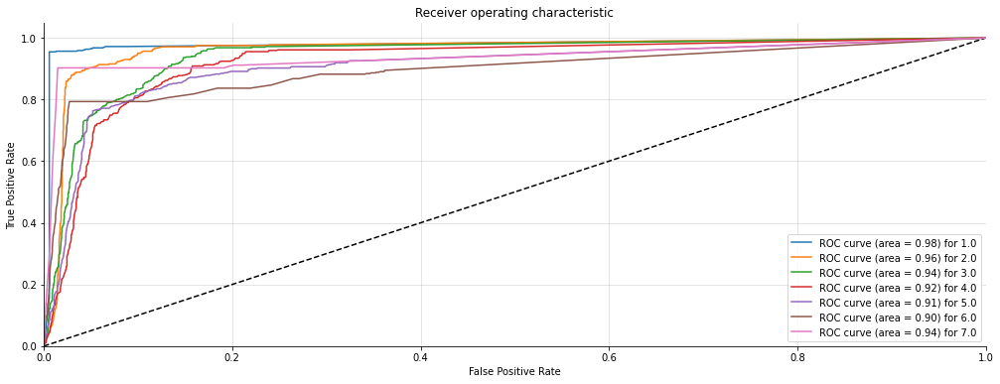

(3360, 7) (3360, 7)


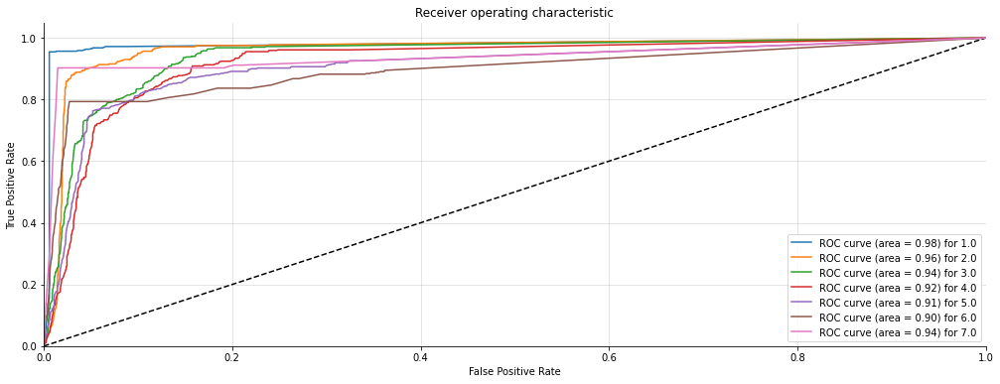

For column: inefficient<==>efficient
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       462
         2.0       0.84      0.88      0.86       482
         3.0       0.74      0.73      0.73       506
         4.0       0.68      0.65      0.67       526
         5.0       0.64      0.68      0.66       458
         6.0       0.72      0.68      0.70       475
         7.0       0.82      0.83      0.83       451

    accuracy                           0.77      3360
   macro avg       0.77      0.77      0.77      3360
weighted avg       0.77      0.77      0.77      3360

Confusion Matrix: 
 [[442  18   0   0   0   2   0]
 [  0 425  51   0   1   4   1]
 [  0  11 367 120   2   3   3]
 [  0   2  35 344 145   0   0]
 [  2   4   8  19 313 112   0]
 [  6  18  20  12  18 324  77]
 [  9  27  15  11   9   6 374]]
Accuracy Score : 0.7705357142857143
Precision Score : 0.7703096590821129
Recall Score : 0.7705357142857143
F1 Score : 0.77014450

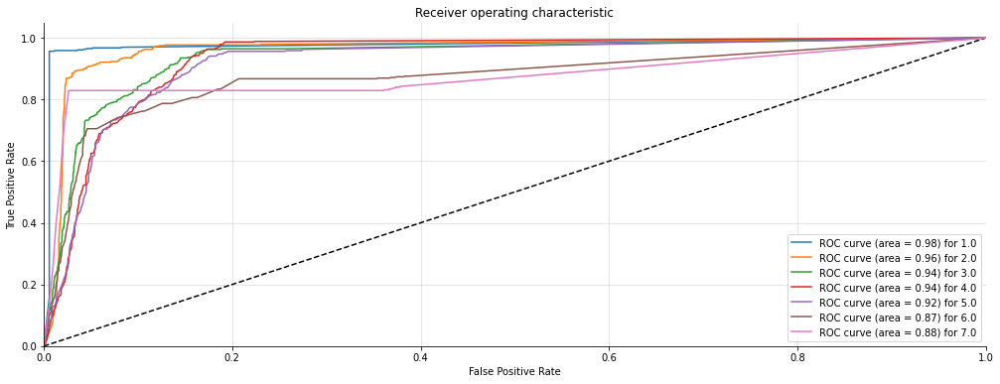

(3360, 7) (3360, 7)


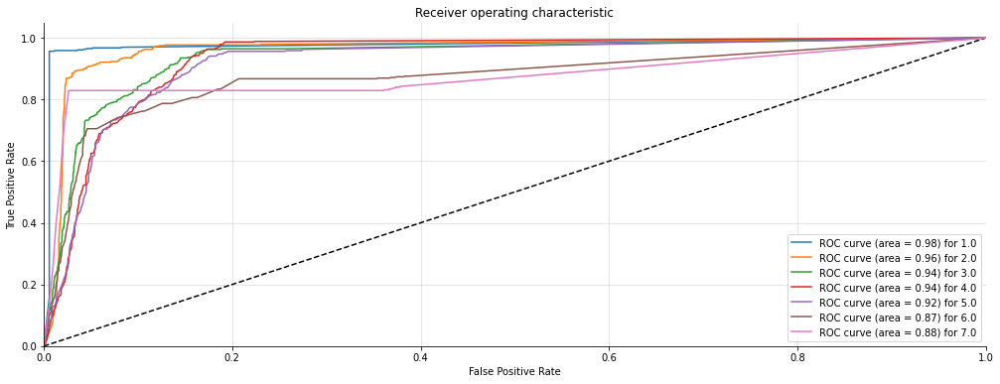

For column:  confusing<==>clear
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       461
         2.0       0.85      0.87      0.86       488
         3.0       0.75      0.73      0.74       506
         4.0       0.68      0.67      0.68       516
         5.0       0.64      0.69      0.67       456
         6.0       0.73      0.70      0.71       471
         7.0       0.81      0.79      0.80       462

    accuracy                           0.77      3360
   macro avg       0.77      0.77      0.77      3360
weighted avg       0.77      0.77      0.77      3360

Confusion Matrix: 
 [[442  18   0   0   0   1   0]
 [  0 425  52   1   3   6   1]
 [  0  10 369 122   3   1   1]
 [  0   0  21 348 145   2   0]
 [  2   2  10  19 315 108   0]
 [  2  14  17   9  15 328  86]
 [ 13  33  23  14  10   4 365]]
Accuracy Score : 0.7714285714285715
Precision Score : 0.7722358842698946
Recall Score : 0.7714285714285715
F1 Score : 0.7715978161788

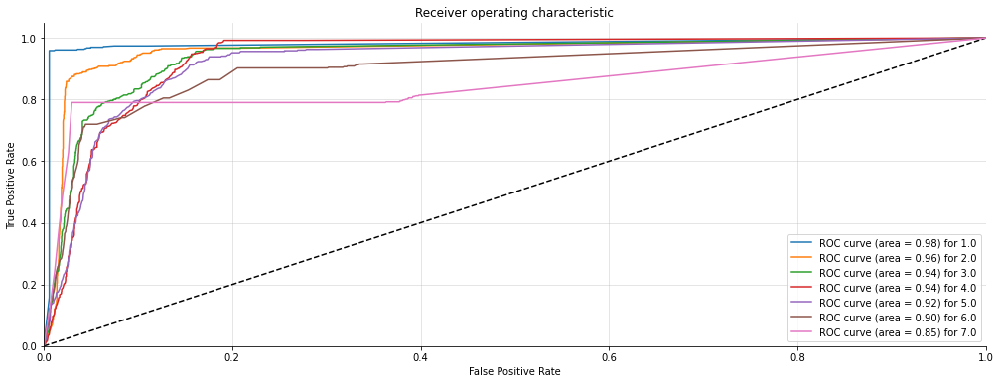

(3360, 7) (3360, 7)


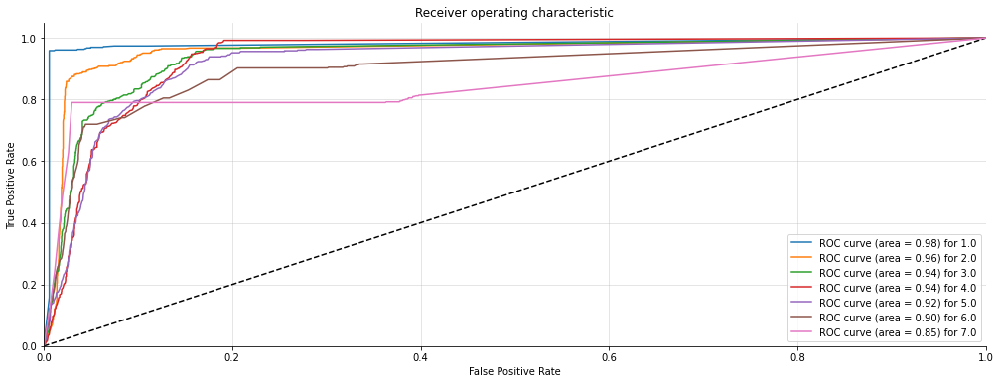

For column: boring<==>exciting
              precision    recall  f1-score   support

         1.0       0.96      0.95      0.96       463
         2.0       0.86      0.88      0.87       491
         3.0       0.83      0.80      0.81       487
         4.0       0.85      0.87      0.86       518
         5.0       0.92      0.92      0.92       487
         6.0       0.96      0.96      0.96       462
         7.0       0.99      0.99      0.99       452

    accuracy                           0.91      3360
   macro avg       0.91      0.91      0.91      3360
weighted avg       0.91      0.91      0.91      3360

Confusion Matrix: 
 [[442  17   1   1   1   1   0]
 [  5 432  45   5   1   3   0]
 [  7  29 388  61   2   0   0]
 [  3  15  17 449  32   2   0]
 [  1   5  11   9 450  11   0]
 [  1   3   4   2   4 443   5]
 [  0   0   2   0   1   3 446]]
Accuracy Score : 0.9077380952380952
Precision Score : 0.9076426859267561
Recall Score : 0.9077380952380952
F1 Score : 0.90761595754350

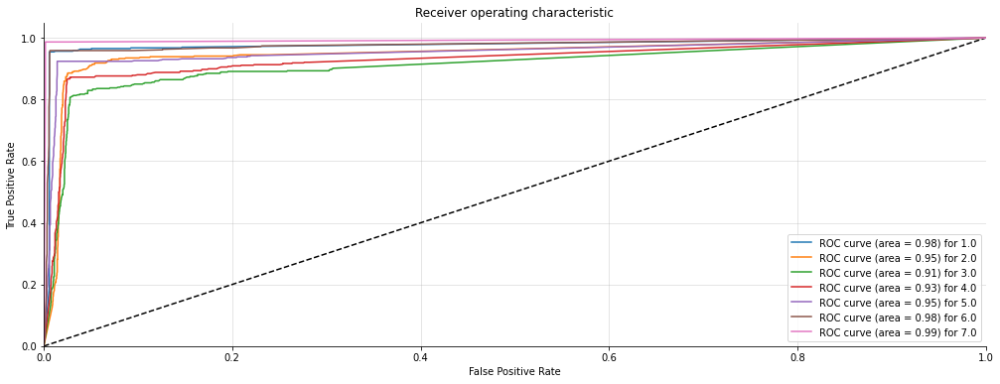

(3360, 7) (3360, 7)


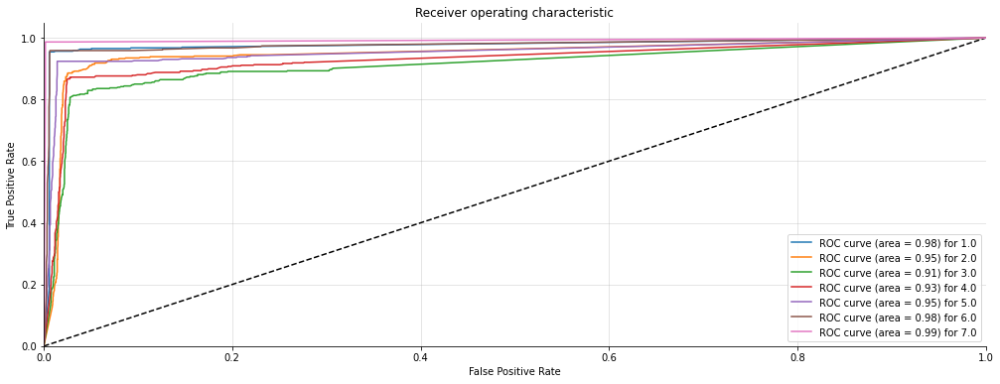

For column: not interesting<==>interesting
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       461
         2.0       0.86      0.87      0.86       495
         3.0       0.81      0.78      0.79       490
         4.0       0.83      0.83      0.83       519
         5.0       0.89      0.91      0.90       481
         6.0       0.96      0.96      0.96       465
         7.0       0.99      0.99      0.99       449

    accuracy                           0.90      3360
   macro avg       0.90      0.90      0.90      3360
weighted avg       0.90      0.90      0.90      3360

Confusion Matrix: 
 [[442  18   1   0   0   0   0]
 [  5 432  50   2   2   4   0]
 [  7  29 381  72   0   1   0]
 [  3  17  20 431  48   0   0]
 [  1   7  12  14 436  11   0]
 [  1   2   4   2   6 445   5]
 [  0   0   2   0   0   1 446]]
Accuracy Score : 0.8967261904761905
Precision Score : 0.8964564112321858
Recall Score : 0.8967261904761905
F1 Score : 0.89

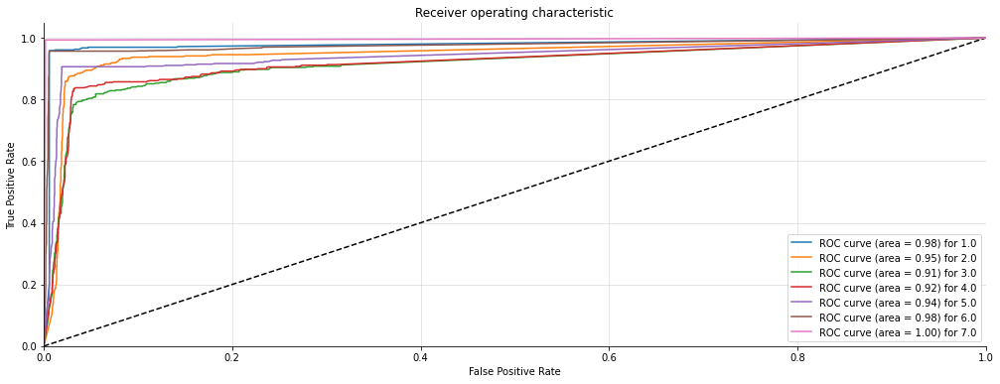

(3360, 7) (3360, 7)


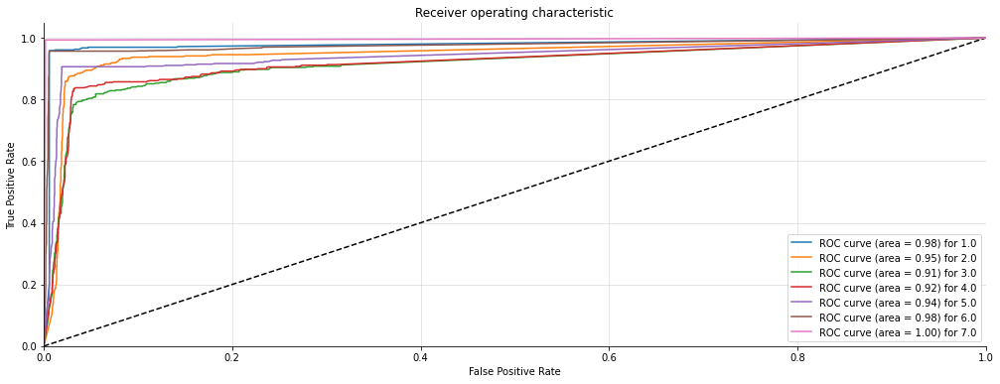

For column: conventional<==>inventive
              precision    recall  f1-score   support

         1.0       0.99      0.99      0.99       460
         2.0       0.96      0.95      0.96       502
         3.0       0.94      0.95      0.94       474
         4.0       0.96      0.95      0.95       527
         5.0       0.97      0.98      0.97       486
         6.0       0.98      0.99      0.99       459
         7.0       1.00      1.00      1.00       452

    accuracy                           0.97      3360
   macro avg       0.97      0.97      0.97      3360
weighted avg       0.97      0.97      0.97      3360

Confusion Matrix: 
 [[454   6   0   0   0   0   0]
 [  5 479  15   2   1   0   0]
 [  0  13 448  13   0   0   0]
 [  0   1  12 500  10   4   0]
 [  0   0   0   8 476   2   0]
 [  0   0   0   0   4 455   0]
 [  0   0   0   0   0   1 451]]
Accuracy Score : 0.9711309523809524
Precision Score : 0.9711154774382756
Recall Score : 0.9711309523809524
F1 Score : 0.9711141

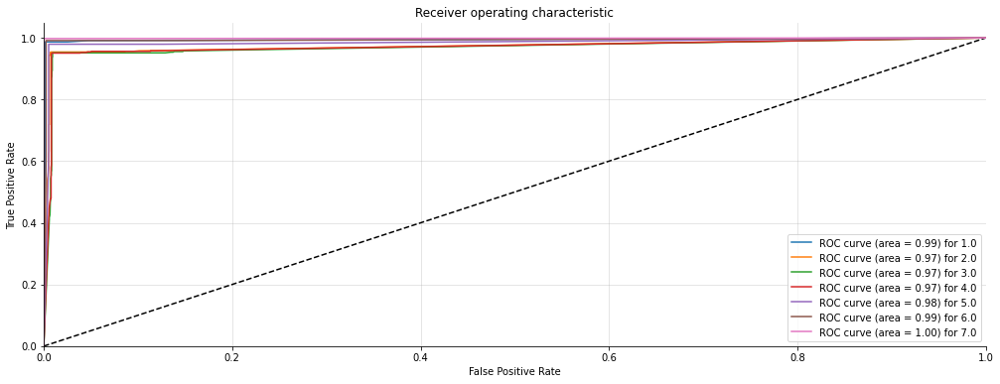

(3360, 7) (3360, 7)


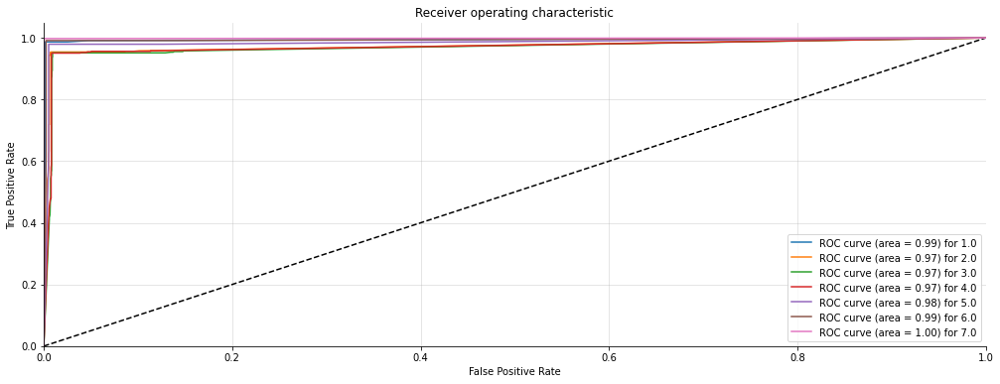

For column: usual<==>leading edge
              precision    recall  f1-score   support

         1.0       1.00      1.00      1.00       459
         2.0       1.00      1.00      1.00       496
         3.0       1.00      1.00      1.00       478
         4.0       1.00      1.00      1.00       523
         5.0       1.00      1.00      1.00       491
         6.0       1.00      1.00      1.00       462
         7.0       1.00      1.00      1.00       451

    accuracy                           1.00      3360
   macro avg       1.00      1.00      1.00      3360
weighted avg       1.00      1.00      1.00      3360

Confusion Matrix: 
 [[459   0   0   0   0   0   0]
 [  0 496   0   0   0   0   0]
 [  0   0 478   0   0   0   0]
 [  0   0   0 523   0   0   0]
 [  0   0   0   0 491   0   0]
 [  0   0   0   0   0 462   0]
 [  0   0   0   0   0   0 451]]
Accuracy Score : 1.0
Precision Score : 1.0
Recall Score : 1.0
F1 Score : 1.0
(3360, 7) (3360, 7)


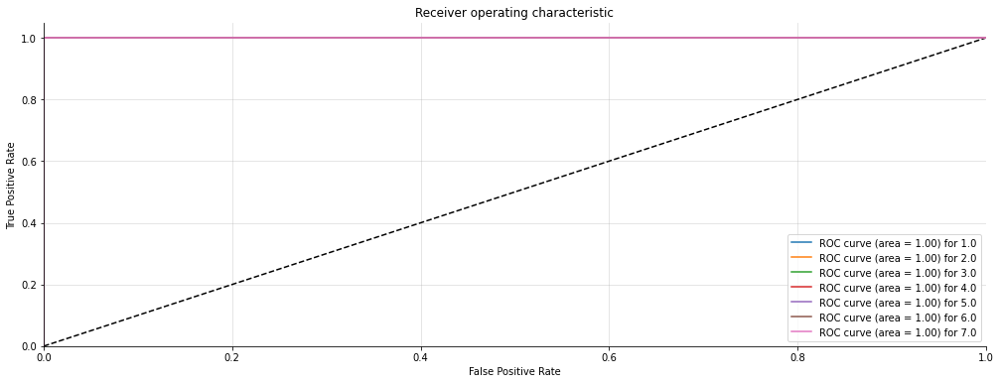

(3360, 7) (3360, 7)


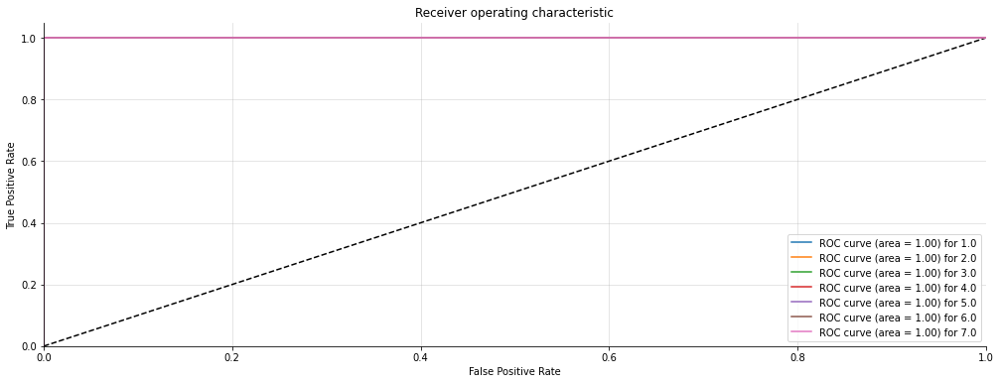

In [169]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]
fpo=dict()
tpo=dict()
ffpo=[]
ttpo=[]
def RFC(X_train, X_test, y_train, y_test, n_classes, figsize=(8, 6)):
    model = RandomForestClassifier(n_estimators=100, max_depth=None,
     min_samples_split=2, random_state=0)   
    model.fit(X_train, y_train)

    # predictions over test set
    predictions = [round(float(x)) for x in model.predict(X_test)]
    print((classification_report(y_test, predictions)))


    # calculating Accuracy Score, Precision Score, Recall Score and F1 Score
    print('Confusion Matrix: \n' ,confusion_matrix(y_test, predictions))
    acc.append(accuracy_score(y_test, predictions))
    print(f'Accuracy Score : {accuracy_score(y_test, predictions)}')
    pre.append(precision_score(y_test,predictions,average='weighted'))
    print('Precision Score : ' + str(precision_score(y_test,predictions,average='weighted')))
    recal.append(recall_score(y_test,predictions,average='weighted'))
    print('Recall Score : ' + str(recall_score(y_test,predictions,average='weighted')))
    f1.append(f1_score(y_test,predictions,average='weighted'))
    print('F1 Score : ' + str(f1_score(y_test,predictions,average='weighted')))
    rms.append(np.sqrt(mean_squared_error(y_test,predictions)))
    aucscore.append(score_auc(y_test,predictions))
    fpo,tpo=plot_multiclass_roc(model, X_test, y_test, n_classes)
    ffpo.append(fpo)
    ttpo.append(tpo)
    plot_multiclass_roc(model, X_test, y_test, n_classes)

for i in range(8):
  print('For column:', df.columns[1:][i])
  n_classes = len(np.unique(df[df.columns[1:][i]]))
  RFC(X_train, X_test, y_train[:,i], y_test[:,i], n_classes, figsize=(8, 6))

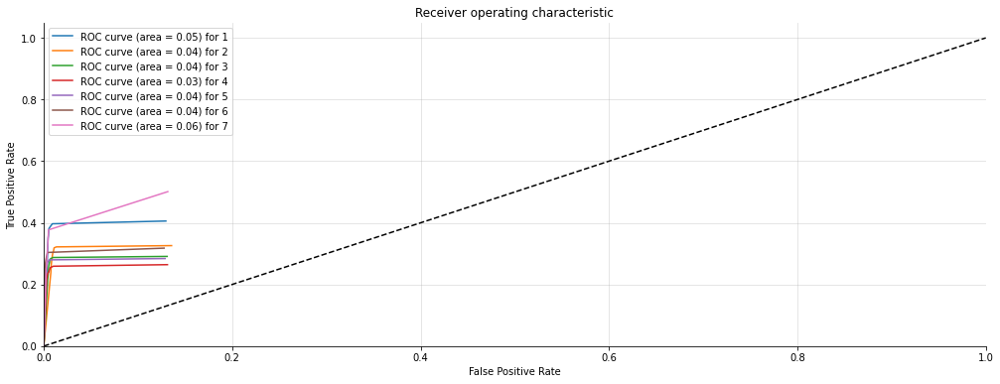

In [170]:
fsum0=list(np.array(dadd(dadd(dadd(ffpo[0][0],ffpo[1][0]),dadd(ffpo[2][0],ffpo[3][0])),dadd(dadd(ffpo[4][0],ffpo[5][0]),dadd(ffpo[6][0],ffpo[7][0]))))/8)
fsum1=list(np.array(dadd(dadd(dadd(ffpo[0][1],ffpo[1][1]),dadd(ffpo[2][1],ffpo[3][1])),dadd(dadd(ffpo[4][1],ffpo[5][1]),dadd(ffpo[6][1],ffpo[7][1]))))/8)
fsum2=list(np.array(dadd(dadd(dadd(ffpo[0][2],ffpo[1][2]),dadd(ffpo[2][2],ffpo[3][2])),dadd(dadd(ffpo[4][2],ffpo[5][2]),dadd(ffpo[6][2],ffpo[7][2]))))/8)
fsum3=list(np.array(dadd(dadd(dadd(ffpo[0][3],ffpo[1][3]),dadd(ffpo[2][3],ffpo[3][3])),dadd(dadd(ffpo[4][3],ffpo[5][3]),dadd(ffpo[6][3],ffpo[7][3]))))/8)
fsum4=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][4]),dadd(ffpo[2][4],ffpo[3][4])),dadd(dadd(ffpo[4][4],ffpo[5][4]),dadd(ffpo[6][4],ffpo[7][4]))))/8)
fsum5=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][5]),dadd(ffpo[2][5],ffpo[3][5])),dadd(dadd(ffpo[4][5],ffpo[5][5]),dadd(ffpo[6][5],ffpo[7][5]))))/8)
fsum6=list(np.array(dadd(dadd(dadd(ffpo[0][6],ffpo[1][6]),dadd(ffpo[2][6],ffpo[3][6])),dadd(dadd(ffpo[4][6],ffpo[5][6]),dadd(ffpo[6][6],ffpo[7][6]))))/8)

fpr=dict()

fpr[0]=fsum0
fpr[1]=fsum1
fpr[2]=fsum2
fpr[3]=fsum3
fpr[4]=fsum4
fpr[5]=fsum5
fpr[6]=fsum6


tsum0=list(np.array(dadd(dadd(dadd(ttpo[0][0],ttpo[1][0]),dadd(ttpo[2][0],ttpo[3][0])),dadd(dadd(ttpo[4][0],ttpo[5][0]),dadd(ttpo[6][0],ttpo[7][0]))))/8)
tsum1=list(np.array(dadd(dadd(dadd(ttpo[0][1],ttpo[1][1]),dadd(ttpo[2][1],ttpo[3][1])),dadd(dadd(ttpo[4][1],ttpo[5][1]),dadd(ttpo[6][1],ttpo[7][1]))))/8)
tsum2=list(np.array(dadd(dadd(dadd(ttpo[0][2],ttpo[1][2]),dadd(ttpo[2][2],ttpo[3][2])),dadd(dadd(ttpo[4][2],ttpo[5][2]),dadd(ttpo[6][2],ttpo[7][2]))))/8)
tsum3=list(np.array(dadd(dadd(dadd(ttpo[0][3],ttpo[1][3]),dadd(ttpo[2][3],ttpo[3][3])),dadd(dadd(ttpo[4][3],ttpo[5][3]),dadd(ttpo[6][3],ttpo[7][3]))))/8)
tsum4=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][4]),dadd(ttpo[2][4],ttpo[3][4])),dadd(dadd(ttpo[4][4],ttpo[5][4]),dadd(ttpo[6][4],ttpo[7][4]))))/8)
tsum5=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][5]),dadd(ttpo[2][5],ttpo[3][5])),dadd(dadd(ttpo[4][5],ttpo[5][5]),dadd(ttpo[6][5],ttpo[7][5]))))/8)
tsum6=list(np.array(dadd(dadd(dadd(ttpo[0][6],ttpo[1][6]),dadd(ttpo[2][6],ttpo[3][6])),dadd(dadd(ttpo[4][6],ttpo[5][6]),dadd(ttpo[6][6],ttpo[7][6]))))/8)

tpr=dict()

tpr[0]=tsum0
tpr[1]=tsum1
tpr[2]=tsum2
tpr[3]=tsum3
tpr[4]=tsum4
tpr[5]=tsum5
tpr[6]=tsum6

plot_multiclass_roc_avg(fpr,tpr,7)

In [171]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE {}".format(np.mean(rms)))
print("average AUC score {}".format(np.mean(aucscore)))
metric_df['RandomForestClassifier'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.8618675595238096
average Precision :0.8618730079711585
average Recall :0.8618675595238096
average F1 -score :0.8617391927122422
average RMSE 0.6097310707509183
average AUC score 0.9192345249529708


# 4.7.3 Extra Trees Classifier

For column: obstructive<==>supportive
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       462
         2.0       0.82      0.89      0.85       482
         3.0       0.74      0.71      0.73       510
         4.0       0.66      0.64      0.65       517
         5.0       0.64      0.66      0.65       467
         6.0       0.73      0.70      0.72       470
         7.0       0.82      0.81      0.82       452

    accuracy                           0.77      3360
   macro avg       0.77      0.77      0.77      3360
weighted avg       0.76      0.77      0.76      3360

Confusion Matrix: 
 [[442  20   0   0   0   0   0]
 [  0 430  48   0   1   3   0]
 [  0  23 363 119   3   2   0]
 [  0   1  37 333 145   1   0]
 [  4   3  16  29 308 107   0]
 [  3  20  10   9  17 328  83]
 [ 10  29  17  11  11   6 368]]
Accuracy Score : 0.7654761904761904
Precision Score : 0.7648401413805322
Recall Score : 0.7654761904761904
F1 Score : 0.7647632

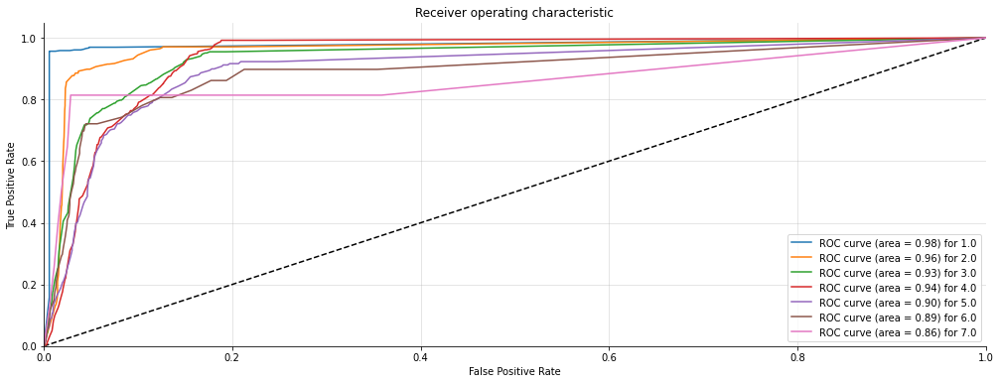

(3360, 7) (3360, 7)


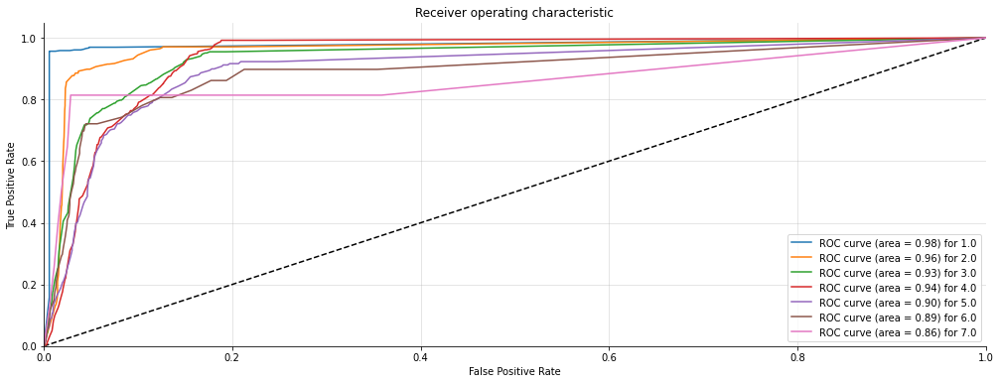

For column: complicated<==>easy
              precision    recall  f1-score   support

         1.0       0.96      0.95      0.96       463
         2.0       0.82      0.89      0.85       485
         3.0       0.75      0.72      0.73       501
         4.0       0.70      0.67      0.68       515
         5.0       0.71      0.75      0.73       460
         6.0       0.83      0.79      0.81       484
         7.0       0.90      0.90      0.90       452

    accuracy                           0.81      3360
   macro avg       0.81      0.81      0.81      3360
weighted avg       0.81      0.81      0.81      3360

Confusion Matrix: 
 [[442  20   0   0   0   1   0]
 [  0 431  48   0   1   3   2]
 [  0  22 360 117   2   0   0]
 [  0   2  40 343 128   2   0]
 [  3  16  13  14 344  70   0]
 [  5  17  16  13   6 384  43]
 [  9  18   6   4   5   2 408]]
Accuracy Score : 0.8071428571428572
Precision Score : 0.8069703832895823
Recall Score : 0.8071428571428572
F1 Score : 0.8066166557692

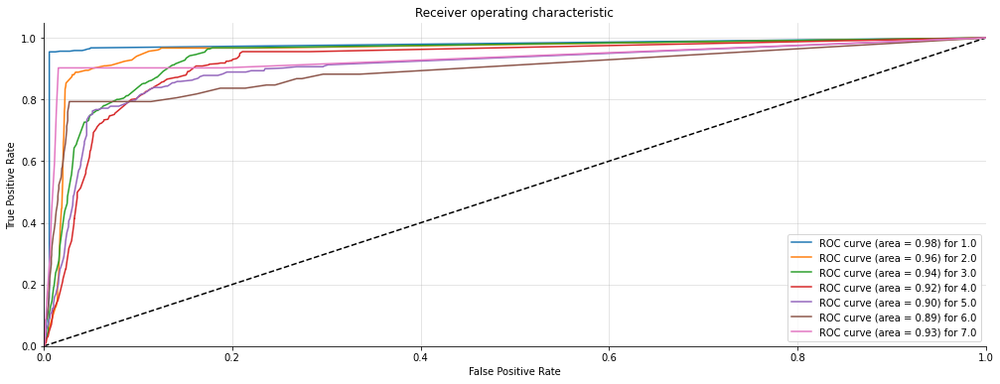

(3360, 7) (3360, 7)


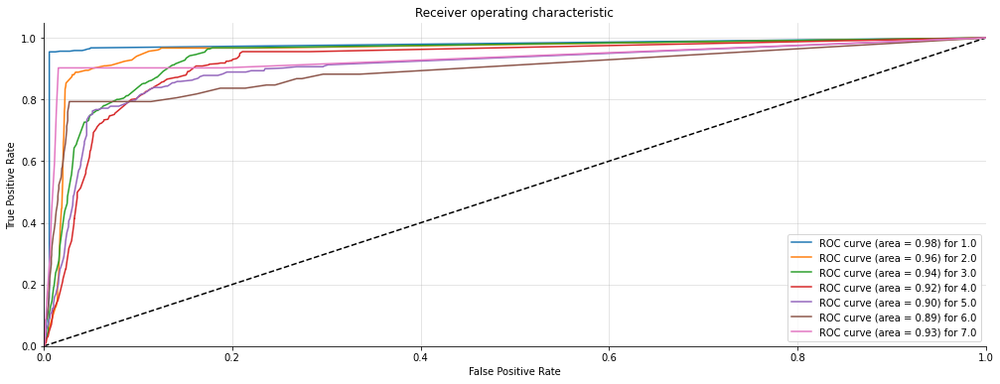

For column: inefficient<==>efficient
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       462
         2.0       0.82      0.89      0.86       482
         3.0       0.74      0.72      0.73       506
         4.0       0.68      0.64      0.66       526
         5.0       0.64      0.68      0.66       458
         6.0       0.72      0.68      0.70       475
         7.0       0.83      0.83      0.83       451

    accuracy                           0.77      3360
   macro avg       0.77      0.77      0.77      3360
weighted avg       0.77      0.77      0.77      3360

Confusion Matrix: 
 [[442  19   0   0   0   1   0]
 [  0 431  48   0   1   2   0]
 [  0  22 362 118   2   2   0]
 [  0   2  41 338 145   0   0]
 [  2   4   8  19 313 112   0]
 [  6  19  19  12  18 324  77]
 [  9  29  13  11   9   6 374]]
Accuracy Score : 0.7690476190476191
Precision Score : 0.7684381651443967
Recall Score : 0.7690476190476191
F1 Score : 0.76822269

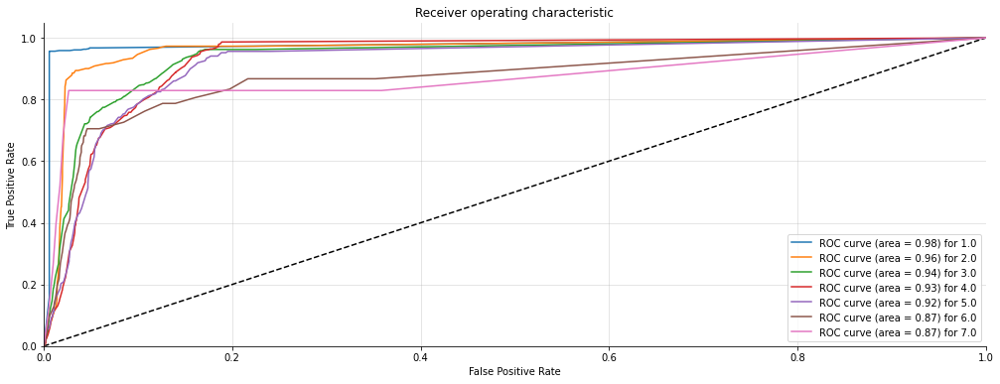

(3360, 7) (3360, 7)


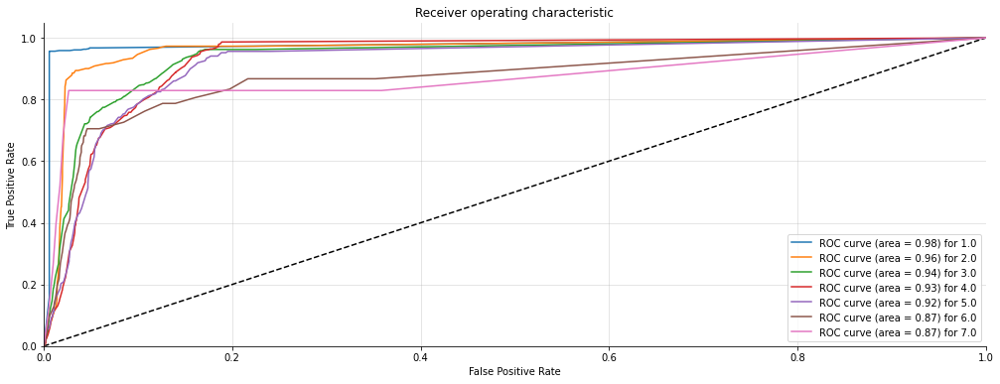

For column:  confusing<==>clear
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       461
         2.0       0.82      0.88      0.85       488
         3.0       0.75      0.72      0.73       506
         4.0       0.68      0.66      0.67       516
         5.0       0.65      0.69      0.67       456
         6.0       0.73      0.70      0.71       471
         7.0       0.81      0.79      0.80       462

    accuracy                           0.77      3360
   macro avg       0.77      0.77      0.77      3360
weighted avg       0.77      0.77      0.77      3360

Confusion Matrix: 
 [[442  19   0   0   0   0   0]
 [  0 431  49   1   3   4   0]
 [  0  23 362 120   0   1   0]
 [  0   0  27 342 145   2   0]
 [  2   2  10  19 315 108   0]
 [  2  15  16   9  15 328  86]
 [ 13  36  20  14  10   4 365]]
Accuracy Score : 0.7693452380952381
Precision Score : 0.7695090874333913
Recall Score : 0.7693452380952381
F1 Score : 0.7689978722677

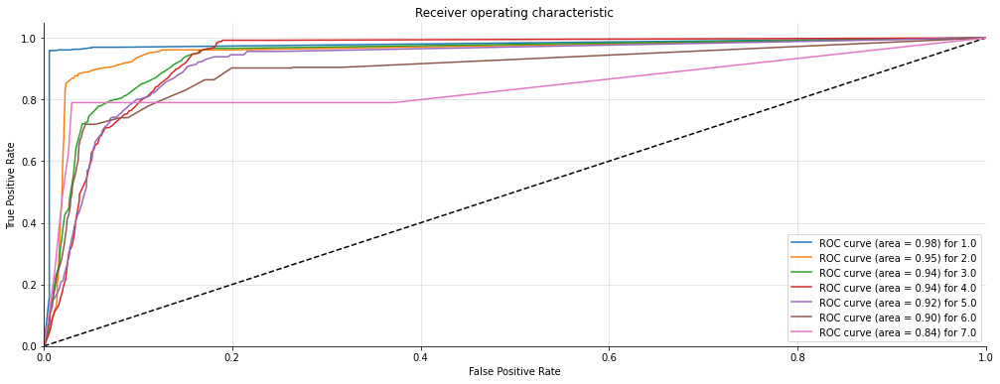

(3360, 7) (3360, 7)


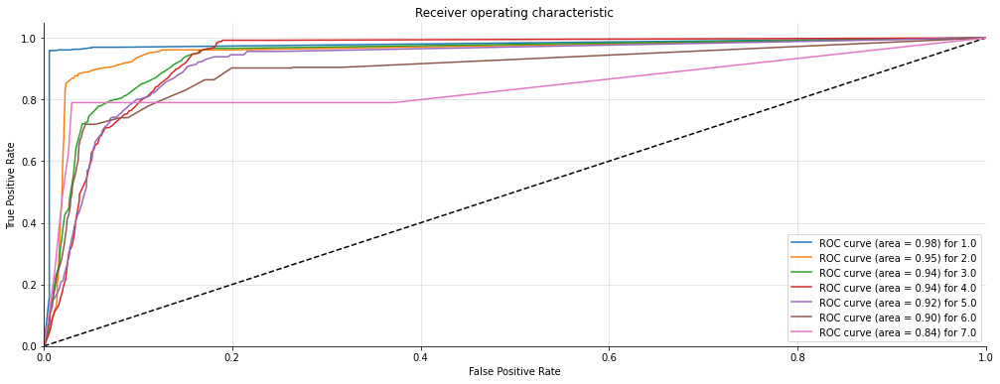

For column: boring<==>exciting
              precision    recall  f1-score   support

         1.0       0.96      0.95      0.96       463
         2.0       0.86      0.89      0.87       491
         3.0       0.83      0.80      0.81       487
         4.0       0.86      0.87      0.87       518
         5.0       0.92      0.92      0.92       487
         6.0       0.96      0.96      0.96       462
         7.0       0.99      0.99      0.99       452

    accuracy                           0.91      3360
   macro avg       0.91      0.91      0.91      3360
weighted avg       0.91      0.91      0.91      3360

Confusion Matrix: 
 [[442  18   1   0   1   1   0]
 [  5 435  45   2   1   3   0]
 [  7  31 389  58   2   0   0]
 [  3  15  17 450  32   1   0]
 [  1   6  10   9 450  11   0]
 [  1   3   4   2   4 443   5]
 [  0   0   2   0   1   3 446]]
Accuracy Score : 0.9092261904761905
Precision Score : 0.9091723973811118
Recall Score : 0.9092261904761905
F1 Score : 0.90910968072350

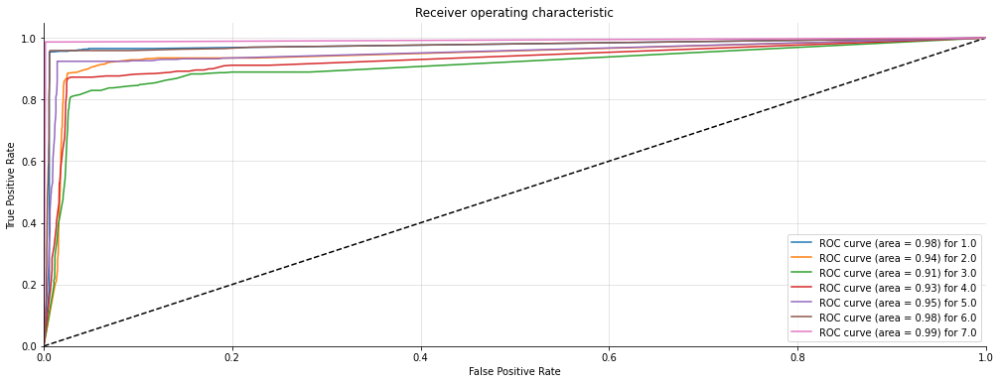

(3360, 7) (3360, 7)


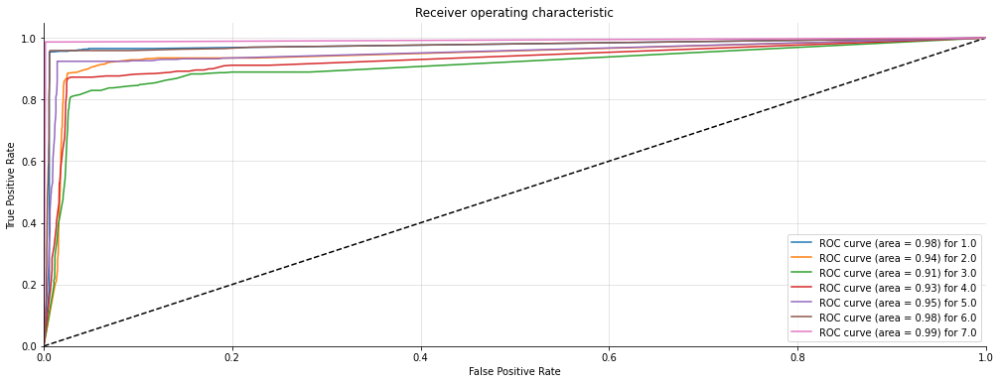

For column: not interesting<==>interesting
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       461
         2.0       0.85      0.87      0.86       495
         3.0       0.81      0.78      0.80       490
         4.0       0.83      0.83      0.83       519
         5.0       0.89      0.91      0.90       481
         6.0       0.96      0.96      0.96       465
         7.0       0.99      0.99      0.99       449

    accuracy                           0.90      3360
   macro avg       0.90      0.90      0.90      3360
weighted avg       0.90      0.90      0.90      3360

Confusion Matrix: 
 [[442  18   1   0   0   0   0]
 [  5 432  50   2   2   4   0]
 [  7  31 382  69   0   1   0]
 [  3  17  20 432  47   0   0]
 [  1   7  12  14 436  11   0]
 [  1   3   3   2   6 445   5]
 [  0   0   2   0   0   1 446]]
Accuracy Score : 0.8973214285714286
Precision Score : 0.8970708551297705
Recall Score : 0.8973214285714286
F1 Score : 0.89

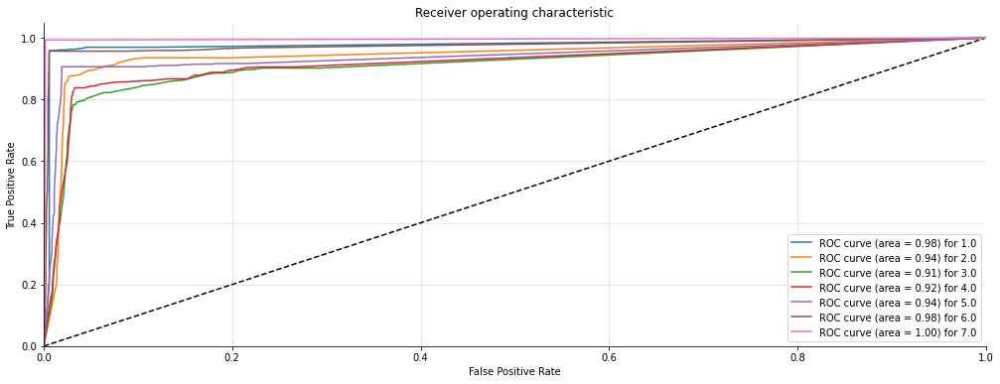

(3360, 7) (3360, 7)


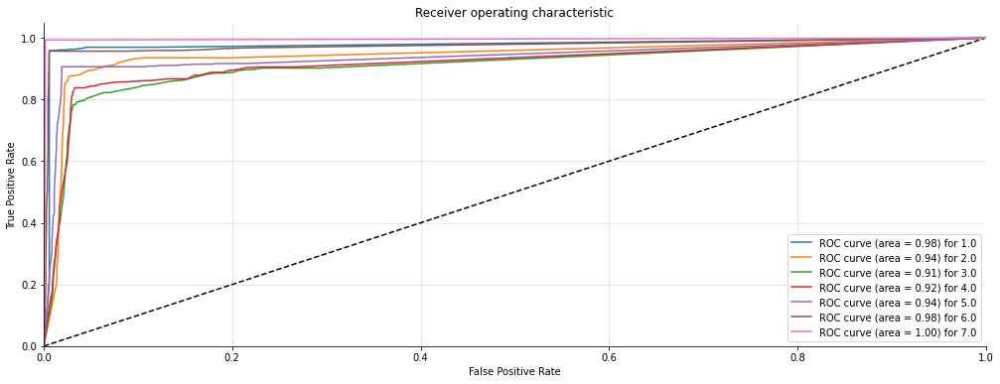

For column: conventional<==>inventive
              precision    recall  f1-score   support

         1.0       0.99      0.99      0.99       460
         2.0       0.96      0.94      0.95       502
         3.0       0.94      0.95      0.94       474
         4.0       0.96      0.95      0.95       527
         5.0       0.97      0.98      0.97       486
         6.0       0.98      0.99      0.99       459
         7.0       1.00      1.00      1.00       452

    accuracy                           0.97      3360
   macro avg       0.97      0.97      0.97      3360
weighted avg       0.97      0.97      0.97      3360

Confusion Matrix: 
 [[454   6   0   0   0   0   0]
 [  6 474  19   2   1   0   0]
 [  0  13 448  13   0   0   0]
 [  0   1  12 500  10   4   0]
 [  0   0   0   8 476   2   0]
 [  0   0   0   0   4 455   0]
 [  0   0   0   0   0   1 451]]
Accuracy Score : 0.9696428571428571
Precision Score : 0.9696494047586346
Recall Score : 0.9696428571428571
F1 Score : 0.9696258

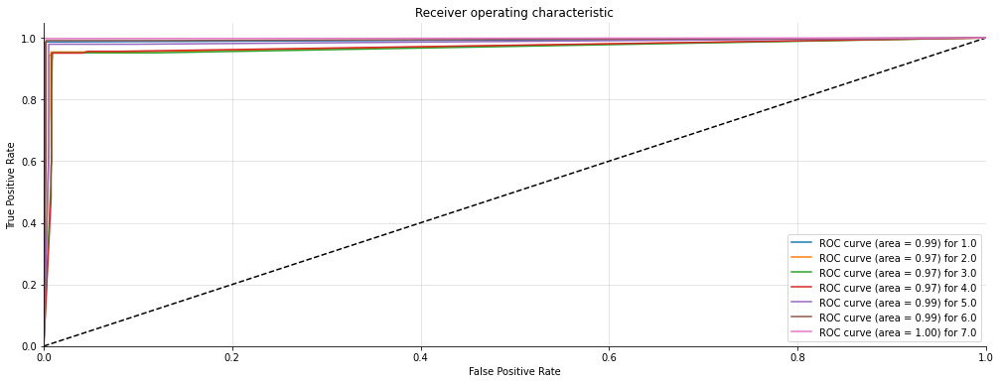

(3360, 7) (3360, 7)


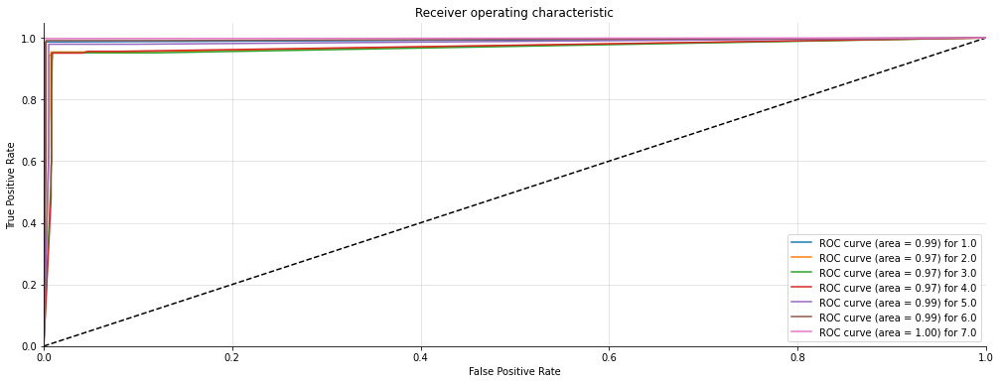

For column: usual<==>leading edge
              precision    recall  f1-score   support

         1.0       1.00      1.00      1.00       459
         2.0       1.00      1.00      1.00       496
         3.0       1.00      1.00      1.00       478
         4.0       1.00      1.00      1.00       523
         5.0       1.00      1.00      1.00       491
         6.0       1.00      1.00      1.00       462
         7.0       1.00      1.00      1.00       451

    accuracy                           1.00      3360
   macro avg       1.00      1.00      1.00      3360
weighted avg       1.00      1.00      1.00      3360

Confusion Matrix: 
 [[459   0   0   0   0   0   0]
 [  0 496   0   0   0   0   0]
 [  0   0 478   0   0   0   0]
 [  0   0   0 523   0   0   0]
 [  0   0   0   0 491   0   0]
 [  0   0   0   0   0 462   0]
 [  0   0   0   0   0   0 451]]
Accuracy Score : 1.0
Precision Score : 1.0
Recall Score : 1.0
F1 Score : 1.0
(3360, 7) (3360, 7)


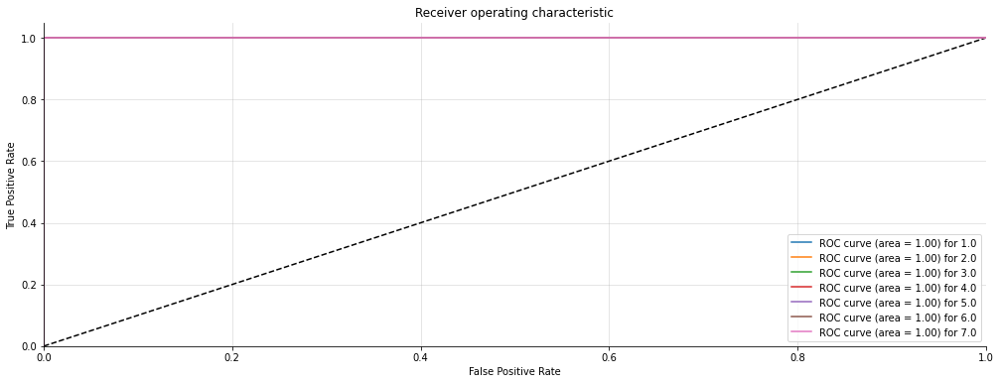

(3360, 7) (3360, 7)


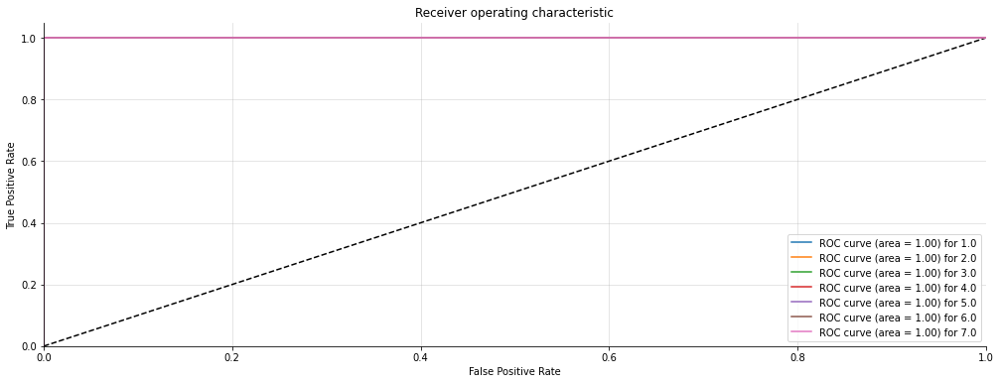

In [172]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]
fpo=dict()
tpo=dict()
ffpo=[]
ttpo=[]
def ETC(X_train, X_test, y_train, y_test, n_classes, figsize=(8, 6)):
    model = ExtraTreesClassifier(n_estimators=100, max_depth=None,
     min_samples_split=2, random_state=0)   
    model.fit(X_train, y_train)

    # predictions over test set
    predictions = [round(float(x)) for x in model.predict(X_test)]
    print((classification_report(y_test, predictions)))


    # calculating Accuracy Score, Precision Score, Recall Score and F1 Score
    print('Confusion Matrix: \n' ,confusion_matrix(y_test, predictions))
    acc.append(accuracy_score(y_test, predictions))
    print(f'Accuracy Score : {accuracy_score(y_test, predictions)}')
    pre.append(precision_score(y_test,predictions,average='weighted'))
    print('Precision Score : ' + str(precision_score(y_test,predictions,average='weighted')))
    recal.append(recall_score(y_test,predictions,average='weighted'))
    print('Recall Score : ' + str(recall_score(y_test,predictions,average='weighted')))
    f1.append(f1_score(y_test,predictions,average='weighted'))
    print('F1 Score : ' + str(f1_score(y_test,predictions,average='weighted')))
    rms.append(np.sqrt(mean_squared_error(y_test,predictions)))
    aucscore.append(score_auc(y_test,predictions))
    fpo,tpo=plot_multiclass_roc(model, X_test, y_test, n_classes)
    ffpo.append(fpo)
    ttpo.append(tpo)
    plot_multiclass_roc(model, X_test, y_test, n_classes)

for i in range(8):
  print('For column:', df.columns[1:][i])
  n_classes = len(np.unique(df[df.columns[1:][i]]))
  ETC(X_train, X_test, y_train[:,i], y_test[:,i], n_classes, figsize=(8, 6))

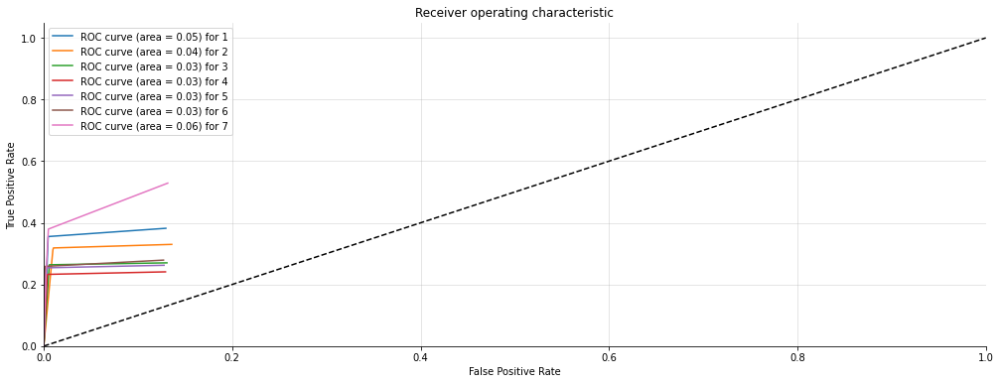

In [173]:
fsum0=list(np.array(dadd(dadd(dadd(ffpo[0][0],ffpo[1][0]),dadd(ffpo[2][0],ffpo[3][0])),dadd(dadd(ffpo[4][0],ffpo[5][0]),dadd(ffpo[6][0],ffpo[7][0]))))/8)
fsum1=list(np.array(dadd(dadd(dadd(ffpo[0][1],ffpo[1][1]),dadd(ffpo[2][1],ffpo[3][1])),dadd(dadd(ffpo[4][1],ffpo[5][1]),dadd(ffpo[6][1],ffpo[7][1]))))/8)
fsum2=list(np.array(dadd(dadd(dadd(ffpo[0][2],ffpo[1][2]),dadd(ffpo[2][2],ffpo[3][2])),dadd(dadd(ffpo[4][2],ffpo[5][2]),dadd(ffpo[6][2],ffpo[7][2]))))/8)
fsum3=list(np.array(dadd(dadd(dadd(ffpo[0][3],ffpo[1][3]),dadd(ffpo[2][3],ffpo[3][3])),dadd(dadd(ffpo[4][3],ffpo[5][3]),dadd(ffpo[6][3],ffpo[7][3]))))/8)
fsum4=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][4]),dadd(ffpo[2][4],ffpo[3][4])),dadd(dadd(ffpo[4][4],ffpo[5][4]),dadd(ffpo[6][4],ffpo[7][4]))))/8)
fsum5=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][5]),dadd(ffpo[2][5],ffpo[3][5])),dadd(dadd(ffpo[4][5],ffpo[5][5]),dadd(ffpo[6][5],ffpo[7][5]))))/8)
fsum6=list(np.array(dadd(dadd(dadd(ffpo[0][6],ffpo[1][6]),dadd(ffpo[2][6],ffpo[3][6])),dadd(dadd(ffpo[4][6],ffpo[5][6]),dadd(ffpo[6][6],ffpo[7][6]))))/8)

fpr=dict()

fpr[0]=fsum0
fpr[1]=fsum1
fpr[2]=fsum2
fpr[3]=fsum3
fpr[4]=fsum4
fpr[5]=fsum5
fpr[6]=fsum6


tsum0=list(np.array(dadd(dadd(dadd(ttpo[0][0],ttpo[1][0]),dadd(ttpo[2][0],ttpo[3][0])),dadd(dadd(ttpo[4][0],ttpo[5][0]),dadd(ttpo[6][0],ttpo[7][0]))))/8)
tsum1=list(np.array(dadd(dadd(dadd(ttpo[0][1],ttpo[1][1]),dadd(ttpo[2][1],ttpo[3][1])),dadd(dadd(ttpo[4][1],ttpo[5][1]),dadd(ttpo[6][1],ttpo[7][1]))))/8)
tsum2=list(np.array(dadd(dadd(dadd(ttpo[0][2],ttpo[1][2]),dadd(ttpo[2][2],ttpo[3][2])),dadd(dadd(ttpo[4][2],ttpo[5][2]),dadd(ttpo[6][2],ttpo[7][2]))))/8)
tsum3=list(np.array(dadd(dadd(dadd(ttpo[0][3],ttpo[1][3]),dadd(ttpo[2][3],ttpo[3][3])),dadd(dadd(ttpo[4][3],ttpo[5][3]),dadd(ttpo[6][3],ttpo[7][3]))))/8)
tsum4=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][4]),dadd(ttpo[2][4],ttpo[3][4])),dadd(dadd(ttpo[4][4],ttpo[5][4]),dadd(ttpo[6][4],ttpo[7][4]))))/8)
tsum5=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][5]),dadd(ttpo[2][5],ttpo[3][5])),dadd(dadd(ttpo[4][5],ttpo[5][5]),dadd(ttpo[6][5],ttpo[7][5]))))/8)
tsum6=list(np.array(dadd(dadd(dadd(ttpo[0][6],ttpo[1][6]),dadd(ttpo[2][6],ttpo[3][6])),dadd(dadd(ttpo[4][6],ttpo[5][6]),dadd(ttpo[6][6],ttpo[7][6]))))/8)

tpr=dict()

tpr[0]=tsum0
tpr[1]=tsum1
tpr[2]=tsum2
tpr[3]=tsum3
tpr[4]=tsum4
tpr[5]=tsum5
tpr[6]=tsum6

plot_multiclass_roc_avg(fpr,tpr,7)

In [174]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE {}".format(np.mean(rms)))
print("average AUC score {}".format(np.mean(aucscore)))
metric_df['ExtraTreesClassifier'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.8609002976190476
average Precision :0.8607063043146774
average Recall :0.8609002976190476
average F1 -score :0.8605555242412326
average RMSE 0.6023988451767421
average AUC score 0.9186691873796418


# 4.7.4 Adaboost 

For column: obstructive<==>supportive
              precision    recall  f1-score   support

         1.0       0.58      0.58      0.58       462
         2.0       0.37      0.38      0.37       482
         3.0       0.28      0.33      0.30       510
         4.0       0.37      0.34      0.36       517
         5.0       0.25      0.31      0.27       467
         6.0       0.43      0.36      0.39       470
         7.0       0.67      0.53      0.59       452

    accuracy                           0.40      3360
   macro avg       0.42      0.40      0.41      3360
weighted avg       0.42      0.40      0.41      3360

Confusion Matrix: 
 [[269  65  67  19  21  12   9]
 [ 62 182  83  51  64  29  11]
 [ 39  85 166  93  76  42   9]
 [ 27  71  87 178  99  42  13]
 [ 32  30  61 105 143  90   6]
 [ 22  43  36  23 105 169  72]
 [ 16  14  92  10  69  12 239]]
Accuracy Score : 0.4005952380952381
Precision Score : 0.4159253234502627
Recall Score : 0.4005952380952381
F1 Score : 0.4060340

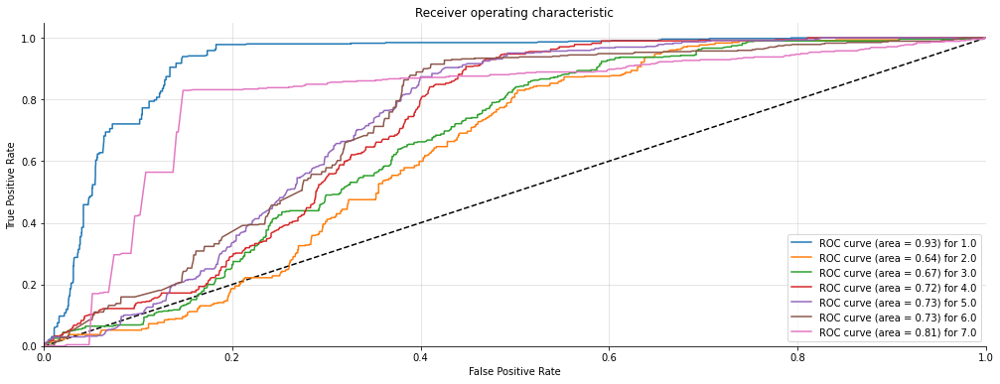

(3360, 7) (3360, 7)


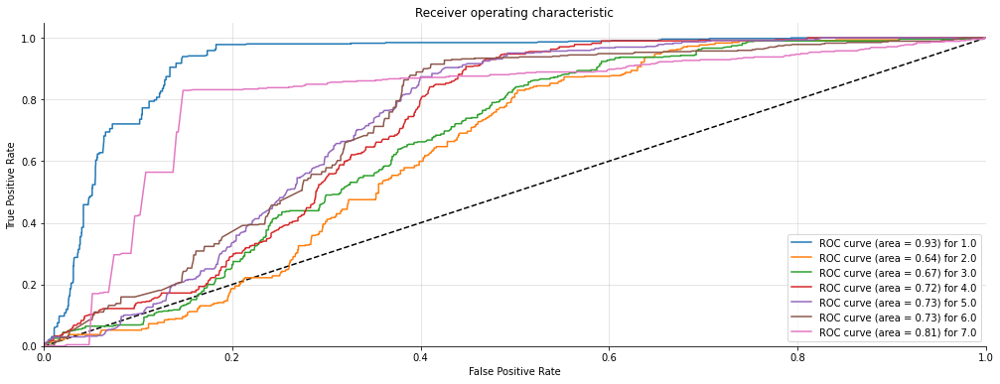

For column: complicated<==>easy
              precision    recall  f1-score   support

         1.0       0.58      0.66      0.62       463
         2.0       0.35      0.39      0.37       485
         3.0       0.25      0.29      0.27       501
         4.0       0.28      0.30      0.29       515
         5.0       0.35      0.27      0.31       460
         6.0       0.49      0.45      0.47       484
         7.0       0.79      0.59      0.67       452

    accuracy                           0.42      3360
   macro avg       0.44      0.42      0.43      3360
weighted avg       0.43      0.42      0.42      3360

Confusion Matrix: 
 [[307  51  40  16  26  13  10]
 [ 73 191  91  50  37  30  13]
 [ 44 116 145  97  48  46   5]
 [ 42  77 109 154  79  47   7]
 [ 30  51  58 104 126  87   4]
 [ 28  49  59  62  36 220  30]
 [  9  14  81  71   4   8 265]]
Accuracy Score : 0.41904761904761906
Precision Score : 0.43473474715304494
Recall Score : 0.41904761904761906
F1 Score : 0.4231017617

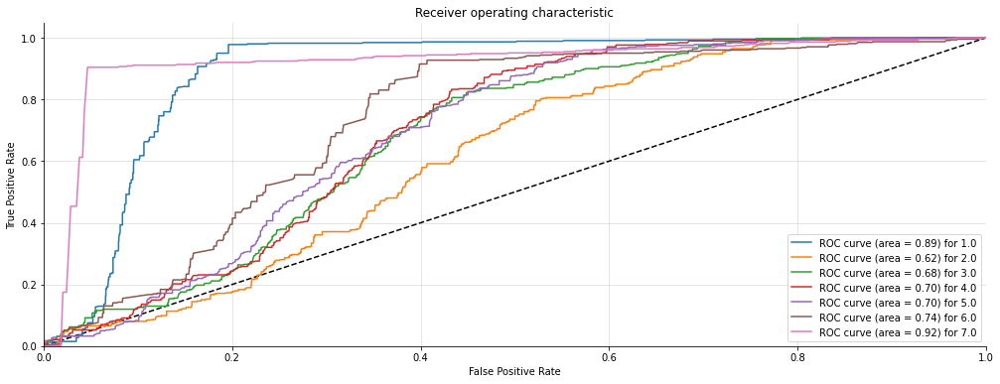

(3360, 7) (3360, 7)


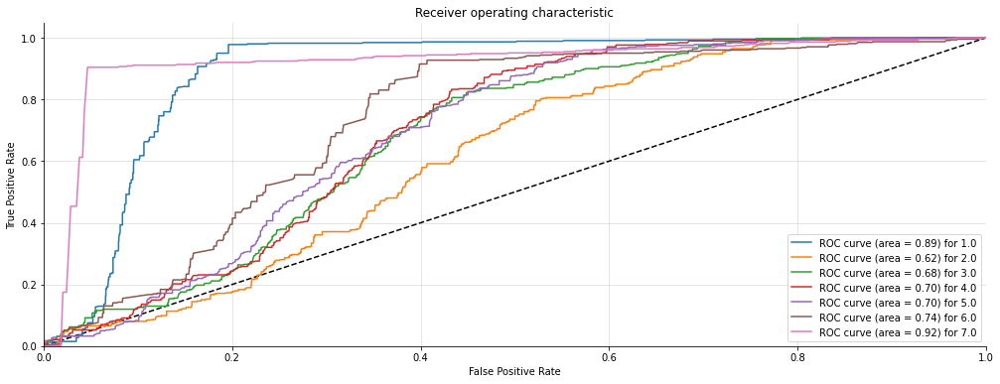

For column: inefficient<==>efficient
              precision    recall  f1-score   support

         1.0       0.59      0.61      0.60       462
         2.0       0.36      0.37      0.36       482
         3.0       0.34      0.27      0.31       506
         4.0       0.36      0.36      0.36       526
         5.0       0.25      0.28      0.26       458
         6.0       0.38      0.41      0.39       475
         7.0       0.58      0.54      0.56       451

    accuracy                           0.40      3360
   macro avg       0.41      0.41      0.41      3360
weighted avg       0.41      0.40      0.40      3360

Confusion Matrix: 
 [[282  81  24  12  24  23  16]
 [ 62 177  84  59  44  41  15]
 [ 36  90 139 102  61  36  42]
 [ 28  71  67 191  93  48  28]
 [ 37  26  48 112 129  87  19]
 [ 19  36  31  37 100 195  57]
 [ 17  17  10  13  65  85 244]]
Accuracy Score : 0.4038690476190476
Precision Score : 0.4057861776166783
Recall Score : 0.4038690476190476
F1 Score : 0.40387279

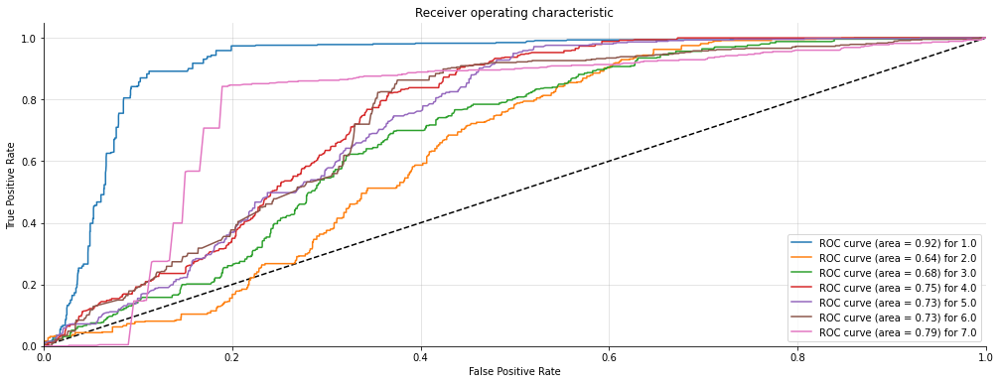

(3360, 7) (3360, 7)


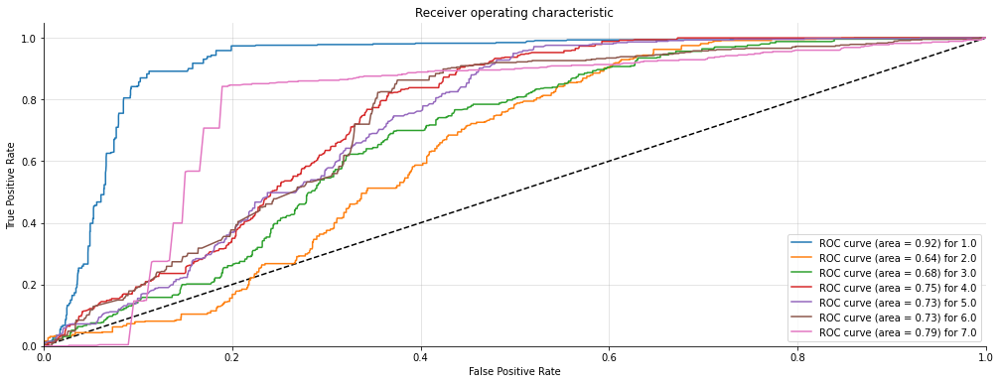

For column:  confusing<==>clear
              precision    recall  f1-score   support

         1.0       0.62      0.61      0.62       461
         2.0       0.31      0.45      0.37       488
         3.0       0.39      0.34      0.36       506
         4.0       0.35      0.33      0.34       516
         5.0       0.27      0.30      0.28       456
         6.0       0.49      0.40      0.44       471
         7.0       0.64      0.52      0.57       462

    accuracy                           0.42      3360
   macro avg       0.44      0.42      0.43      3360
weighted avg       0.43      0.42      0.42      3360

Confusion Matrix: 
 [[283  81  30  23  14  21   9]
 [ 60 219  73  56  53  19   8]
 [ 17 111 171  91  58  36  22]
 [ 22  95  77 171 108  27  16]
 [ 31  33  50  96 137  92  17]
 [ 26  60  25  33  74 189  64]
 [ 18 102  12  18  70   4 238]]
Accuracy Score : 0.41904761904761906
Precision Score : 0.43490006065926545
Recall Score : 0.41904761904761906
F1 Score : 0.4232769404

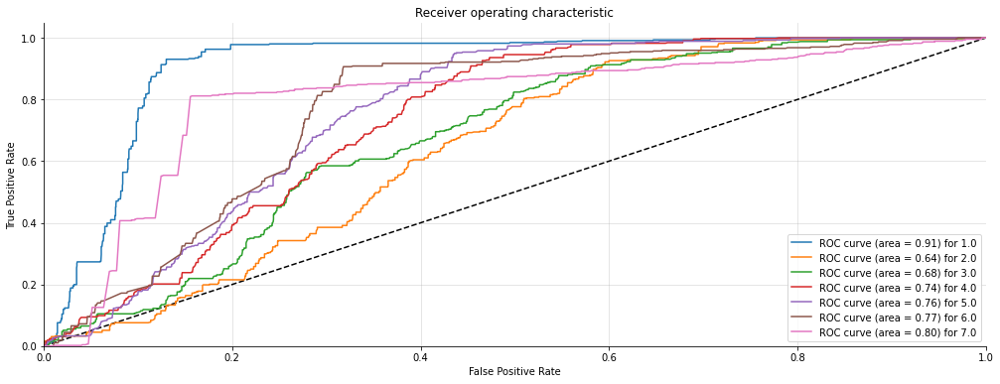

(3360, 7) (3360, 7)


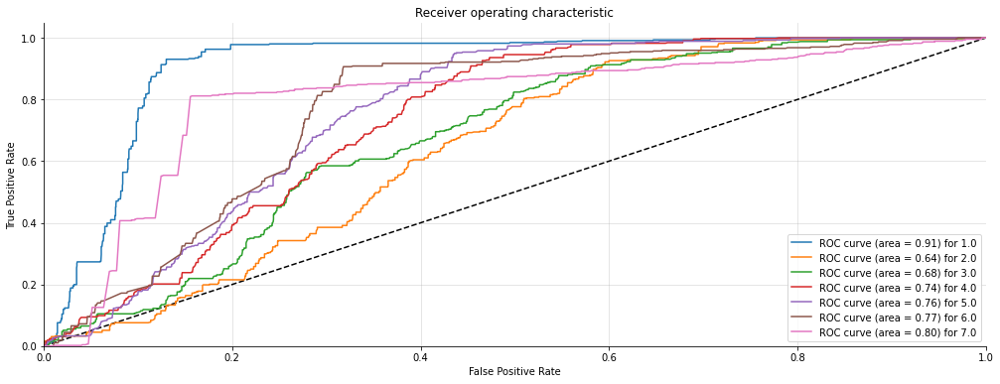

For column: boring<==>exciting
              precision    recall  f1-score   support

         1.0       0.27      0.27      0.27       463
         2.0       0.19      0.20      0.19       491
         3.0       0.24      0.19      0.21       487
         4.0       0.26      0.18      0.21       518
         5.0       0.21      0.35      0.26       487
         6.0       0.27      0.23      0.25       462
         7.0       0.93      0.80      0.86       452

    accuracy                           0.31      3360
   macro avg       0.34      0.32      0.32      3360
weighted avg       0.33      0.31      0.32      3360

Confusion Matrix: 
 [[123  71  31  61 132  45   0]
 [ 87  98  40  47 158  57   4]
 [ 68  70  94  47 133  68   7]
 [ 61 109  50  95 127  66  10]
 [ 51  92  43  79 170  51   1]
 [ 72  81  53  37 108 107   4]
 [  2   0  85   2   0   1 362]]
Accuracy Score : 0.31220238095238095
Precision Score : 0.3307334481367067
Recall Score : 0.31220238095238095
F1 Score : 0.316546326180

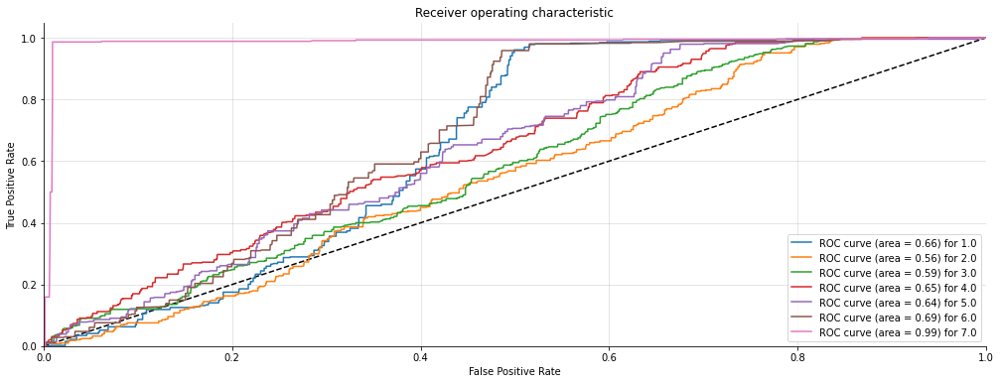

(3360, 7) (3360, 7)


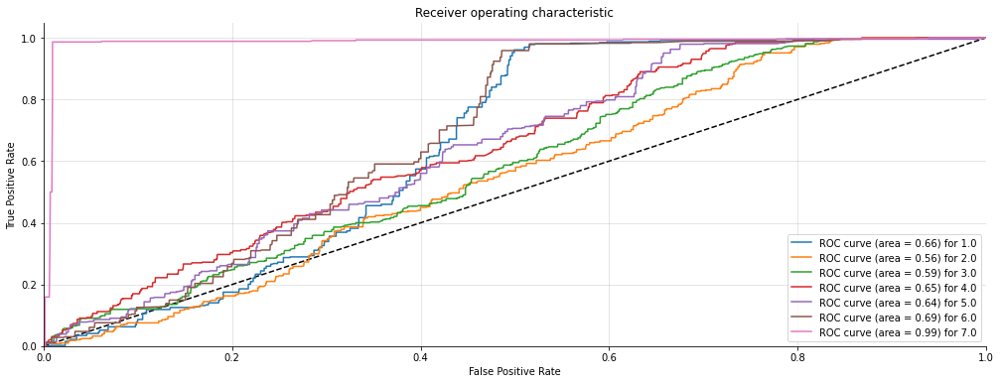

For column: not interesting<==>interesting
              precision    recall  f1-score   support

         1.0       0.25      0.34      0.29       461
         2.0       0.19      0.18      0.18       495
         3.0       0.26      0.22      0.24       490
         4.0       0.30      0.20      0.24       519
         5.0       0.23      0.34      0.28       481
         6.0       0.35      0.31      0.33       465
         7.0       0.97      0.81      0.88       449

    accuracy                           0.34      3360
   macro avg       0.36      0.34      0.35      3360
weighted avg       0.36      0.34      0.34      3360

Confusion Matrix: 
 [[156  66  38  38  91  72   0]
 [ 93  89  59  70 139  42   3]
 [110  77 109  33 110  48   3]
 [ 85  69  65 105 136  56   3]
 [ 84  38  70  75 165  49   0]
 [ 94  52  75  33  62 145   4]
 [  0  84   2   0   1   0 362]]
Accuracy Score : 0.3366071428571429
Precision Score : 0.35711479139004176
Recall Score : 0.3366071428571429
F1 Score : 0.3

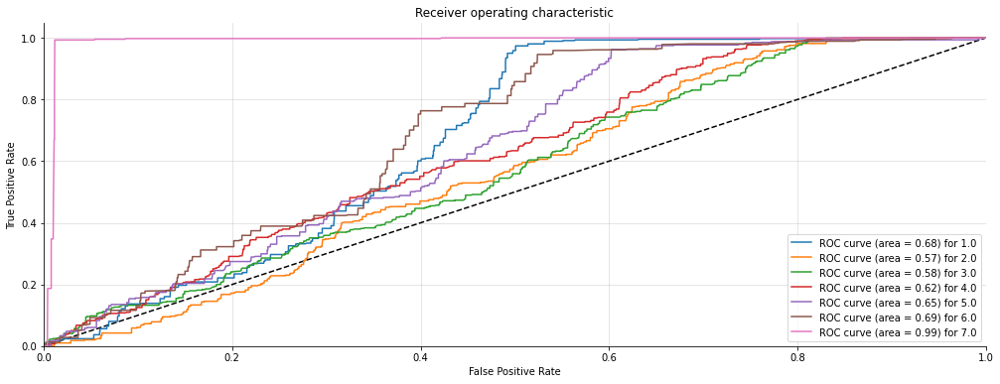

(3360, 7) (3360, 7)


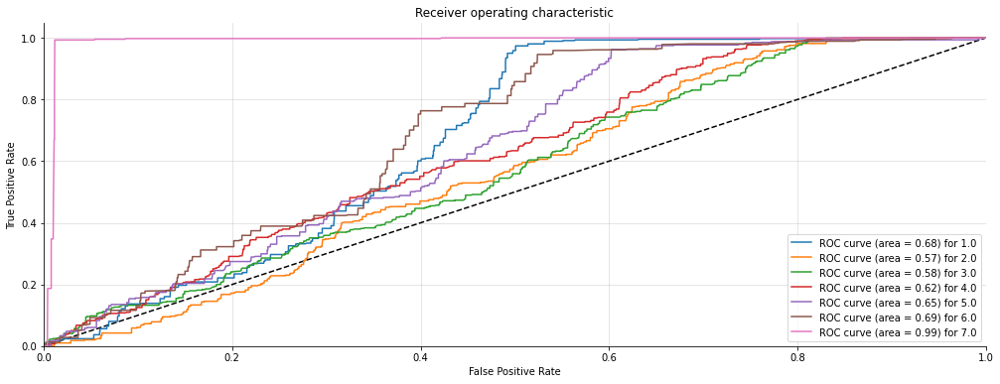

For column: conventional<==>inventive
              precision    recall  f1-score   support

         1.0       0.18      0.36      0.24       460
         2.0       0.21      0.16      0.18       502
         3.0       0.18      0.16      0.17       474
         4.0       0.26      0.17      0.21       527
         5.0       0.13      0.20      0.16       486
         6.0       0.23      0.14      0.17       459
         7.0       0.91      0.66      0.77       452

    accuracy                           0.26      3360
   macro avg       0.30      0.26      0.27      3360
weighted avg       0.30      0.26      0.27      3360

Confusion Matrix: 
 [[165  75  82  25 101   8   4]
 [140  79  45  58 150  24   6]
 [132  56  76  54 113  40   3]
 [136  72  54  89 153  20   3]
 [125  58  90  69  97  47   0]
 [114  36  68  45 119  64  13]
 [ 81   0   0   0   1  72 298]]
Accuracy Score : 0.25833333333333336
Precision Score : 0.2970788612312305
Recall Score : 0.25833333333333336
F1 Score : 0.26634

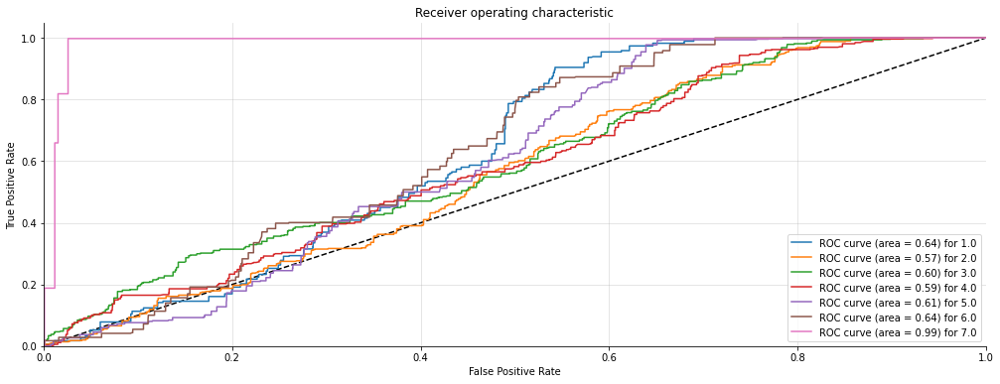

(3360, 7) (3360, 7)


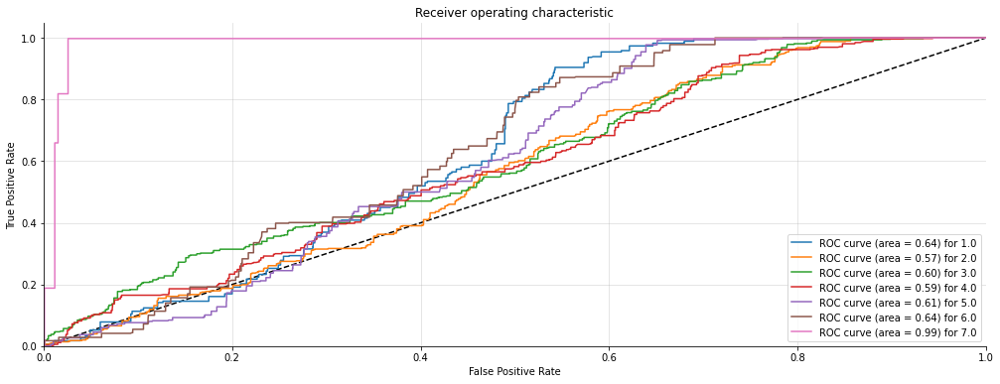

For column: usual<==>leading edge
              precision    recall  f1-score   support

         1.0       0.21      0.28      0.24       459
         2.0       0.17      0.17      0.17       496
         3.0       0.18      0.15      0.16       478
         4.0       0.13      0.11      0.12       523
         5.0       0.14      0.29      0.19       491
         6.0       0.36      0.12      0.18       462
         7.0       0.95      0.48      0.64       451

    accuracy                           0.23      3360
   macro avg       0.31      0.23      0.24      3360
weighted avg       0.30      0.23      0.24      3360

Confusion Matrix: 
 [[129  92  58  12 160   4   4]
 [ 79  85  73  28 203  28   0]
 [ 79  65  73  55 185  20   1]
 [107  90  74  57 189   3   3]
 [ 95  98  66  46 142  41   3]
 [115  68  73  19 133  54   0]
 [  0   0   0 233   0   0 218]]
Accuracy Score : 0.2255952380952381
Precision Score : 0.2967758680628818
Recall Score : 0.2255952380952381
F1 Score : 0.23778617399

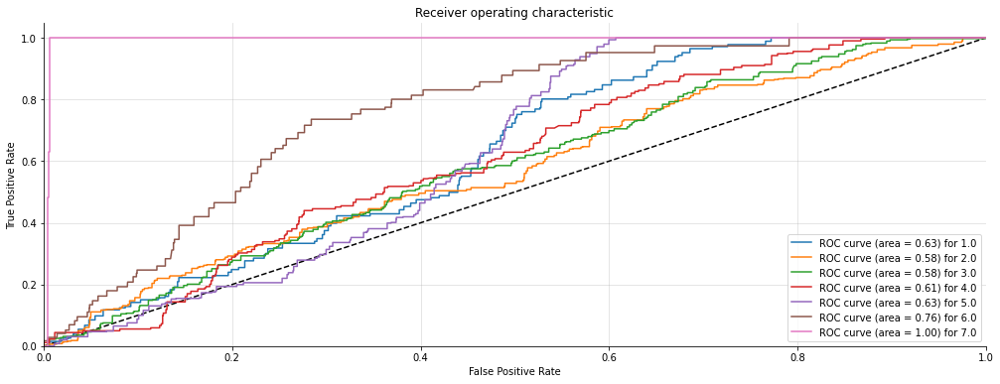

(3360, 7) (3360, 7)


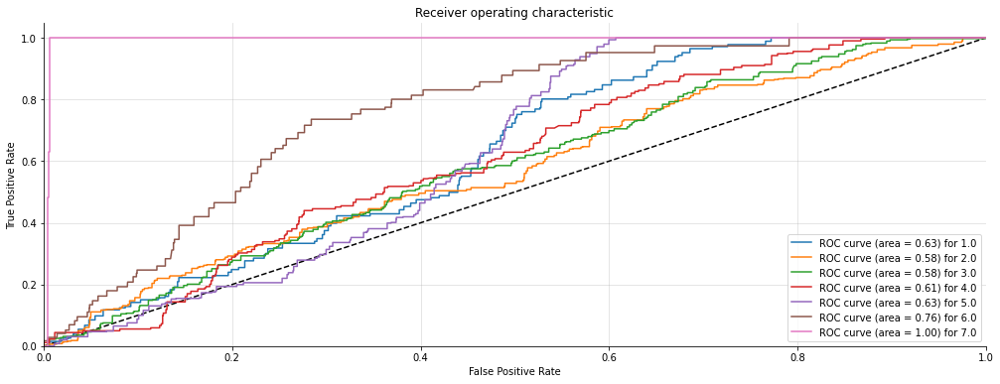

In [175]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]
fpo=dict()
tpo=dict()
ffpo=[]
ttpo=[]
def ADB(X_train, X_test, y_train, y_test, n_classes, figsize=(8, 6)):
    model = AdaBoostClassifier(n_estimators=500)   
    model.fit(X_train, y_train)

    # predictions over test set
    predictions = [round(float(x)) for x in model.predict(X_test)]
    print((classification_report(y_test, predictions)))


    # calculating Accuracy Score, Precision Score, Recall Score and F1 Score
    print('Confusion Matrix: \n' ,confusion_matrix(y_test, predictions))
    acc.append(accuracy_score(y_test, predictions))
    print(f'Accuracy Score : {accuracy_score(y_test, predictions)}')
    pre.append(precision_score(y_test,predictions,average='weighted'))
    print('Precision Score : ' + str(precision_score(y_test,predictions,average='weighted')))
    recal.append(recall_score(y_test,predictions,average='weighted'))
    print('Recall Score : ' + str(recall_score(y_test,predictions,average='weighted')))
    f1.append(f1_score(y_test,predictions,average='weighted'))
    print('F1 Score : ' + str(f1_score(y_test,predictions,average='weighted')))
    rms.append(np.sqrt(mean_squared_error(y_test,predictions)))
    aucscore.append(score_auc(y_test,predictions))
    fpo,tpo=plot_multiclass_roc(model, X_test, y_test, n_classes)
    ffpo.append(fpo)
    ttpo.append(tpo)
    plot_multiclass_roc(model, X_test, y_test, n_classes)

for i in range(8):
  print('For column:', df.columns[1:][i])
  n_classes = len(np.unique(df[df.columns[1:][i]]))
  ADB(X_train, X_test, y_train[:,i], y_test[:,i], n_classes, figsize=(8, 6))

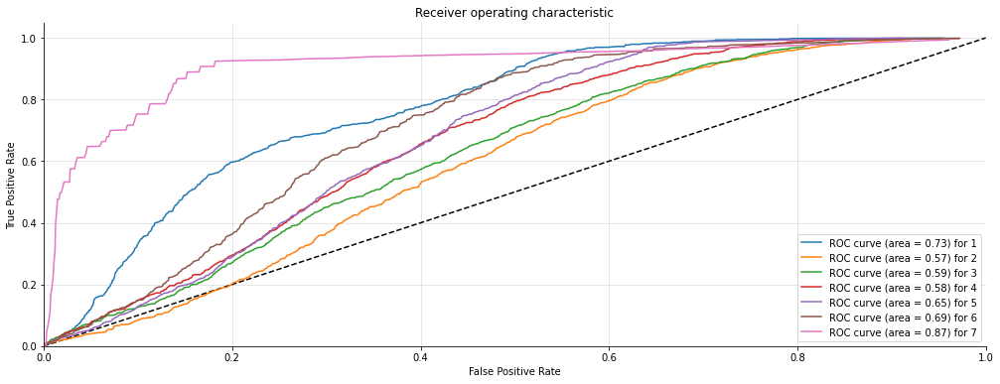

In [176]:
fsum0=list(np.array(dadd(dadd(dadd(ffpo[0][0],ffpo[1][0]),dadd(ffpo[2][0],ffpo[3][0])),dadd(dadd(ffpo[4][0],ffpo[5][0]),dadd(ffpo[6][0],ffpo[7][0]))))/8)
fsum1=list(np.array(dadd(dadd(dadd(ffpo[0][1],ffpo[1][1]),dadd(ffpo[2][1],ffpo[3][1])),dadd(dadd(ffpo[4][1],ffpo[5][1]),dadd(ffpo[6][1],ffpo[7][1]))))/8)
fsum2=list(np.array(dadd(dadd(dadd(ffpo[0][2],ffpo[1][2]),dadd(ffpo[2][2],ffpo[3][2])),dadd(dadd(ffpo[4][2],ffpo[5][2]),dadd(ffpo[6][2],ffpo[7][2]))))/8)
fsum3=list(np.array(dadd(dadd(dadd(ffpo[0][3],ffpo[1][3]),dadd(ffpo[2][3],ffpo[3][3])),dadd(dadd(ffpo[4][3],ffpo[5][3]),dadd(ffpo[6][3],ffpo[7][3]))))/8)
fsum4=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][4]),dadd(ffpo[2][4],ffpo[3][4])),dadd(dadd(ffpo[4][4],ffpo[5][4]),dadd(ffpo[6][4],ffpo[7][4]))))/8)
fsum5=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][5]),dadd(ffpo[2][5],ffpo[3][5])),dadd(dadd(ffpo[4][5],ffpo[5][5]),dadd(ffpo[6][5],ffpo[7][5]))))/8)
fsum6=list(np.array(dadd(dadd(dadd(ffpo[0][6],ffpo[1][6]),dadd(ffpo[2][6],ffpo[3][6])),dadd(dadd(ffpo[4][6],ffpo[5][6]),dadd(ffpo[6][6],ffpo[7][6]))))/8)

fpr=dict()

fpr[0]=fsum0
fpr[1]=fsum1
fpr[2]=fsum2
fpr[3]=fsum3
fpr[4]=fsum4
fpr[5]=fsum5
fpr[6]=fsum6


tsum0=list(np.array(dadd(dadd(dadd(ttpo[0][0],ttpo[1][0]),dadd(ttpo[2][0],ttpo[3][0])),dadd(dadd(ttpo[4][0],ttpo[5][0]),dadd(ttpo[6][0],ttpo[7][0]))))/8)
tsum1=list(np.array(dadd(dadd(dadd(ttpo[0][1],ttpo[1][1]),dadd(ttpo[2][1],ttpo[3][1])),dadd(dadd(ttpo[4][1],ttpo[5][1]),dadd(ttpo[6][1],ttpo[7][1]))))/8)
tsum2=list(np.array(dadd(dadd(dadd(ttpo[0][2],ttpo[1][2]),dadd(ttpo[2][2],ttpo[3][2])),dadd(dadd(ttpo[4][2],ttpo[5][2]),dadd(ttpo[6][2],ttpo[7][2]))))/8)
tsum3=list(np.array(dadd(dadd(dadd(ttpo[0][3],ttpo[1][3]),dadd(ttpo[2][3],ttpo[3][3])),dadd(dadd(ttpo[4][3],ttpo[5][3]),dadd(ttpo[6][3],ttpo[7][3]))))/8)
tsum4=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][4]),dadd(ttpo[2][4],ttpo[3][4])),dadd(dadd(ttpo[4][4],ttpo[5][4]),dadd(ttpo[6][4],ttpo[7][4]))))/8)
tsum5=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][5]),dadd(ttpo[2][5],ttpo[3][5])),dadd(dadd(ttpo[4][5],ttpo[5][5]),dadd(ttpo[6][5],ttpo[7][5]))))/8)
tsum6=list(np.array(dadd(dadd(dadd(ttpo[0][6],ttpo[1][6]),dadd(ttpo[2][6],ttpo[3][6])),dadd(dadd(ttpo[4][6],ttpo[5][6]),dadd(ttpo[6][6],ttpo[7][6]))))/8)

tpr=dict()

tpr[0]=tsum0
tpr[1]=tsum1
tpr[2]=tsum2
tpr[3]=tsum3
tpr[4]=tsum4
tpr[5]=tsum5
tpr[6]=tsum6

plot_multiclass_roc_avg(fpr,tpr,7)

In [177]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE {}".format(np.mean(rms)))
print("average AUC score {}".format(np.mean(aucscore)))
metric_df['AdaBoost'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.34691220238095244
average Precision :0.37163115971251404
average Recall :0.34691220238095244
average F1 -score :0.35234175490206887
average RMSE 2.0766328898077244
average AUC score 0.6184720954024525


# 4.7.5 Gradient boosting 

For column: obstructive<==>supportive
              precision    recall  f1-score   support

         1.0       0.57      0.78      0.66       462
         2.0       0.45      0.49      0.47       482
         3.0       0.41      0.26      0.32       510
         4.0       0.38      0.30      0.33       517
         5.0       0.41      0.44      0.43       467
         6.0       0.54      0.59      0.57       470
         7.0       0.78      0.82      0.80       452

    accuracy                           0.52      3360
   macro avg       0.51      0.53      0.51      3360
weighted avg       0.50      0.52      0.50      3360

Confusion Matrix: 
 [[362  45  19  19  11   6   0]
 [ 57 235  51  57  42  38   2]
 [ 57 102 131  91  68  49  12]
 [ 59  67  76 153 130  28   4]
 [ 56  27  16  54 207 106   1]
 [ 24  27  14  11  32 279  83]
 [ 19  18  12  14  13   7 369]]
Accuracy Score : 0.5166666666666667
Precision Score : 0.5032137082396128
Recall Score : 0.5166666666666667
F1 Score : 0.5037086

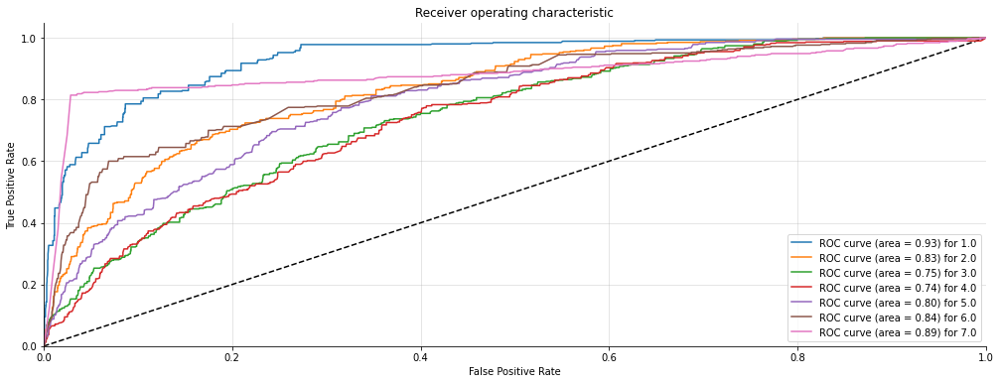

(3360, 7) (3360, 7)


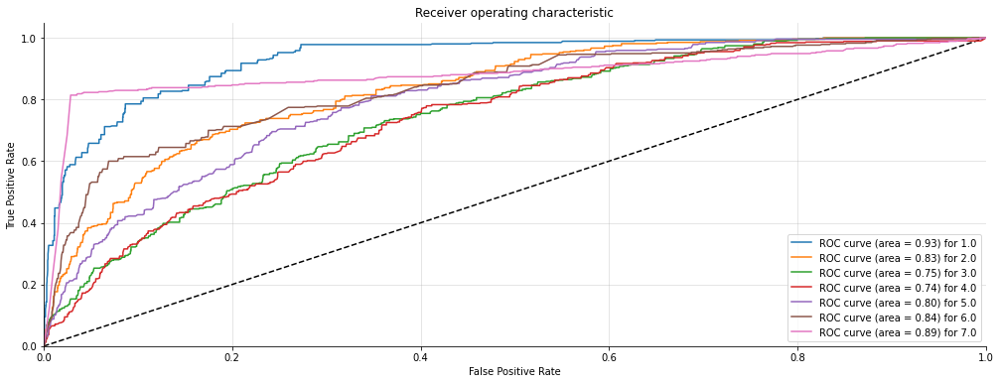

For column: complicated<==>easy
              precision    recall  f1-score   support

         1.0       0.57      0.81      0.67       463
         2.0       0.47      0.45      0.46       485
         3.0       0.45      0.33      0.38       501
         4.0       0.39      0.30      0.34       515
         5.0       0.47      0.49      0.48       460
         6.0       0.62      0.71      0.66       484
         7.0       0.89      0.90      0.90       452

    accuracy                           0.56      3360
   macro avg       0.55      0.57      0.55      3360
weighted avg       0.55      0.56      0.55      3360

Confusion Matrix: 
 [[375  27   9  22  10  20   0]
 [ 70 216  64  50  43  38   4]
 [ 53  99 163  89  53  42   2]
 [ 65  64  80 154 119  33   0]
 [ 53  22  21  61 224  79   0]
 [ 26  14  18  15  24 344  43]
 [ 11  14   5   5   6   3 408]]
Accuracy Score : 0.5607142857142857
Precision Score : 0.547393326263447
Recall Score : 0.5607142857142857
F1 Score : 0.54824683163369

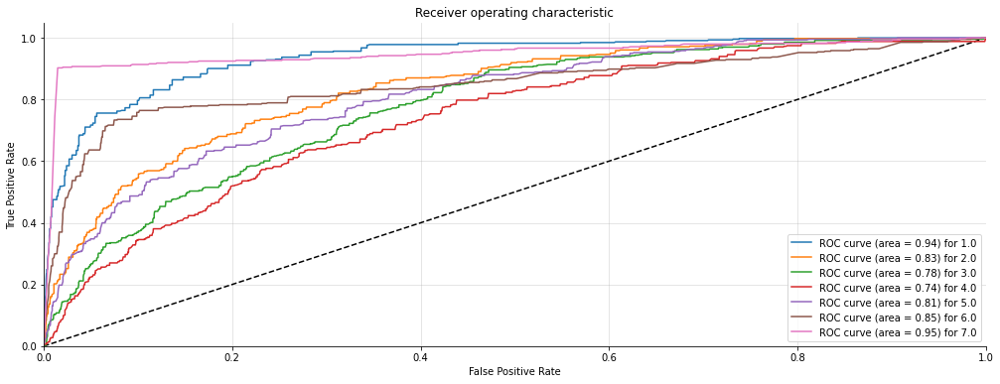

(3360, 7) (3360, 7)


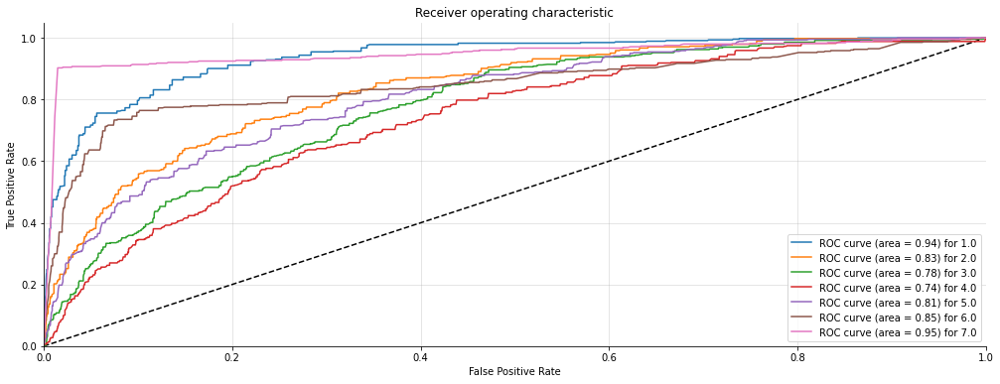

For column: inefficient<==>efficient
              precision    recall  f1-score   support

         1.0       0.59      0.78      0.67       462
         2.0       0.43      0.43      0.43       482
         3.0       0.47      0.35      0.41       506
         4.0       0.40      0.36      0.38       526
         5.0       0.46      0.41      0.43       458
         6.0       0.55      0.62      0.58       475
         7.0       0.81      0.83      0.82       451

    accuracy                           0.53      3360
   macro avg       0.53      0.54      0.53      3360
weighted avg       0.53      0.53      0.53      3360

Confusion Matrix: 
 [[362  38  15  15  11  21   0]
 [ 75 209  70  50  45  32   1]
 [ 55  94 179 102  27  41   8]
 [ 61  76  60 190 106  30   3]
 [ 38  29  25  72 187 107   0]
 [ 10  23  14  30  28 293  77]
 [ 17  17  14  14   6   8 375]]
Accuracy Score : 0.5342261904761905
Precision Score : 0.5251290274830271
Recall Score : 0.5342261904761905
F1 Score : 0.52574595

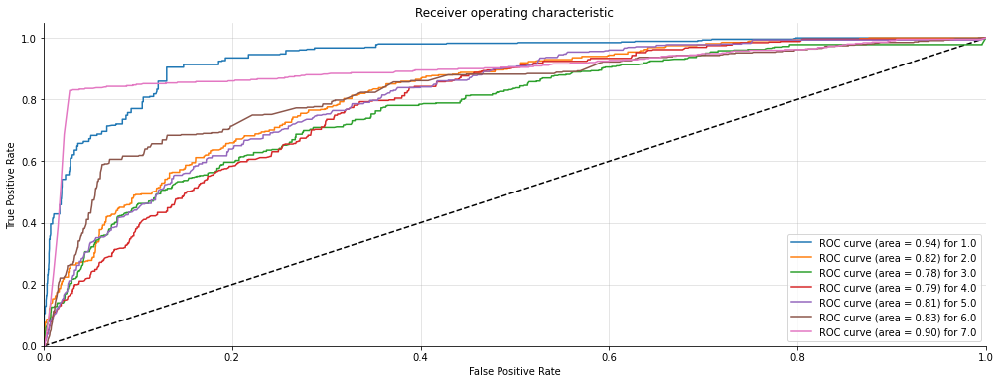

(3360, 7) (3360, 7)


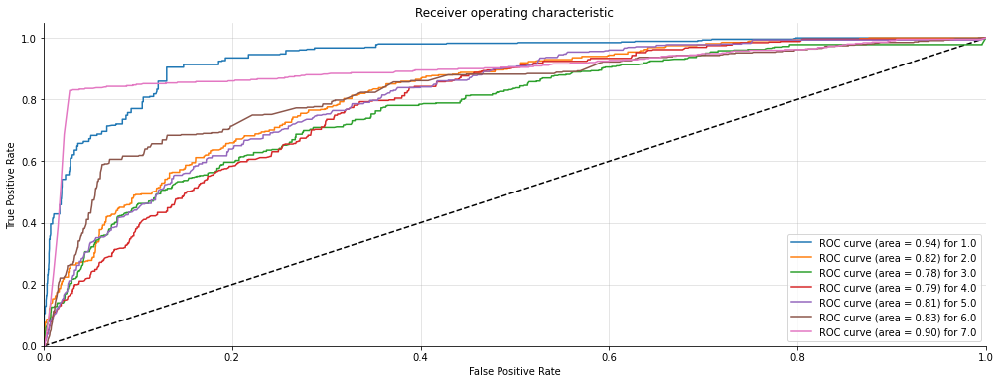

For column:  confusing<==>clear
              precision    recall  f1-score   support

         1.0       0.55      0.75      0.63       461
         2.0       0.44      0.47      0.45       488
         3.0       0.42      0.25      0.31       506
         4.0       0.41      0.29      0.34       516
         5.0       0.42      0.46      0.44       456
         6.0       0.50      0.63      0.56       471
         7.0       0.80      0.79      0.80       462

    accuracy                           0.51      3360
   macro avg       0.51      0.52      0.50      3360
weighted avg       0.50      0.51      0.50      3360

Confusion Matrix: 
 [[346  55  19  14  10  17   0]
 [ 74 230  44  54  34  51   1]
 [ 62 114 124  78  62  62   4]
 [ 62  62  70 148 135  39   0]
 [ 39  22  21  42 211 121   0]
 [ 27  12   9  10  31 296  86]
 [ 19  28  10  14  19   7 365]]
Accuracy Score : 0.5119047619047619
Precision Score : 0.5024280076362442
Recall Score : 0.5119047619047619
F1 Score : 0.4987064078720

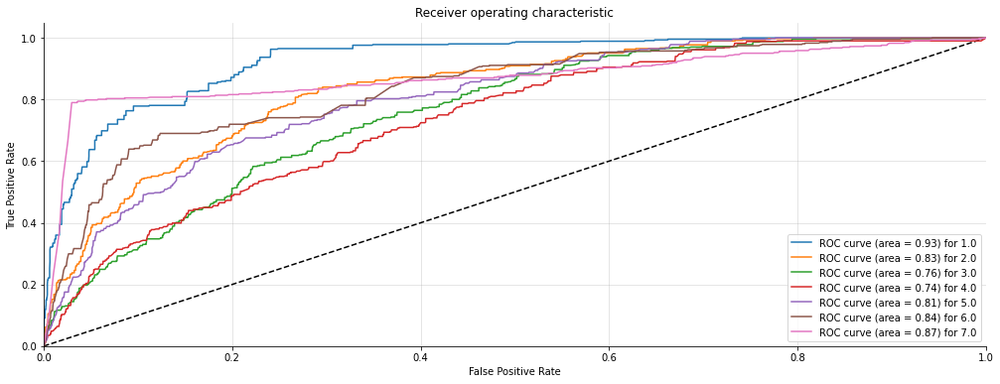

(3360, 7) (3360, 7)


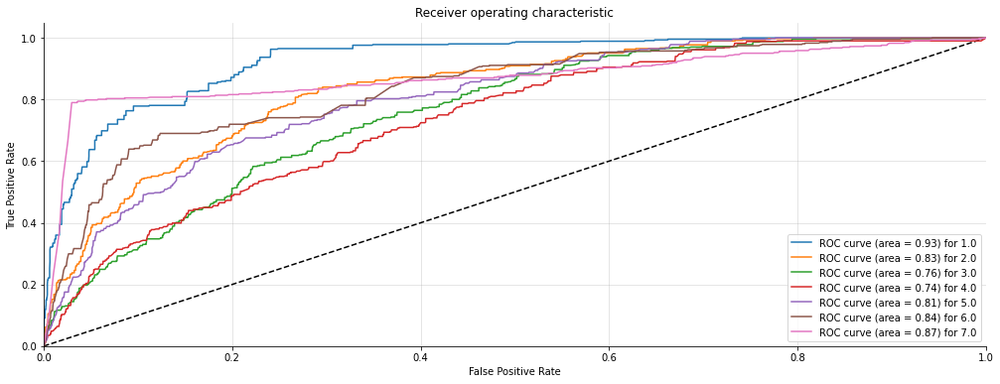

For column: boring<==>exciting
              precision    recall  f1-score   support

         1.0       0.56      0.75      0.64       463
         2.0       0.37      0.32      0.34       491
         3.0       0.51      0.50      0.50       487
         4.0       0.53      0.34      0.42       518
         5.0       0.62      0.55      0.58       487
         6.0       0.68      0.92      0.78       462
         7.0       0.99      0.99      0.99       452

    accuracy                           0.61      3360
   macro avg       0.61      0.62      0.61      3360
weighted avg       0.60      0.61      0.60      3360

Confusion Matrix: 
 [[346  54  12  13  18  20   0]
 [ 83 155 102  56  43  52   0]
 [ 52  65 243  50  39  38   0]
 [ 69  84  79 178  64  44   0]
 [ 56  41  42  36 269  43   0]
 [ 12  14   2   3   3 423   5]
 [  0   1   1   0   1   3 446]]
Accuracy Score : 0.6130952380952381
Precision Score : 0.6023657016841574
Recall Score : 0.6130952380952381
F1 Score : 0.59979150099182

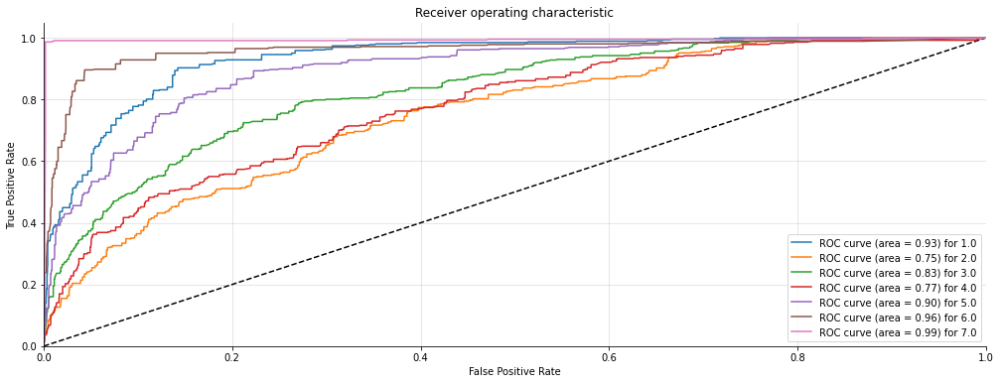

(3360, 7) (3360, 7)


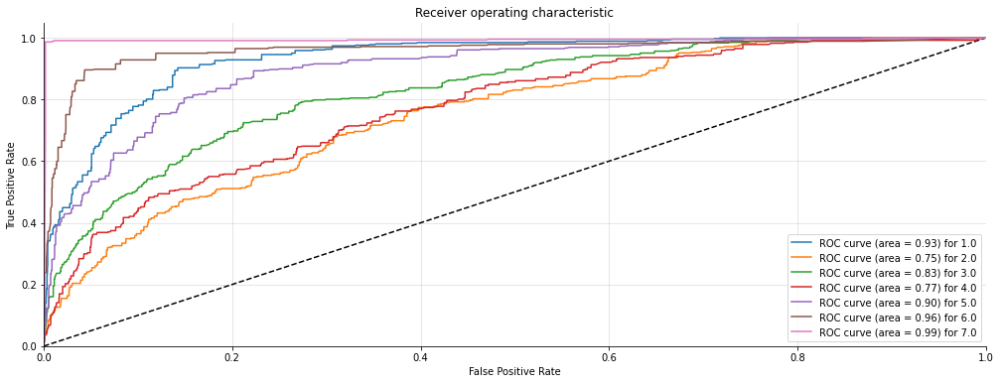

For column: not interesting<==>interesting
              precision    recall  f1-score   support

         1.0       0.52      0.70      0.60       461
         2.0       0.37      0.33      0.35       495
         3.0       0.45      0.31      0.37       490
         4.0       0.47      0.31      0.38       519
         5.0       0.50      0.53      0.51       481
         6.0       0.64      0.88      0.74       465
         7.0       0.99      0.99      0.99       449

    accuracy                           0.57      3360
   macro avg       0.56      0.58      0.56      3360
weighted avg       0.55      0.57      0.55      3360

Confusion Matrix: 
 [[323  49   7  19  27  36   0]
 [ 93 165  64  65  64  44   0]
 [ 57 110 153  44  71  55   0]
 [ 63  97  79 162  73  45   0]
 [ 75  27  30  43 254  52   0]
 [ 10   1  10  10  22 407   5]
 [  0   1   0   0   1   1 446]]
Accuracy Score : 0.5684523809523809
Precision Score : 0.5545626146683493
Recall Score : 0.5684523809523809
F1 Score : 0.55

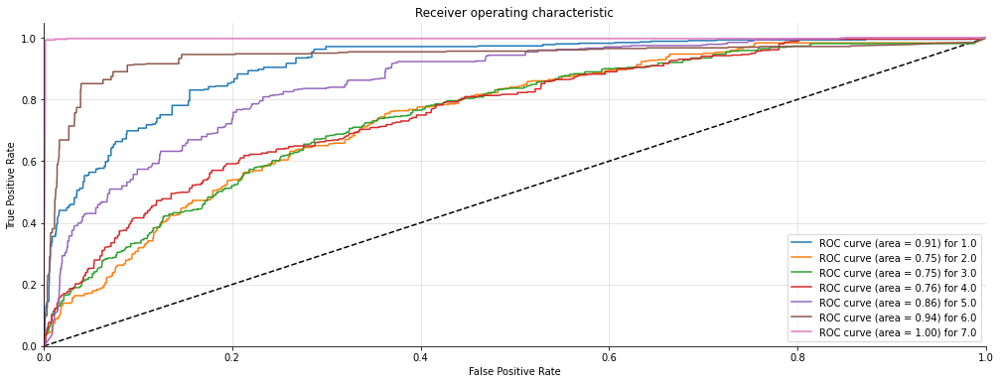

(3360, 7) (3360, 7)


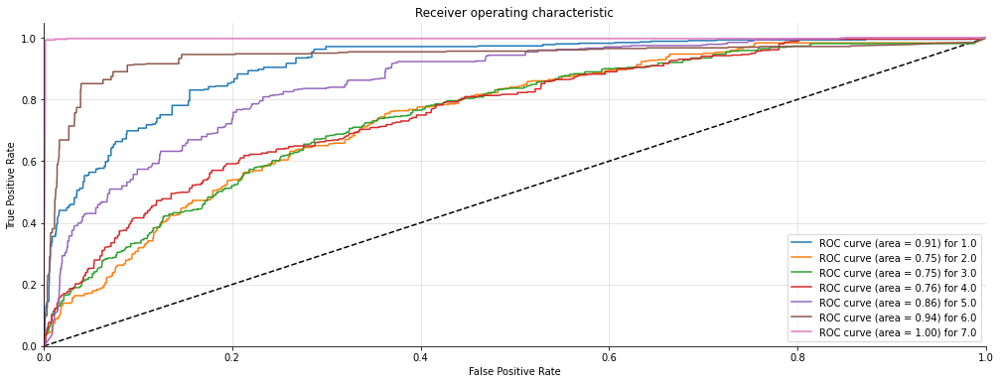

For column: conventional<==>inventive
              precision    recall  f1-score   support

         1.0       0.58      0.79      0.67       460
         2.0       0.52      0.38      0.44       502
         3.0       0.50      0.48      0.49       474
         4.0       0.56      0.42      0.48       527
         5.0       0.66      0.65      0.66       486
         6.0       0.68      0.87      0.76       459
         7.0       1.00      1.00      1.00       452

    accuracy                           0.65      3360
   macro avg       0.64      0.66      0.64      3360
weighted avg       0.64      0.65      0.63      3360

Confusion Matrix: 
 [[362  27  13  17  16  25   0]
 [ 80 191  90  53  45  43   0]
 [ 49  63 227  64  42  29   0]
 [ 57  55  77 221  55  62   0]
 [ 57  21  35  25 315  33   0]
 [ 18  12  10  16   2 401   0]
 [  0   0   0   1   0   0 451]]
Accuracy Score : 0.6452380952380953
Precision Score : 0.6378653206702248
Recall Score : 0.6452380952380953
F1 Score : 0.6345817

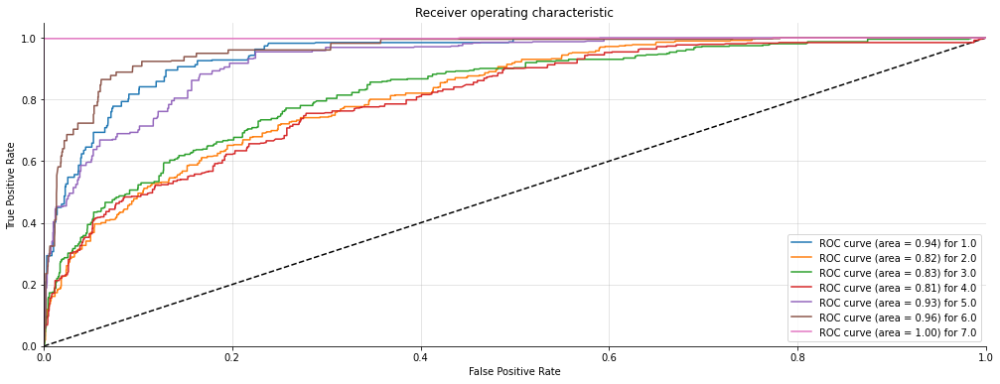

(3360, 7) (3360, 7)


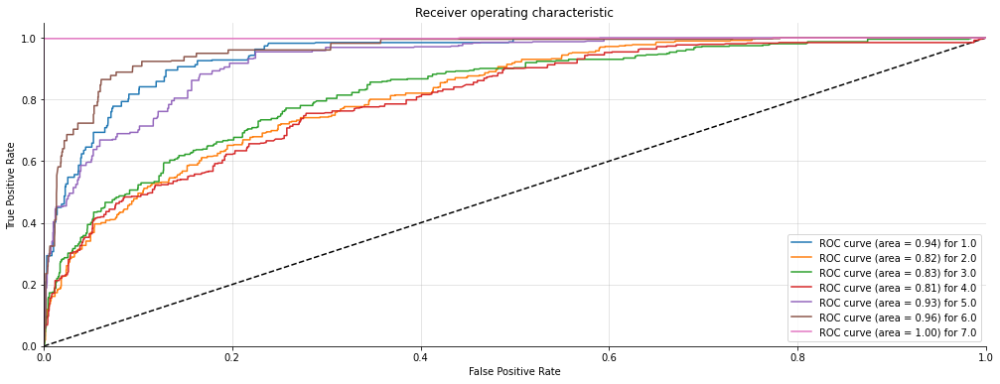

For column: usual<==>leading edge
              precision    recall  f1-score   support

         1.0       0.55      0.76      0.64       459
         2.0       0.34      0.24      0.29       496
         3.0       0.38      0.37      0.37       478
         4.0       0.43      0.31      0.36       523
         5.0       0.46      0.43      0.44       491
         6.0       0.64      0.87      0.74       462
         7.0       1.00      1.00      1.00       451

    accuracy                           0.56      3360
   macro avg       0.54      0.57      0.55      3360
weighted avg       0.54      0.56      0.54      3360

Confusion Matrix: 
 [[348  32  14  27   9  29   0]
 [ 94 121  73  72  88  48   0]
 [ 50  80 175  49  64  60   0]
 [ 74  57  99 163  83  47   0]
 [ 54  50  79  51 209  48   0]
 [ 11  12  17  18   0 404   0]
 [  0   0   0   0   0   0 451]]
Accuracy Score : 0.5568452380952381
Precision Score : 0.5363172029995765
Recall Score : 0.5568452380952381
F1 Score : 0.53891905159

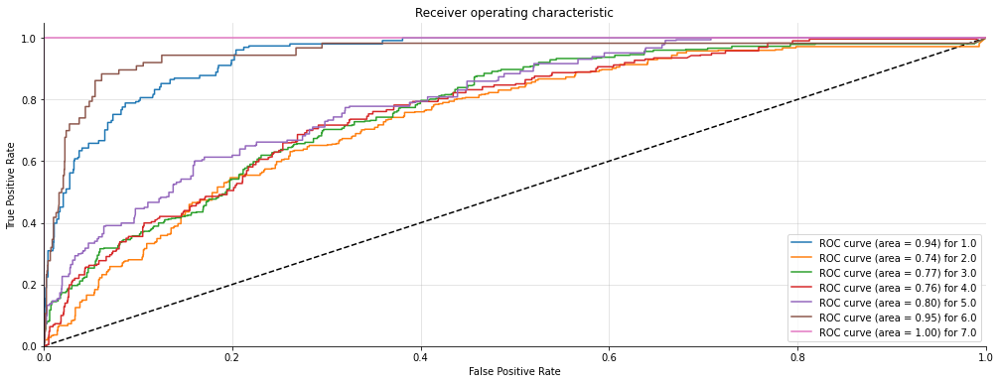

(3360, 7) (3360, 7)


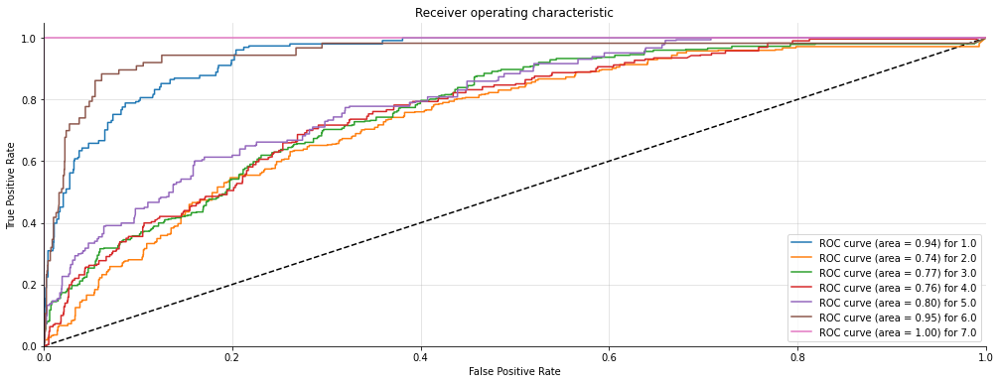

In [178]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]
fpo=dict()
tpo=dict()
ffpo=[]
ttpo=[]
def GBC(X_train, X_test, y_train, y_test, n_classes, figsize=(8, 6)):
    model = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0,
     max_depth=1, random_state=0)   
    model.fit(X_train, y_train)

    # predictions over test set
    predictions = [round(float(x)) for x in model.predict(X_test)]
    print((classification_report(y_test, predictions)))


    # calculating Accuracy Score, Precision Score, Recall Score and F1 Score
    print('Confusion Matrix: \n' ,confusion_matrix(y_test, predictions))
    acc.append(accuracy_score(y_test, predictions))
    print(f'Accuracy Score : {accuracy_score(y_test, predictions)}')
    pre.append(precision_score(y_test,predictions,average='weighted'))
    print('Precision Score : ' + str(precision_score(y_test,predictions,average='weighted')))
    recal.append(recall_score(y_test,predictions,average='weighted'))
    print('Recall Score : ' + str(recall_score(y_test,predictions,average='weighted')))
    f1.append(f1_score(y_test,predictions,average='weighted'))
    print('F1 Score : ' + str(f1_score(y_test,predictions,average='weighted')))
    rms.append(np.sqrt(mean_squared_error(y_test,predictions)))
    aucscore.append(score_auc(y_test,predictions))
    fpo,tpo=plot_multiclass_roc(model, X_test, y_test, n_classes)
    ffpo.append(fpo)
    ttpo.append(tpo)
    plot_multiclass_roc(model, X_test, y_test, n_classes)

for i in range(8):
  print('For column:', df.columns[1:][i])
  n_classes = len(np.unique(df[df.columns[1:][i]]))
  GBC(X_train, X_test, y_train[:,i], y_test[:,i], n_classes, figsize=(8, 6))

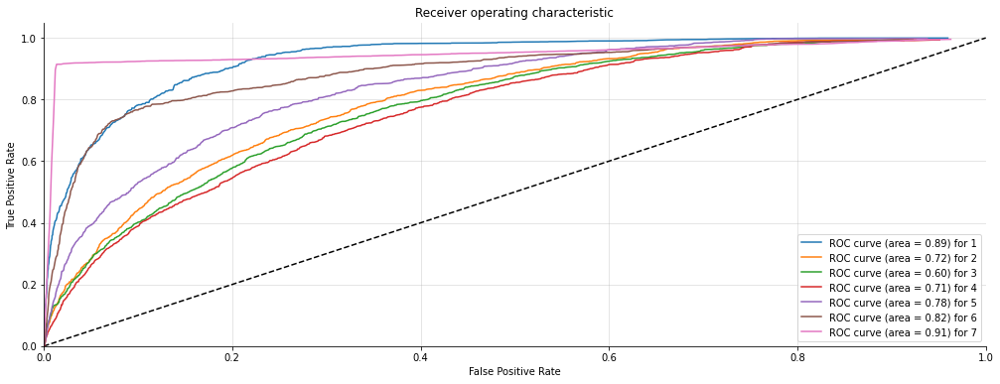

In [179]:
fsum0=list(np.array(dadd(dadd(dadd(ffpo[0][0],ffpo[1][0]),dadd(ffpo[2][0],ffpo[3][0])),dadd(dadd(ffpo[4][0],ffpo[5][0]),dadd(ffpo[6][0],ffpo[7][0]))))/8)
fsum1=list(np.array(dadd(dadd(dadd(ffpo[0][1],ffpo[1][1]),dadd(ffpo[2][1],ffpo[3][1])),dadd(dadd(ffpo[4][1],ffpo[5][1]),dadd(ffpo[6][1],ffpo[7][1]))))/8)
fsum2=list(np.array(dadd(dadd(dadd(ffpo[0][2],ffpo[1][2]),dadd(ffpo[2][2],ffpo[3][2])),dadd(dadd(ffpo[4][2],ffpo[5][2]),dadd(ffpo[6][2],ffpo[7][2]))))/8)
fsum3=list(np.array(dadd(dadd(dadd(ffpo[0][3],ffpo[1][3]),dadd(ffpo[2][3],ffpo[3][3])),dadd(dadd(ffpo[4][3],ffpo[5][3]),dadd(ffpo[6][3],ffpo[7][3]))))/8)
fsum4=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][4]),dadd(ffpo[2][4],ffpo[3][4])),dadd(dadd(ffpo[4][4],ffpo[5][4]),dadd(ffpo[6][4],ffpo[7][4]))))/8)
fsum5=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][5]),dadd(ffpo[2][5],ffpo[3][5])),dadd(dadd(ffpo[4][5],ffpo[5][5]),dadd(ffpo[6][5],ffpo[7][5]))))/8)
fsum6=list(np.array(dadd(dadd(dadd(ffpo[0][6],ffpo[1][6]),dadd(ffpo[2][6],ffpo[3][6])),dadd(dadd(ffpo[4][6],ffpo[5][6]),dadd(ffpo[6][6],ffpo[7][6]))))/8)

fpr=dict()

fpr[0]=fsum0
fpr[1]=fsum1
fpr[2]=fsum2
fpr[3]=fsum3
fpr[4]=fsum4
fpr[5]=fsum5
fpr[6]=fsum6


tsum0=list(np.array(dadd(dadd(dadd(ttpo[0][0],ttpo[1][0]),dadd(ttpo[2][0],ttpo[3][0])),dadd(dadd(ttpo[4][0],ttpo[5][0]),dadd(ttpo[6][0],ttpo[7][0]))))/8)
tsum1=list(np.array(dadd(dadd(dadd(ttpo[0][1],ttpo[1][1]),dadd(ttpo[2][1],ttpo[3][1])),dadd(dadd(ttpo[4][1],ttpo[5][1]),dadd(ttpo[6][1],ttpo[7][1]))))/8)
tsum2=list(np.array(dadd(dadd(dadd(ttpo[0][2],ttpo[1][2]),dadd(ttpo[2][2],ttpo[3][2])),dadd(dadd(ttpo[4][2],ttpo[5][2]),dadd(ttpo[6][2],ttpo[7][2]))))/8)
tsum3=list(np.array(dadd(dadd(dadd(ttpo[0][3],ttpo[1][3]),dadd(ttpo[2][3],ttpo[3][3])),dadd(dadd(ttpo[4][3],ttpo[5][3]),dadd(ttpo[6][3],ttpo[7][3]))))/8)
tsum4=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][4]),dadd(ttpo[2][4],ttpo[3][4])),dadd(dadd(ttpo[4][4],ttpo[5][4]),dadd(ttpo[6][4],ttpo[7][4]))))/8)
tsum5=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][5]),dadd(ttpo[2][5],ttpo[3][5])),dadd(dadd(ttpo[4][5],ttpo[5][5]),dadd(ttpo[6][5],ttpo[7][5]))))/8)
tsum6=list(np.array(dadd(dadd(dadd(ttpo[0][6],ttpo[1][6]),dadd(ttpo[2][6],ttpo[3][6])),dadd(dadd(ttpo[4][6],ttpo[5][6]),dadd(ttpo[6][6],ttpo[7][6]))))/8)

tpr=dict()

tpr[0]=tsum0
tpr[1]=tsum1
tpr[2]=tsum2
tpr[3]=tsum3
tpr[4]=tsum4
tpr[5]=tsum5
tpr[6]=tsum6

plot_multiclass_roc_avg(fpr,tpr,7)

In [180]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE {}".format(np.mean(rms)))
print("average AUC score {}".format(np.mean(aucscore)))
metric_df['GradientBoost'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.5633928571428573
average Precision :0.5511593637055798
average Recall :0.5633928571428573
average F1 -score :0.5502896323126116
average RMSE 1.5229950251826132
average AUC score 0.7451237114322514


# 4.7.6 Bagging classfier

In [181]:
from sklearn.ensemble import BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold

For column: obstructive<==>supportive
              precision    recall  f1-score   support

         1.0       0.94      0.96      0.95       462
         2.0       0.82      0.87      0.84       482
         3.0       0.74      0.67      0.70       510
         4.0       0.67      0.64      0.65       517
         5.0       0.61      0.68      0.64       467
         6.0       0.72      0.70      0.71       470
         7.0       0.81      0.81      0.81       452

    accuracy                           0.76      3360
   macro avg       0.76      0.76      0.76      3360
weighted avg       0.76      0.76      0.76      3360

Confusion Matrix: 
 [[442  20   0   0   0   0   0]
 [  4 419  48   2   4   5   0]
 [  5  26 340 121  12   5   1]
 [  0   1  26 331 155   4   0]
 [  5   2  18  19 316 107   0]
 [  4  19   8  10  18 328  83]
 [ 10  27  17  12  12   6 368]]
Accuracy Score : 0.7571428571428571
Precision Score : 0.7573766173609927
Recall Score : 0.7571428571428571
F1 Score : 0.7564990

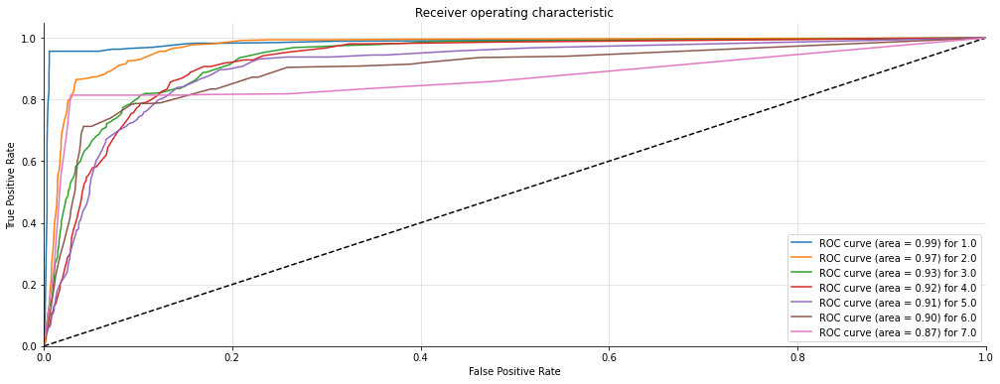

(3360, 7) (3360, 7)


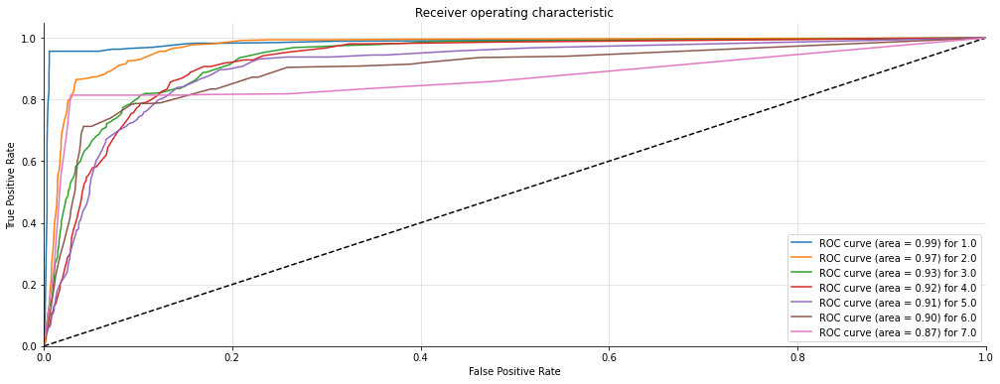

For column: complicated<==>easy
              precision    recall  f1-score   support

         1.0       0.93      0.95      0.94       463
         2.0       0.81      0.85      0.83       485
         3.0       0.71      0.70      0.70       501
         4.0       0.68      0.63      0.66       515
         5.0       0.69      0.75      0.72       460
         6.0       0.82      0.78      0.80       484
         7.0       0.90      0.90      0.90       452

    accuracy                           0.79      3360
   macro avg       0.79      0.79      0.79      3360
weighted avg       0.79      0.79      0.79      3360

Confusion Matrix: 
 [[442  19   1   0   0   1   0]
 [  8 412  52   9   1   3   0]
 [  5  26 349 111   9   1   0]
 [  0   7  49 324 130   5   0]
 [  4  11  16  14 347  68   0]
 [  5  16  17  13  14 376  43]
 [ 10  17   7   3   5   2 408]]
Accuracy Score : 0.7910714285714285
Precision Score : 0.7906753729845148
Recall Score : 0.7910714285714285
F1 Score : 0.7902816106480

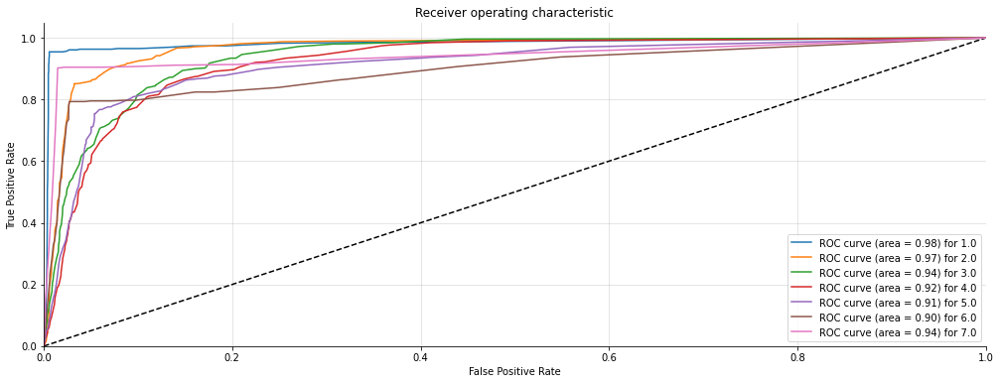

(3360, 7) (3360, 7)


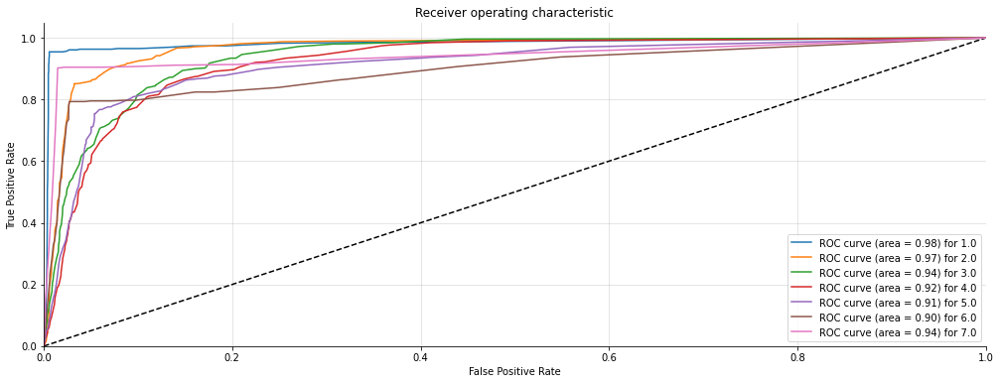

For column: inefficient<==>efficient
              precision    recall  f1-score   support

         1.0       0.94      0.96      0.95       462
         2.0       0.83      0.86      0.84       482
         3.0       0.72      0.70      0.71       506
         4.0       0.67      0.62      0.65       526
         5.0       0.63      0.68      0.65       458
         6.0       0.72      0.70      0.71       475
         7.0       0.83      0.83      0.83       451

    accuracy                           0.76      3360
   macro avg       0.76      0.76      0.76      3360
weighted avg       0.76      0.76      0.76      3360

Confusion Matrix: 
 [[442  18   1   0   0   1   0]
 [  8 414  55   3   2   0   0]
 [  1  20 356 114   9   6   0]
 [  0   2  41 326 154   3   0]
 [  3   3   8  16 313 115   0]
 [  6  17  20  14  10 331  77]
 [  9  26  15  11  10   6 374]]
Accuracy Score : 0.7607142857142857
Precision Score : 0.7601604021406755
Recall Score : 0.7607142857142857
F1 Score : 0.76002782

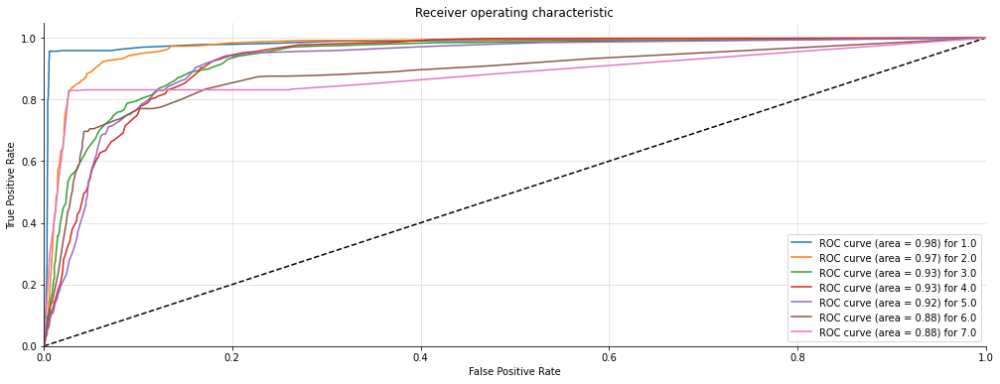

(3360, 7) (3360, 7)


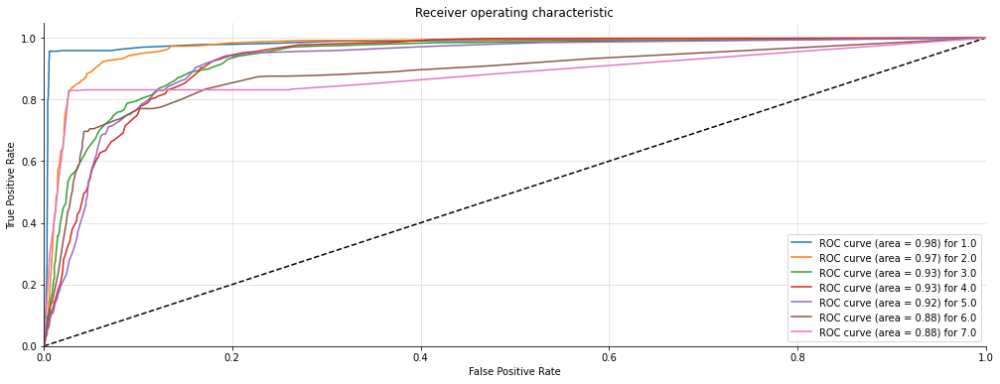

For column:  confusing<==>clear
              precision    recall  f1-score   support

         1.0       0.94      0.96      0.95       461
         2.0       0.79      0.86      0.82       488
         3.0       0.74      0.67      0.70       506
         4.0       0.66      0.66      0.66       516
         5.0       0.64      0.66      0.65       456
         6.0       0.72      0.70      0.71       471
         7.0       0.81      0.79      0.80       462

    accuracy                           0.75      3360
   macro avg       0.76      0.76      0.76      3360
weighted avg       0.75      0.75      0.75      3360

Confusion Matrix: 
 [[442  17   0   0   1   1   0]
 [  7 418  47   6   4   6   0]
 [  2  40 339 117   4   3   1]
 [  0   4  26 343 138   5   0]
 [  2   1  10  34 301 108   0]
 [  2  15  17   8  15 328  86]
 [ 15  35  18  15  10   4 365]]
Accuracy Score : 0.7547619047619047
Precision Score : 0.754452335211712
Recall Score : 0.7547619047619047
F1 Score : 0.75403949098663

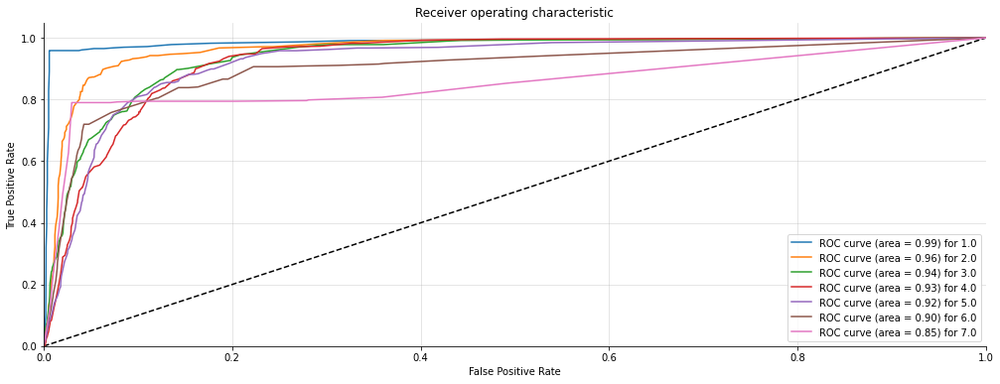

(3360, 7) (3360, 7)


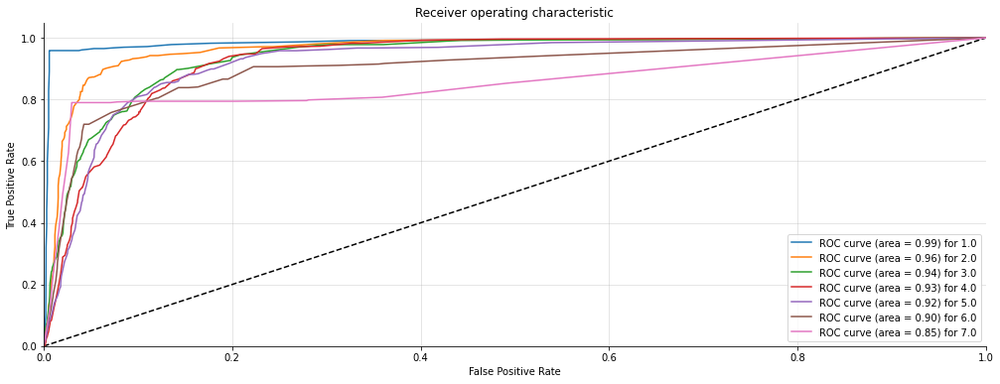

For column: boring<==>exciting
              precision    recall  f1-score   support

         1.0       0.96      0.95      0.96       463
         2.0       0.84      0.85      0.85       491
         3.0       0.80      0.77      0.78       487
         4.0       0.85      0.84      0.85       518
         5.0       0.88      0.92      0.90       487
         6.0       0.95      0.96      0.95       462
         7.0       0.99      0.99      0.99       452

    accuracy                           0.89      3360
   macro avg       0.90      0.90      0.90      3360
weighted avg       0.89      0.89      0.89      3360

Confusion Matrix: 
 [[442  17   1   0   2   1   0]
 [  7 418  53   7   3   3   0]
 [  8  36 373  57  12   1   0]
 [  3  16  23 435  37   4   0]
 [  1   6  11   8 450  11   0]
 [  1   4   3   2   4 443   5]
 [  0   0   2   0   1   3 446]]
Accuracy Score : 0.8949404761904762
Precision Score : 0.8943891172259371
Recall Score : 0.8949404761904762
F1 Score : 0.89452840034175

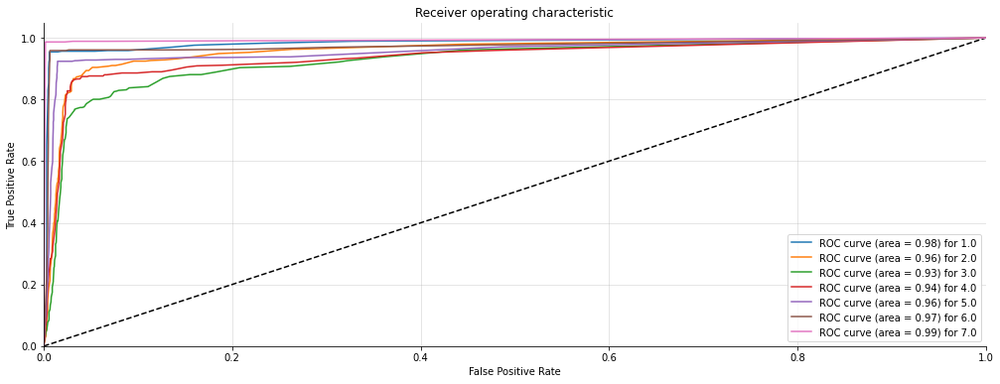

(3360, 7) (3360, 7)


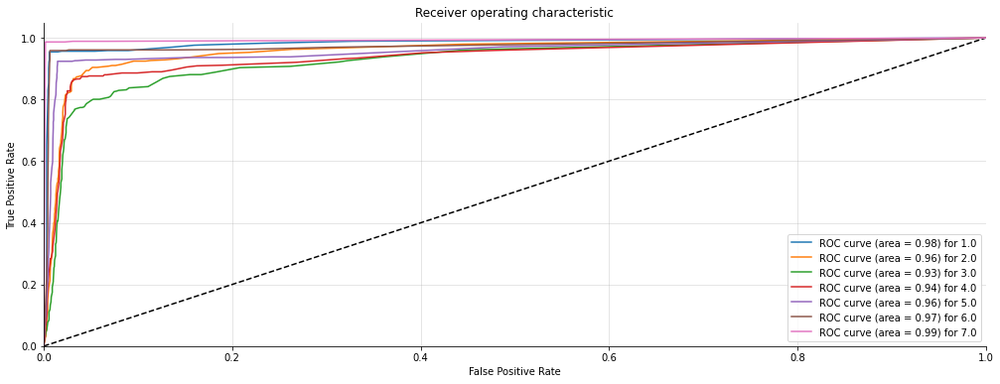

For column: not interesting<==>interesting
              precision    recall  f1-score   support

         1.0       0.93      0.96      0.95       461
         2.0       0.84      0.82      0.83       495
         3.0       0.79      0.75      0.77       490
         4.0       0.82      0.82      0.82       519
         5.0       0.86      0.91      0.88       481
         6.0       0.96      0.96      0.96       465
         7.0       0.99      0.99      0.99       449

    accuracy                           0.88      3360
   macro avg       0.88      0.89      0.88      3360
weighted avg       0.88      0.88      0.88      3360

Confusion Matrix: 
 [[442  18   1   0   0   0   0]
 [ 17 404  58   9   3   4   0]
 [  9  35 366  70   9   1   0]
 [  4  16  19 426  53   1   0]
 [  1   7  11  15 436  11   0]
 [  1   2   4   2   6 445   5]
 [  0   0   2   0   0   1 446]]
Accuracy Score : 0.8824404761904762
Precision Score : 0.8815282538126772
Recall Score : 0.8824404761904762
F1 Score : 0.88

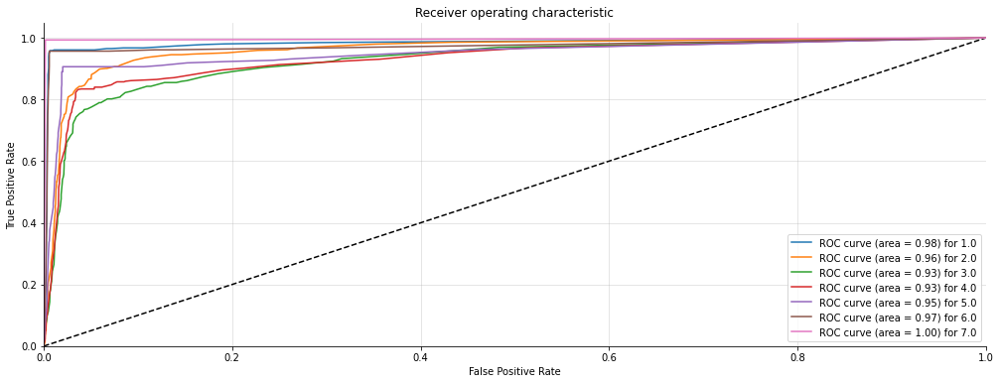

(3360, 7) (3360, 7)


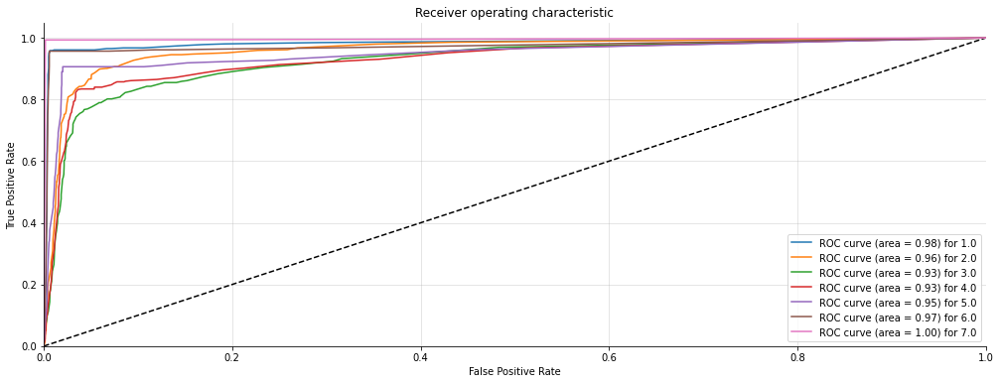

For column: conventional<==>inventive
              precision    recall  f1-score   support

         1.0       0.98      0.99      0.98       460
         2.0       0.95      0.90      0.93       502
         3.0       0.91      0.92      0.91       474
         4.0       0.92      0.92      0.92       527
         5.0       0.96      0.98      0.97       486
         6.0       0.98      0.99      0.98       459
         7.0       1.00      1.00      1.00       452

    accuracy                           0.96      3360
   macro avg       0.96      0.96      0.96      3360
weighted avg       0.96      0.96      0.96      3360

Confusion Matrix: 
 [[454   6   0   0   0   0   0]
 [  7 454  25  14   2   0   0]
 [  1  18 434  18   3   0   0]
 [  1   1  17 487  13   8   0]
 [  0   0   0   8 476   2   0]
 [  0   0   0   0   4 455   0]
 [  0   0   0   0   0   1 451]]
Accuracy Score : 0.955654761904762
Precision Score : 0.9555743228928286
Recall Score : 0.955654761904762
F1 Score : 0.955507814

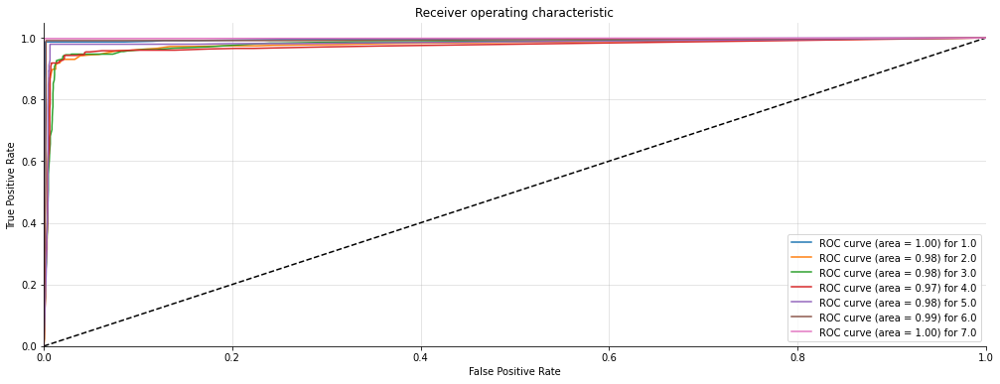

(3360, 7) (3360, 7)


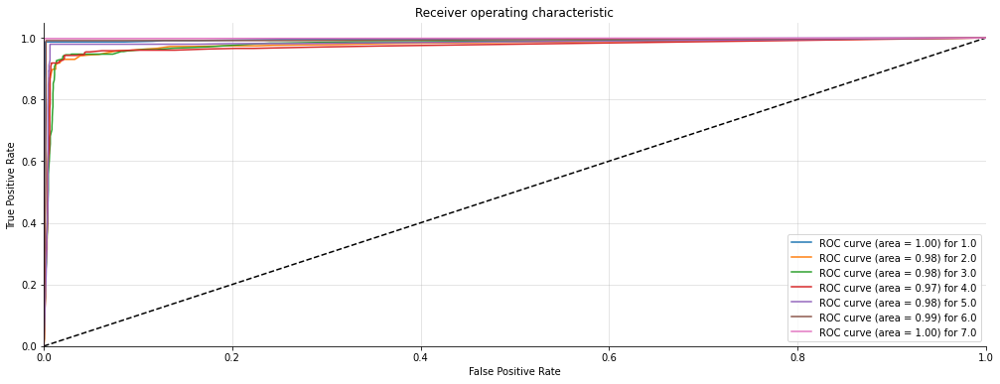

For column: usual<==>leading edge
              precision    recall  f1-score   support

         1.0       1.00      1.00      1.00       459
         2.0       0.99      0.98      0.99       496
         3.0       0.99      0.99      0.99       478
         4.0       0.98      0.97      0.97       523
         5.0       0.99      1.00      1.00       491
         6.0       0.99      1.00      1.00       462
         7.0       1.00      1.00      1.00       451

    accuracy                           0.99      3360
   macro avg       0.99      0.99      0.99      3360
weighted avg       0.99      0.99      0.99      3360

Confusion Matrix: 
 [[459   0   0   0   0   0   0]
 [  0 486   0   9   1   0   0]
 [  2   0 473   3   0   0   0]
 [  0   4   5 507   3   4   0]
 [  0   0   0   0 491   0   0]
 [  0   0   0   0   0 462   0]
 [  0   0   0   0   0   0 451]]
Accuracy Score : 0.9907738095238096
Precision Score : 0.990754127870503
Recall Score : 0.9907738095238096
F1 Score : 0.990750764595

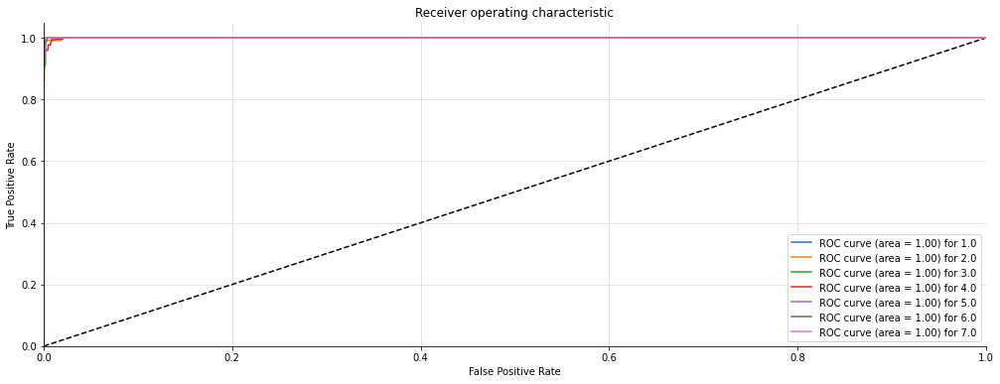

(3360, 7) (3360, 7)


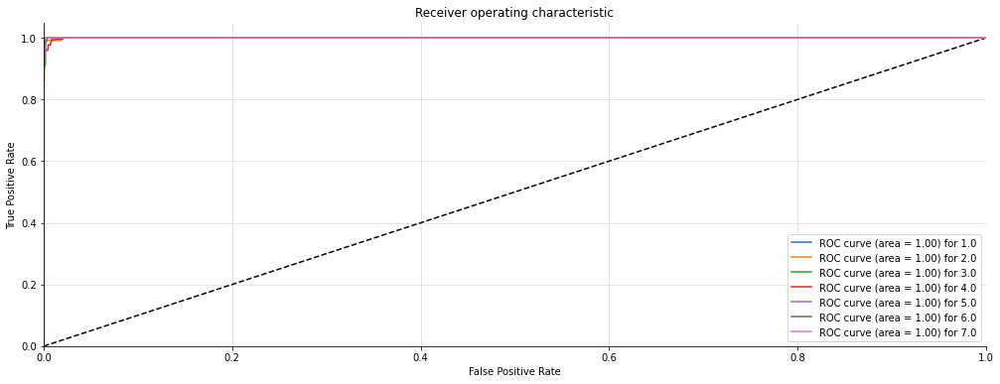

In [182]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]
fpo=dict()
tpo=dict()
ffpo=[]
ttpo=[]
def BAG(X_train, X_test, y_train, y_test, n_classes, figsize=(8, 6)):
    model = BaggingClassifier(KNeighborsClassifier(), max_samples=0.5, max_features=0.5)   
    model.fit(X_train, y_train)

    # predictions over test set
    predictions = [round(float(x)) for x in model.predict(X_test)]
    print((classification_report(y_test, predictions)))


    # calculating Accuracy Score, Precision Score, Recall Score and F1 Score
    print('Confusion Matrix: \n' ,confusion_matrix(y_test, predictions))
    acc.append(accuracy_score(y_test, predictions))
    print(f'Accuracy Score : {accuracy_score(y_test, predictions)}')
    pre.append(precision_score(y_test,predictions,average='weighted'))
    print('Precision Score : ' + str(precision_score(y_test,predictions,average='weighted')))
    recal.append(recall_score(y_test,predictions,average='weighted'))
    print('Recall Score : ' + str(recall_score(y_test,predictions,average='weighted')))
    f1.append(f1_score(y_test,predictions,average='weighted'))
    print('F1 Score : ' + str(f1_score(y_test,predictions,average='weighted')))
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    n_scores = cross_val_score(model, X_train, y_train, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
    # report performance
    print('Accuracy: %.3f (%.3f)' % (np.mean(n_scores), np.std(n_scores)))
    rms.append(np.sqrt(mean_squared_error(y_test,predictions)))
    aucscore.append(score_auc(y_test,predictions))
    fpo,tpo=plot_multiclass_roc(model, X_test, y_test, n_classes)
    ffpo.append(fpo)
    ttpo.append(tpo)
    plot_multiclass_roc(model, X_test, y_test, n_classes)

for i in range(8):
  print('For column:', df.columns[1:][i])
  n_classes = len(np.unique(df[df.columns[1:][i]]))
  BAG(X_train, X_test, y_train[:,i], y_test[:,i], n_classes, figsize=(8, 6))

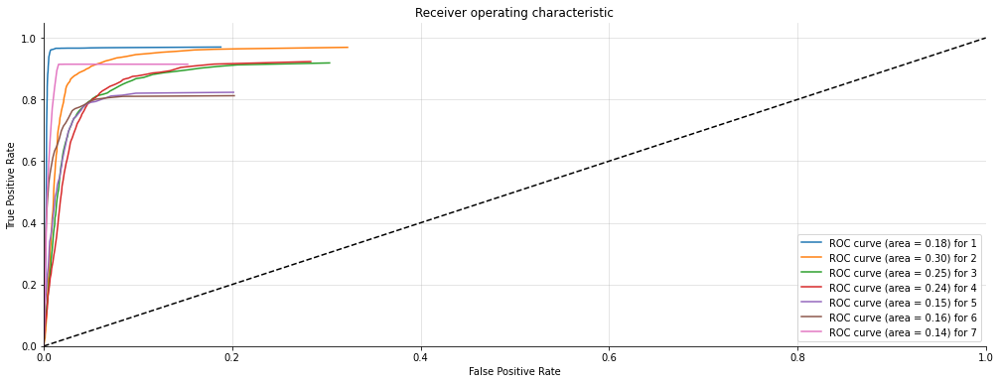

In [183]:
fsum0=list(np.array(dadd(dadd(dadd(ffpo[0][0],ffpo[1][0]),dadd(ffpo[2][0],ffpo[3][0])),dadd(dadd(ffpo[4][0],ffpo[5][0]),dadd(ffpo[6][0],ffpo[7][0]))))/8)
fsum1=list(np.array(dadd(dadd(dadd(ffpo[0][1],ffpo[1][1]),dadd(ffpo[2][1],ffpo[3][1])),dadd(dadd(ffpo[4][1],ffpo[5][1]),dadd(ffpo[6][1],ffpo[7][1]))))/8)
fsum2=list(np.array(dadd(dadd(dadd(ffpo[0][2],ffpo[1][2]),dadd(ffpo[2][2],ffpo[3][2])),dadd(dadd(ffpo[4][2],ffpo[5][2]),dadd(ffpo[6][2],ffpo[7][2]))))/8)
fsum3=list(np.array(dadd(dadd(dadd(ffpo[0][3],ffpo[1][3]),dadd(ffpo[2][3],ffpo[3][3])),dadd(dadd(ffpo[4][3],ffpo[5][3]),dadd(ffpo[6][3],ffpo[7][3]))))/8)
fsum4=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][4]),dadd(ffpo[2][4],ffpo[3][4])),dadd(dadd(ffpo[4][4],ffpo[5][4]),dadd(ffpo[6][4],ffpo[7][4]))))/8)
fsum5=list(np.array(dadd(dadd(dadd(ffpo[0][4],ffpo[1][5]),dadd(ffpo[2][5],ffpo[3][5])),dadd(dadd(ffpo[4][5],ffpo[5][5]),dadd(ffpo[6][5],ffpo[7][5]))))/8)
fsum6=list(np.array(dadd(dadd(dadd(ffpo[0][6],ffpo[1][6]),dadd(ffpo[2][6],ffpo[3][6])),dadd(dadd(ffpo[4][6],ffpo[5][6]),dadd(ffpo[6][6],ffpo[7][6]))))/8)

fpr=dict()

fpr[0]=fsum0
fpr[1]=fsum1
fpr[2]=fsum2
fpr[3]=fsum3
fpr[4]=fsum4
fpr[5]=fsum5
fpr[6]=fsum6


tsum0=list(np.array(dadd(dadd(dadd(ttpo[0][0],ttpo[1][0]),dadd(ttpo[2][0],ttpo[3][0])),dadd(dadd(ttpo[4][0],ttpo[5][0]),dadd(ttpo[6][0],ttpo[7][0]))))/8)
tsum1=list(np.array(dadd(dadd(dadd(ttpo[0][1],ttpo[1][1]),dadd(ttpo[2][1],ttpo[3][1])),dadd(dadd(ttpo[4][1],ttpo[5][1]),dadd(ttpo[6][1],ttpo[7][1]))))/8)
tsum2=list(np.array(dadd(dadd(dadd(ttpo[0][2],ttpo[1][2]),dadd(ttpo[2][2],ttpo[3][2])),dadd(dadd(ttpo[4][2],ttpo[5][2]),dadd(ttpo[6][2],ttpo[7][2]))))/8)
tsum3=list(np.array(dadd(dadd(dadd(ttpo[0][3],ttpo[1][3]),dadd(ttpo[2][3],ttpo[3][3])),dadd(dadd(ttpo[4][3],ttpo[5][3]),dadd(ttpo[6][3],ttpo[7][3]))))/8)
tsum4=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][4]),dadd(ttpo[2][4],ttpo[3][4])),dadd(dadd(ttpo[4][4],ttpo[5][4]),dadd(ttpo[6][4],ttpo[7][4]))))/8)
tsum5=list(np.array(dadd(dadd(dadd(ttpo[0][4],ttpo[1][5]),dadd(ttpo[2][5],ttpo[3][5])),dadd(dadd(ttpo[4][5],ttpo[5][5]),dadd(ttpo[6][5],ttpo[7][5]))))/8)
tsum6=list(np.array(dadd(dadd(dadd(ttpo[0][6],ttpo[1][6]),dadd(ttpo[2][6],ttpo[3][6])),dadd(dadd(ttpo[4][6],ttpo[5][6]),dadd(ttpo[6][6],ttpo[7][6]))))/8)

tpr=dict()

tpr[0]=tsum0
tpr[1]=tsum1
tpr[2]=tsum2
tpr[3]=tsum3
tpr[4]=tsum4
tpr[5]=tsum5
tpr[6]=tsum6

plot_multiclass_roc_avg(fpr,tpr,7)

In [184]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE {}".format(np.mean(rms)))
print("average AUC score {}".format(np.mean(aucscore)))
metric_df['BaggingClassifier'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.8484375
average Precision :0.84811381868748
average Recall :0.8484375
average F1 -score :0.8479222878300503
average RMSE 0.653467844569928
average AUC score 0.9113940135738643


In [185]:
metric_df

,metric,Neural network classifier,XGB,SVM,OrdinalModel,Bidirectional LSTM,RBFN,LogisticModel,Neural Network classifier 2,Bidirectional LSTM 2,DecisionTreeclasssifier,RandomForestClassifier,ExtraTreesClassifier,AdaBoost,GradientBoost,BaggingClassifier,CNN classifier
0,Accuracy,0.753051,0.863058,0.661979,0.862054,0.797842,0.188765,0.310305,0.800298,0.791257,0.861049,0.861868,0.860900,0.346912,0.563393,0.848437,0.000000
1,Precision,0.767403,0.863102,0.690407,0.862013,0.804331,0.664074,0.285199,0.808152,0.801958,0.860851,0.861873,0.860706,0.371631,0.551159,0.848114,0.000000
2,Recall,0.753051,0.863058,0.661979,0.862054,0.797842,0.188765,0.310305,0.800298,0.791257,0.861049,0.861868,0.860900,0.346912,0.563393,0.848437,0.000000
3,F1 Score,0.755043,0.862912,0.658335,0.861883,0.798158,0.105427,0.280362,0.800609,0.792897,0.860704,0.861739,0.860556,0.352342,0.550290,0.847922,0.000000
4,RMSE,0.781938,0.601694,1.450794,0.601928,0.686905,1.908164,2.431523,0.691063,0.681794,0.602019,0.609731,0.602399,2.076633,1.522995,0.653468,4.434207
5,AUC score,0.855624,0.919934,0.803131,0.919341,0.881656,0.520147,0.597932,0.883074,0.877817,0.918756,0.919235,0.918669,0.618472,0.745124,0.911394,0.499994


# CNN 1

In [106]:
filters=250
lstm_units=200
kernel_size=4

In [107]:
import nltk
import spacy

In [108]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, labels_processed, test_size=0.2, random_state=42)

# Sanity check again and again
print("Training examples:", X_train.shape)
print("Training labels:", y_train.shape)
print("Test examples:", X_test.shape)
print("Test labels:", y_test.shape)

Training examples: (13440, 20)
Training labels: (13440, 8)
Test examples: (3360, 20)
Test labels: (3360, 8)


In [109]:
word_index = tokenizer.word_index
nlp = spacy.load("en_core_web_lg")

In [110]:
text_embedding = np.zeros((len(word_index) + 1, 300))
for word, i in word_index.items():
   text_embedding[i] = nlp(word).vector

In [111]:
from tensorflow.keras.models import Sequential,Model
from tensorflow.keras.layers import Dense, LSTM, Embedding,Dropout,SpatialDropout1D,Conv1D,MaxPooling1D,GRU,BatchNormalization
from tensorflow.keras.layers import Input,Bidirectional,GlobalAveragePooling1D,GlobalMaxPooling1D,concatenate,LeakyReLU
from tensorflow.keras import regularizers
from tensorflow.keras import backend as K
model = Sequential()
model.add(
Embedding(input_dim=text_embedding.shape[0],
output_dim=text_embedding.shape[1],
weights=[text_embedding],
input_length=20,
trainable=False))
# model.add(SpatialDropout1D(0.2))
model.add(Conv1D(filters, kernel_size=kernel_size,kernel_regularizer=regularizers.l2(0.001), padding='same'))
model.add(LeakyReLU(alpha=0.2))
model.add(MaxPooling1D(pool_size=2))
# model.add(Bidirectional(LSTM(lstm_units,dropout=0.5, recurrent_dropout=0.5,return_sequences=True)))
# model.add(SpatialDropout1D(0.2))
# model.add(Conv1D(filters, kernel_size=kernel_size,kernel_regularizer=regularizers.l2(0.01), padding='same'))
# model.add(LeakyReLU(alpha=0.2))
# model.add(MaxPooling1D(pool_size=2))
# model.add(Bidirectional(LSTM(lstm_units,dropout=0.5, recurrent_dropout=0.5,return_sequences=True)))
# model.add(SpatialDropout1D(0.2))
model.add(Conv1D(filters, kernel_size=kernel_size,kernel_regularizer=regularizers.l2(0.001), padding='same'))
model.add(LeakyReLU(alpha=0.2))
model.add(MaxPooling1D(pool_size=2))
model.add(Bidirectional(LSTM(lstm_units,dropout=0.5, recurrent_dropout=0.5)))
model.add(Dense(8,activation='softmax'))
model.compile(optimizer='adam',loss=tf.keras.losses.MeanSquaredError(), metrics=['mae'])

In [112]:
model = Sequential()
 
model.add(
Embedding(input_dim=text_embedding.shape[0],
output_dim=text_embedding.shape[1],
weights=[text_embedding],
input_length=20,
trainable=False))
model.add(Conv1D(filters,
kernel_size,
padding='valid',
activation='relu',
strides=1))
# we use max pooling:
model.add(GlobalMaxPooling1D())
# We add a hidden layer:
model.add(Dense(lstm_units))
#dropout layer woth 20% dropout rate
model.add(Dropout(0.2))
model.add(Activation('relu'))
#output layer
model.add(Dense(8))
model.add(Activation('softmax'))
model.compile(optimizer='adam',loss=tf.keras.losses.MeanSquaredError(), metrics=['mae'])
              

In [113]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_3 (Embedding)      (None, 20, 300)           645300    
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 17, 250)           300250    
_________________________________________________________________
global_max_pooling1d (Global (None, 250)               0         
_________________________________________________________________
dense_21 (Dense)             (None, 200)               50200     
_________________________________________________________________
dropout_11 (Dropout)         (None, 200)               0         
_________________________________________________________________
module_wrapper (ModuleWrappe (None, 200)               0         
_________________________________________________________________
dense_22 (Dense)             (None, 8)                

In [114]:
history = model.fit(X_train, y_train, epochs=100, batch_size = 512, validation_split=0.2, 
                    callbacks = [es], # Call checkpoint variable if neccessary
                    verbose=1)

Epoch 1/100
21/21 [==============================] - 2s 84ms/step - loss: 19.1323 - mae: 3.8816 - val_loss: 18.9656 - val_mae: 3.8820
Epoch 2/100
21/21 [==============================] - 2s 84ms/step - loss: 19.1271 - mae: 3.8816 - val_loss: 18.9648 - val_mae: 3.8820
Epoch 3/100
21/21 [==============================] - 2s 83ms/step - loss: 19.1234 - mae: 3.8816 - val_loss: 18.9662 - val_mae: 3.8820
Epoch 4/100
21/21 [==============================] - 2s 101ms/step - loss: 19.1207 - mae: 3.8816 - val_loss: 18.9669 - val_mae: 3.8820
Epoch 5/100
21/21 [==============================] - 2s 98ms/step - loss: 19.1188 - mae: 3.8816 - val_loss: 18.9661 - val_mae: 3.8820
Epoch 6/100
21/21 [==============================] - 2s 94ms/step - loss: 19.1179 - mae: 3.8816 - val_loss: 18.9686 - val_mae: 3.8820
Epoch 7/100
21/21 [==============================] - 2s 83ms/step - loss: 19.1172 - mae: 3.8816 - val_loss: 18.9735 - val_mae: 3.8820
Epoch 8/100
21/21 [==============================] - 2s 93ms/

In [115]:
scores = model.evaluate(
    X_test, y_test, batch_size=1, verbose=1, sample_weight=None, steps=None,
    callbacks=None, max_queue_size=10, workers=4, use_multiprocessing=False,
    return_dict=False
)
print("------------------ EVALUATION FINISHED! ------------------".center(115))
for i in range(len(scores)):
    print("%s: %.2f%%" % (model.metrics_names[i], scores[i]*100))

3360/3360 [==============================] - 4s 1ms/step - loss: 18.6888 - mae: 3.8481
                             ------------------ EVALUATION FINISHED! ------------------                            
loss: 1868.88%
mae: 384.81%


In [116]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
from sklearn.metrics import mean_squared_error
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]

In [117]:
from sklearn.metrics import classification_report, f1_score
y_pred = model.predict(X_test)
for i in range(8):
    print("Column", df.columns[1:][i])
    estimates = [round(float(x)) for x in y_pred[:,i]]
    estimates = transform_results(estimates)
    print(np.unique(estimates))
    acc.append(accuracy_score(y_test[:,i], estimates))
    pre.append(precision_score(y_test[:,i], estimates,average='weighted'))
    recal.append(recall_score(y_test[:,i], estimates,average='weighted'))
    f1.append(f1_score(y_test[:,i], estimates,average='weighted'))
    rms.append(np.sqrt(mean_squared_error(y_test[:,i], estimates)))
    aucscore.append(score_auc(y_test[:,i], estimates))
    print(classification_report(y_test[:,i], estimates), "\n------")

Column obstructive<==>supportive
[0]
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00       0.0
         1.0       0.00      0.00      0.00     462.0
         2.0       0.00      0.00      0.00     482.0
         3.0       0.00      0.00      0.00     510.0
         4.0       0.00      0.00      0.00     517.0
         5.0       0.00      0.00      0.00     467.0
         6.0       0.00      0.00      0.00     470.0
         7.0       0.00      0.00      0.00     452.0

    accuracy                           0.00    3360.0
   macro avg       0.00      0.00      0.00    3360.0
weighted avg       0.00      0.00      0.00    3360.0
 
------
Column complicated<==>easy
[0]
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00       0.0
         1.0       0.00      0.00      0.00     463.0
         2.0       0.00      0.00      0.00     485.0
         3.0       0.00      0.00      0.00     501.0
  

In [118]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE -score :{}".format(np.mean(rms)))
print("average AUC -score :{}".format(np.mean(aucscore)))
metric_df['CNN classifier'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.0
average Precision :0.0
average Recall :0.0
average F1 -score :0.0
average RMSE -score :4.434206863533574
average AUC -score :0.49999408406429147


# Metric Display

In [119]:
metric_df

,metric,Neural network classifier,XGB,SVM,OrdinalModel,Bidirectional LSTM,RBFN,LogisticModel,Neural Network classifier 2,Bidirectional LSTM 2,DecisionTreeclasssifier,RandomForestClassifier,ExtraTreesClassifier,AdaBoost,GradientBoost,BaggingClassifier,CNN classifier
0,Accuracy,0.753051,0.863058,0.661979,0.862054,0.797842,0.188765,0.310305,0.800298,0.791257,0.861049,0.861868,0.860900,0.347098,0.563393,0.849591,0.000000
1,Precision,0.767403,0.863102,0.690407,0.862013,0.804331,0.664074,0.285199,0.808152,0.801958,0.860851,0.861873,0.860706,0.371752,0.551159,0.849161,0.000000
2,Recall,0.753051,0.863058,0.661979,0.862054,0.797842,0.188765,0.310305,0.800298,0.791257,0.861049,0.861868,0.860900,0.347098,0.563393,0.849591,0.000000
3,F1 Score,0.755043,0.862912,0.658335,0.861883,0.798158,0.105427,0.280362,0.800609,0.792897,0.860704,0.861739,0.860556,0.352468,0.550290,0.849153,0.000000
4,RMSE,0.781938,0.601694,1.450794,0.601928,0.686905,1.908164,2.431523,0.691063,0.681794,0.602019,0.609731,0.602399,2.076554,1.522995,0.646949,4.434207
5,AUC score,0.855624,0.919934,0.803131,0.919341,0.881656,0.520147,0.597932,0.883074,0.877817,0.918756,0.919235,0.918669,0.618581,0.745124,0.912053,0.499994
